# EXECUTIVE SUMMARY

1. Optimum Machine Model Chosen: Logistic regression,
2. Accuracy Score: 
3. Cross Validation Score: 
4. Final Accuracy Score(After Hyperparamter Tunning): 
5. RMSE:
6. Key Operations executed: Exploratory Data Analysis(EDA), Data Preprocessing(Univariate,Bivariate,Multivariate), Metrics Measurement, Model Execution and Hyperparameter Tunning

# PROJECT CONTENTS
- Problem Statement
- Domain Knowledge
- Step 1: Attributes of Variables
- Step 2: LOAD DATA SET, DATA DESCRIPTIVE ANALYSIS AND OBSERVATIONS
     - 2.1:Import all necessary libraries
     - 2.2:Load Dataset
     - 2.3:Descriptive Analysis
     - 2.4:Observations
- Step 3: Exploratory Data Analysis
     - 3.1:Encoding
     - 3.2:Normal Distribution Check(Univariate Analysis)
     - 3.3:Scatter Plot Check(Bivariate Analysis)
     - 3.4:Correlation Check(Collinearity and Multicollinearity)- Multivariate Analysis
     - 3.5:Outlier Check
     - 3.6:Skewness Check
     - 3.7:Categorical Variable(s) Check
- Step 4: DATA PREPROCESSING
     - 4.1:Removal of Duplicates
     - 4.2:Dropping of Features that strongly promotes multicollinearity(VIF)
     - 4.3:Removal of Outliers
     - 4.4:Transforming Data to Remove Skewness using Power transformation
     - 4.5:Seperating the datasets into X and Y variables
- Step 5: MODEL BUILDING
     - 5.1:Linear Regression
     - 5.2:RandomForest Regressor
     - 5.3:AdaBoost Regressor
     - 5.4:GradientBoosting Regressor
     - 5.5:XGBoost Regressor
     - 5.6:ExtraTrees Regressor
     - 5.7:Support Vector Regressor(SVR)
- Step 6:COMPARING ALL MACHINE LEARNING MODELS
     - 6.1:Comparing Differences between Accuracy and Cross_Validation Scores...
     - 6.2:Conclusion on Choice of Model
- Step 7:HYPERPARAMETER TUNNING
- Step 8:MODEL SAVING

# PROBLEM STATEMENT(Weather Forecasting)

Rainfall Prediction - Weather Forecasting
Problem Statement:
Rain Prediction –Weather forecasting
Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 

a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b) Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv
https://github.com/dsrscientist/dataset3

# Domain Knowledge
This is critical stage in any machine learning process. It involves brainstorming and coming up with as many hypothesis as possible about what could affect the target variable. It facilitates in exploring the data at hand more efficiently and effectively. Domain Knowledge should be done before seeing the data or else we will end up with biased hypotheses. Below are some anticipated assertions on the problem statement.


# Step 1 - ATTRIBUTES OF VARIABLES

Dataset Description:
Number of columns: 23

Date  - The date of observation

Location  -The common name of the location of the weather station

MinTemp  -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Rainfall  -The amount of rainfall recorded for the day in mm

Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine  -The number of hours of bright sunshine in the day.

WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am. 

Cloud3pm -Fraction of sky obscured by cloud 

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".


Dataset available below

# Step 2 - IMPORT ALL NECESSARY LIBRARIES, LOAD DATA SET, DATA DESCRIPTIVE ANALYSIS AND OBSERVATIONS

# Step 2.1 - Import all necessary libraries

In [312]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.neighbors import KNeighborsRegressor,KNeighborsClassifier
from sklearn.tree import DecisionTreeRegressor,DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor,ExtraTreesRegressor,RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier,ExtraTreesClassifier
from xgboost import XGBRegressor,XGBClassifier
from sklearn.svm import SVR,SVC
from sklearn.preprocessing import StandardScaler,power_transform,PowerTransformer,LabelEncoder,OrdinalEncoder
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV, RandomizedSearchCV
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score, classification_report, plot_roc_curve,mean_squared_error,mean_absolute_error
from scipy.stats import zscore
from collections import Counter
from sklearn import metrics
import seaborn as sns
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
from collections import Counter
import pickle


import warnings
warnings.filterwarnings('ignore')

# Step 2.2 - Load Dataset

In [61]:
#Load dataset
df=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv')
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [62]:
#checking the first five rows
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [63]:
#checking the last five rows
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [64]:
#picking 4 random samples
df.sample(4)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8371,2012-10-27,Darwin,25.2,34.1,0.0,7.6,10.2,NW,37.0,WSW,...,72.0,61.0,1010.5,1006.5,5.0,3.0,29.9,32.1,No,Yes
3057,2016-06-11,Williamtown,9.9,18.0,0.0,NaN,NaN,NW,50.0,NW,...,50.0,42.0,1023.9,1021.9,NaN,NaN,13.6,17.7,No,No
7911,2013-10-31,PerthAirport,14.4,26.0,0.0,8.0,10.0,W,33.0,SW,...,59.0,46.0,1016.7,1015.2,6.0,7.0,22.2,25.4,No,No
6363,2011-09-21,Brisbane,15.8,25.1,0.0,5.0,11.2,E,31.0,SE,...,56.0,46.0,1019.2,1017.1,2.0,1.0,22.5,23.6,No,No


# Step 2.3 - Data Descriptive Analysis

In [65]:
#checking the data shape
df.shape

(8425, 23)

In [66]:
#checking for nature of datatypes
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [67]:
#Checking data info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [68]:
#Checking data description for all numerical columns
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000
75%,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


In [69]:
#Checking data description for all non-numerical columns
numerics = ['int8','int16','int32','int64','float16','float32','float64']#enlisiting and storing possible data types of continuous data. This means any continuous data MUST have any of this type of data type
categorical_columns=[]#initializing an emty list
features = df.columns.values.tolist()#Pulling all the features(columns) of the dataset and storing in features
for col in features:#col is the iterating variable
    if df[col].dtype in numerics:
        continue
    categorical_columns.append(col)
df[categorical_columns].describe()

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
count,8425,8425,7434,7596,8117,8185,8186
unique,3004,12,16,16,16,2,2
top,2011-01-31,Melbourne,N,N,SE,No,No
freq,5,1622,713,906,813,6195,6195


In [70]:
#lets check the columns
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [71]:
#Checking for null values
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [72]:
#Checking for null values
df.isnull().sum().sum()

19472

In [73]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [74]:
for category in categorical_columns:
    print(category)

Date
Location
WindGustDir
WindDir9am
WindDir3pm
RainToday
RainTomorrow


In [75]:
#Checking the content of each Categorical columns
print("The Value Counts in Date - ",Counter(df['Date']))
print("The Value Counts in Location - ",Counter(df['Location']))
print("The Value Counts in WindGustDir - ",Counter(df['WindGustDir']))
print("The Value Counts in WindDir9am - ",Counter(df['WindDir9am']))
print("The Value Counts in WindDir3pm - ",Counter(df['WindDir3pm']))
print("The Value Counts in RainToday - ",Counter(df['RainToday']))
print("The Value Counts in RainTomorrow - ",Counter(df['RainTomorrow']))

The Value Counts in Date -  Counter({'2011-01-19': 5, '2011-01-20': 5, '2011-01-21': 5, '2011-01-22': 5, '2011-01-23': 5, '2011-01-24': 5, '2011-01-25': 5, '2011-01-26': 5, '2011-01-27': 5, '2011-01-28': 5, '2011-01-29': 5, '2011-01-30': 5, '2011-01-31': 5, '2011-02-01': 5, '2011-02-02': 5, '2011-02-03': 5, '2011-02-04': 5, '2011-02-05': 5, '2011-02-06': 5, '2011-02-07': 5, '2011-02-08': 5, '2011-02-09': 5, '2011-02-10': 5, '2011-02-11': 5, '2011-02-12': 5, '2011-02-13': 5, '2011-02-14': 5, '2011-02-15': 5, '2011-02-16': 5, '2011-02-17': 5, '2011-02-18': 5, '2011-02-19': 5, '2011-02-20': 5, '2011-02-21': 5, '2011-02-22': 5, '2011-02-23': 5, '2011-02-24': 5, '2011-02-25': 5, '2011-02-26': 5, '2011-02-27': 5, '2011-02-28': 5, '2011-03-01': 5, '2011-03-02': 5, '2011-03-03': 5, '2011-03-04': 5, '2011-03-05': 5, '2011-03-06': 5, '2011-03-07': 5, '2011-03-08': 5, '2011-03-09': 5, '2011-03-10': 5, '2011-03-11': 5, '2011-03-12': 5, '2011-03-13': 5, '2011-03-14': 5, '2011-03-15': 5, '2011-03-16

In [76]:
#Checking the content of each Categorical columns
df['Date'].value_counts()

2011-01-31    5
2011-05-08    5
2011-05-21    5
2011-05-20    5
2011-05-19    5
             ..
2013-01-28    1
2013-01-29    1
2013-01-30    1
2013-01-31    1
2013-06-08    1
Name: Date, Length: 3004, dtype: int64

In [77]:
df['Location'].value_counts()

Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64

In [78]:
df['WindGustDir'].value_counts()

N      713
SSE    578
S      577
SW     572
E      557
WNW    531
W      507
WSW    504
SE     484
ENE    415
SSW    396
NW     383
NE     353
NNE    343
ESE    302
NNW    219
Name: WindGustDir, dtype: int64

In [79]:
df['WindDir9am'].value_counts()

N      906
SW     704
NW     625
WSW    543
SE     505
WNW    480
SSW    467
ENE    433
NNE    430
W      414
NE     409
S      402
E      380
SSE    365
NNW    280
ESE    253
Name: WindDir9am, dtype: int64

In [80]:
df['RainToday'].value_counts()

No     6195
Yes    1990
Name: RainToday, dtype: int64

In [81]:
df['WindDir3pm'].value_counts()

SE     813
S      742
SSE    623
WSW    580
NE     544
N      524
SW     494
WNW    487
NW     468
W      462
ESE    462
E      460
ENE    417
SSW    370
NNE    365
NNW    306
Name: WindDir3pm, dtype: int64

In [82]:
df['RainTomorrow'].value_counts()

No     6195
Yes    1991
Name: RainTomorrow, dtype: int64

In [83]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [84]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [85]:
df.shape

(8425, 23)

# Step 2.4 - Observations


# The Train Dataset is made up of;
- 8425 rows and 23 columns
- 22 features and 1 Target

       '
# Description of Features:
1. Date: 
- It is made up of Categorical data
- It has no null values
- Its Datatype is an Object type

2. Location:
- It is made up of Categorical data
- It has no null values
- Its Datatype is an Object type

3. MinTemp: 
- It is made up of Continuos data
- It has no null values
- Its Datatype is an floating type

4. MaxTemp:
- It is made up of Continuos data
- It has no null values
- Its Datatype is an floating type

5. Rainfall: 
- It is made up of Continuos data
- It has no null values
- Its Datatype is an floating type

6. Evaporation:
- It is made up of Continuos data
- It has no null values
- Its Datatype is an floating type

7. Sunshine: 
- It is made up of Continuos data
- It has no null values
- Its Datatype is an floating type

8. WindGustDir:
- It is made up of Categorical data
- - It has no null values
- Its Datatype is an Object type

9. WindGustSpeed: 
- It is made up of Continuos data
- It has no null values
- Its Datatype is an floating type

10. WindDir9am: 
- It is made up of Categorical data
- It has no null values
- Its Datatype is an Object type

11. WindDir3pm: 
- It is made up of Categorical data
- It has no null values
- Its Datatype is an Object type

12. WindSpeed9am: 
- It is made up of Continuos data
- It has no null values 
- Its Datatype is an floating type

13. WindSpeed3pm:
- It is made up of Continuos data
- It has no null values
- Its Datatype is an floating type

14. Humidity9am: 
- It is made up of Categorical data
- It has no null values
- Its Datatype is an Object type

15. Humidity3pm:
- It is made up of Categorical data
- It has no null values
- Its Datatype is an Object type

16. Pressure9am: 
- It is made up of Continuos data
- It has no null values
- Its Datatype is an floating type

17. Pressure3pm:
- It is made up of Continuos data
- It has no null values
- Its Datatype is an floating type

18. Cloud9am: 
- It is made up of Continuos data
- It has no null values
- Its Datatype is an floating type

19. Cloud3pm:
- It is made up of Continuos data
- It has no null values
- Its Datatype is an interger type

20. Temp9am: 
- It is made up of Continuos data
- It has no null values
- Its Datatype is an floating type

21. Temp3pm: 
- It is made up of Continuos data
- It has no null values
- Its Datatype is an floating type
22. RainToday: 
- It is made up of Categorical data
- It has no null values
- Its Datatype is an Object type
 
22. RainTomorrow:
- It is made up of Categorical data
- It has no null values
- Its Datatype is an Object type


# About the Target/Label:
23. RainToday: 
- It is made up of Categorical data
- It has no null values
- Its Datatype is an Object type

**Since the target is made up of a continuos data hence this is a REGRESSION PROBLEM!
#The second is prediction of raintomorrow which is categorical data

# Step 3 - EXPLORATORY DATA ANALYSIS(EDA) AND VISUALIZATION
The objectives of the EDA is to ensure;
1. Independent Features will have a normal distribution using Data Transformation to remove skewness
2. Datasets will have the same scale using Normalization and Standardization
3. Column mean will be zero
4. Standard Deviation of the data should be 1

# Step 3.1 Count Distribution of Categorical Data - Univariate Analysis

2011-01-31    5
2011-05-08    5
2011-05-21    5
2011-05-20    5
2011-05-19    5
             ..
2013-01-28    1
2013-01-29    1
2013-01-30    1
2013-01-31    1
2013-06-08    1
Name: Date, Length: 3004, dtype: int64


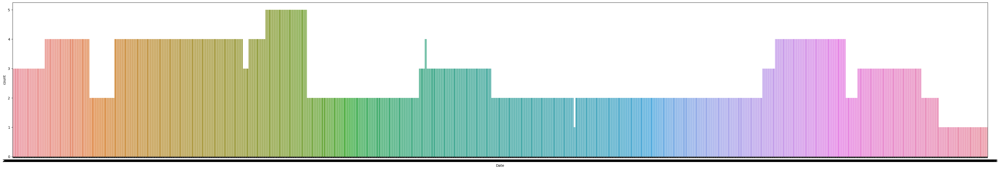

In [87]:
#Date
plt.figure(figsize=(50,8))
ax=sns.countplot(x='Date',data=df)
print(df['Date'].value_counts())

Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64


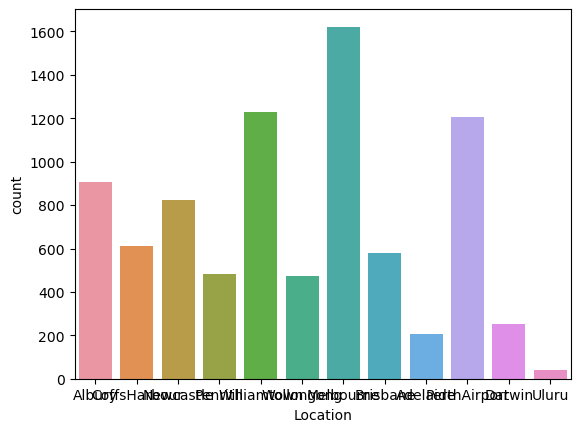

In [88]:
#Location
ax=sns.countplot(x='Location',data=df)
print(df['Location'].value_counts())

N      906
SW     704
NW     625
WSW    543
SE     505
WNW    480
SSW    467
ENE    433
NNE    430
W      414
NE     409
S      402
E      380
SSE    365
NNW    280
ESE    253
Name: WindDir9am, dtype: int64


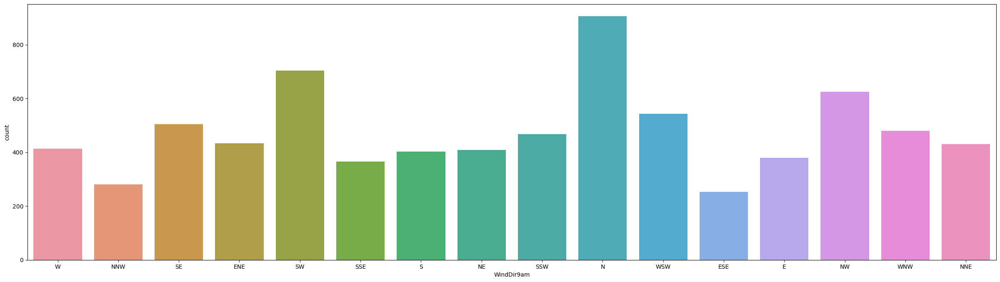

In [89]:
#WindDir9am
plt.figure(figsize=(30,8))
ax=sns.countplot(x='WindDir9am',data=df)
print(df['WindDir9am'].value_counts())

SE     813
S      742
SSE    623
WSW    580
NE     544
N      524
SW     494
WNW    487
NW     468
W      462
ESE    462
E      460
ENE    417
SSW    370
NNE    365
NNW    306
Name: WindDir3pm, dtype: int64


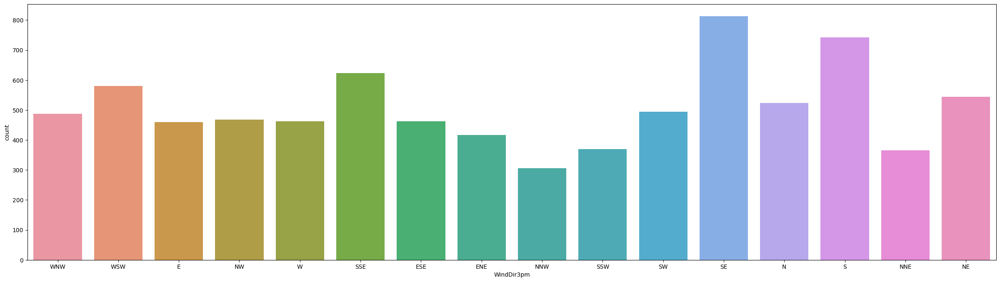

In [90]:
#WindDir3pm
plt.figure(figsize=(30,8))
ax=sns.countplot(x='WindDir3pm',data=df)
print(df['WindDir3pm'].value_counts())

No     6195
Yes    1990
Name: RainToday, dtype: int64


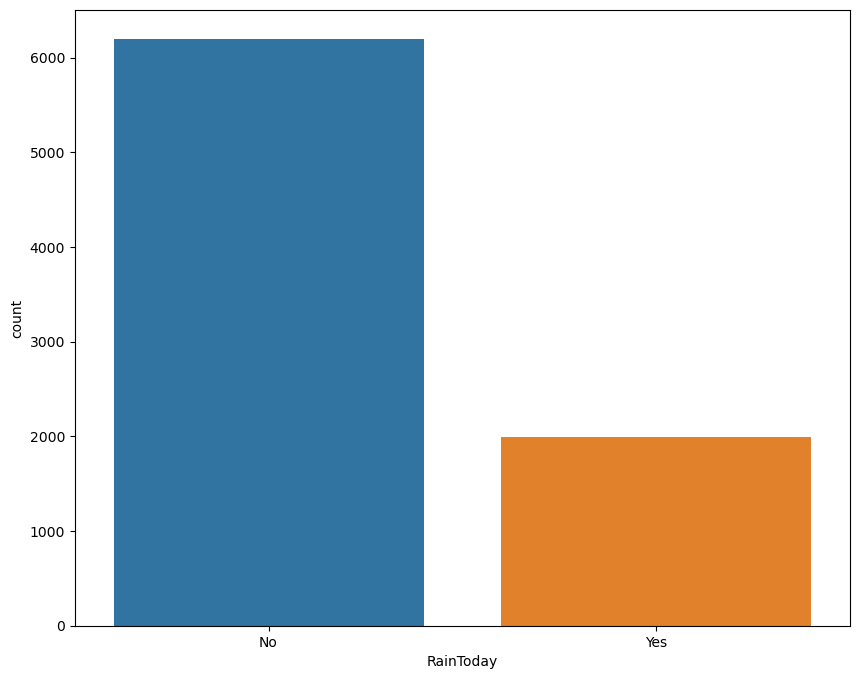

In [91]:
#RainToday
plt.figure(figsize=(10,8))
ax=sns.countplot(x='RainToday',data=df)
print(df['RainToday'].value_counts())

No     6195
Yes    1991
Name: RainTomorrow, dtype: int64


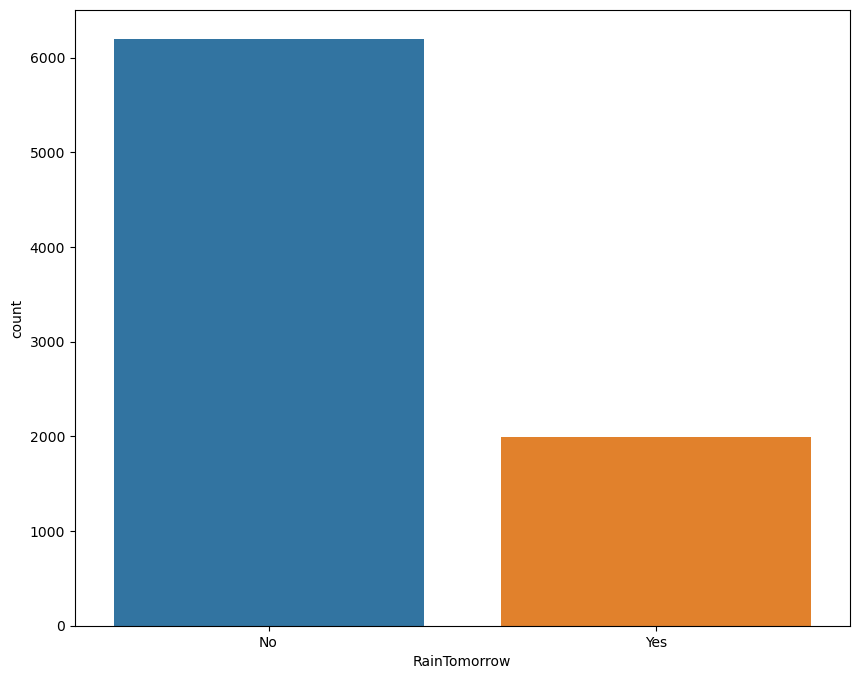

In [92]:
#RainTomorrow
plt.figure(figsize=(10,8))
ax=sns.countplot(x='RainTomorrow',data=df)
print(df['RainTomorrow'].value_counts())

# Observations Univariate Analysis on Categorical Data 
From the above count plots 
- raintoday and raintoday have imbalanced datasets.we will have to employ techniques like over sampling and undersampling to ensure a well balanced datasets.

- The direction of the wind by 3pm was more in the south east region and lowest in the NN west region
- The direction of wind by 9pm was more in the north region and lowest in the ESE region
- melbourne has the highest number of records and uluru has the lowest

# Step 3.2 Updating Null values

In [93]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

We shall update:
- All continous data with the mean
- All Categorical data with the mode

Lets go!

Date
Location
WindGustDir
WindDir9am
WindDir3pm
RainToday
RainTomorrow

In [94]:

df['MinTemp']=df['MinTemp'].fillna(df['MinTemp'].mean())
df['MaxTemp']=df['MaxTemp'].fillna(df['MaxTemp'].mean())
df['Rainfall']=df['Rainfall'].fillna(df['Rainfall'].mean())
df['Evaporation']=df['Evaporation'].fillna(df['Evaporation'].mean())
df['Sunshine']=df['Sunshine'].fillna(df['Sunshine'].mean())
df['WindGustDir']=df['WindGustDir'].fillna(df['WindGustDir'].mode()[0])
df['WindGustSpeed']=df['WindGustSpeed'].fillna(df['WindGustSpeed'].mean())
df['WindDir9am']=df['WindDir9am'].fillna(df['WindDir9am'].mode()[0])
df['WindDir3pm']=df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0])
df['WindSpeed9am']=df['WindSpeed9am'].fillna(df['WindSpeed9am'].mean())
df['WindSpeed3pm']=df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].mean())
df['Humidity9am']=df['Humidity9am'].fillna(df['Humidity9am'].mean())
df['Humidity3pm']=df['Humidity3pm'].fillna(df['Humidity3pm'].mean())
df['Pressure3pm']=df['Pressure3pm'].fillna(df['Pressure3pm'].mean())
df['Pressure9am']=df['Pressure9am'].fillna(df['Pressure9am'].mean())
df['Cloud9am']=df['Cloud9am'].fillna(df['Cloud9am'].mean())
df['Cloud3pm']=df['Cloud3pm'].fillna(df['Cloud3pm'].mean())
df['Temp9am']=df['Temp9am'].fillna(df['Temp9am'].mean())
df['Temp3pm']=df['Temp3pm'].fillna(df['Temp3pm'].mean())
df['RainToday']=df['RainToday'].fillna(df['RainToday'].mode()[0])
df['RainTomorrow']=df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0])
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,No


In [95]:
#rechecing for null values
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

 # Observations on Null Update 
From the above we can see that all null values have been updated! 

# Step 3.3 Encoding
- We cannot perform Exploratory Data Analysis on Non-numerical Data, so we have to first of all convert them to numerical data
- Here we shall adopt Ordinal Encoder to transform the all Non-numerical column into Numerical Data!

In [96]:
#initializing....
enc=OrdinalEncoder()

In [97]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,No


In [98]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [99]:
#Tranforming into numerical data
for i in df.columns:
    if df[i].dtypes=='object':
        df[i]=enc.fit_transform(df[i].values.reshape(-1,1))

In [100]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.0,1.0,13.4,22.900000,0.6,5.389395,7.632205,13.0,44.000000,13.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
1,1.0,1.0,7.4,25.100000,0.0,5.389395,7.632205,14.0,44.000000,6.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2,2.0,1.0,12.9,25.700000,0.0,5.389395,7.632205,15.0,46.000000,13.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
3,3.0,1.0,9.2,28.000000,0.0,5.389395,7.632205,4.0,24.000000,9.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
4,4.0,1.0,17.5,32.300000,1.0,5.389395,7.632205,13.0,41.000000,1.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2999.0,9.0,2.8,23.400000,0.0,5.389395,7.632205,0.0,31.000000,9.0,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0
8421,3000.0,9.0,3.6,25.300000,0.0,5.389395,7.632205,6.0,22.000000,9.0,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0
8422,3001.0,9.0,5.4,26.900000,0.0,5.389395,7.632205,3.0,37.000000,9.0,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0
8423,3002.0,9.0,7.8,27.000000,0.0,5.389395,7.632205,9.0,28.000000,10.0,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0


In [101]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.0,1.0,13.4,22.9,0.6,5.389395,7.632205,13.0,44.0,13.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
1,1.0,1.0,7.4,25.1,0.0,5.389395,7.632205,14.0,44.0,6.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2,2.0,1.0,12.9,25.7,0.0,5.389395,7.632205,15.0,46.0,13.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
3,3.0,1.0,9.2,28.0,0.0,5.389395,7.632205,4.0,24.0,9.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
4,4.0,1.0,17.5,32.3,1.0,5.389395,7.632205,13.0,41.0,1.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0


In [102]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2999.0,9.0,2.8,23.400000,0.0,5.389395,7.632205,0.0,31.000000,9.0,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0
8421,3000.0,9.0,3.6,25.300000,0.0,5.389395,7.632205,6.0,22.000000,9.0,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0
8422,3001.0,9.0,5.4,26.900000,0.0,5.389395,7.632205,3.0,37.000000,9.0,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0
8423,3002.0,9.0,7.8,27.000000,0.0,5.389395,7.632205,9.0,28.000000,10.0,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0
8424,3003.0,9.0,14.9,23.859976,0.0,5.389395,7.632205,3.0,40.174469,2.0,...,62.0,36.0,1020.2,1017.9,8.000000,8.000000,15.0,20.9,0.0,0.0


In [103]:
df.sample(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
5054,842.0,5.0,16.4,23.1,0.0,2.600000,6.900000,3.0,52.000000,6.0,...,75.0,40.00000,1003.900000,1002.500000,7.000000,7.000000,17.2,22.400000,0.0,0.0
4074,2789.0,10.0,15.7,34.2,0.0,10.200000,7.632205,12.0,69.000000,3.0,...,56.0,37.00000,1010.300000,1004.600000,4.566622,7.000000,23.9,31.300000,0.0,1.0
3003,2570.0,10.0,16.0,23.2,110.8,5.389395,4.700000,12.0,26.000000,15.0,...,87.0,65.00000,1021.300000,1018.100000,7.000000,4.000000,19.0,22.600000,1.0,0.0
8162,1187.0,4.0,23.6,33.8,0.0,6.200000,11.200000,4.0,65.000000,1.0,...,65.0,58.00000,1013.900000,1009.600000,3.000000,3.000000,28.8,31.600000,0.0,1.0
3174,2741.0,10.0,12.4,28.2,0.0,5.389395,7.632205,3.0,40.174469,14.0,...,35.0,24.00000,1019.900000,1017.000000,4.566622,4.503183,19.3,27.000000,0.0,0.0
2313,2357.0,6.0,7.9,19.8,0.0,5.389395,7.632205,3.0,40.174469,7.0,...,65.0,51.24979,1017.640233,1015.236075,0.000000,4.503183,12.0,22.442934,0.0,0.0
5974,951.0,5.0,7.0,12.6,0.2,1.400000,0.200000,3.0,30.000000,7.0,...,84.0,80.00000,1009.400000,1005.900000,7.000000,7.000000,8.9,11.900000,0.0,1.0
5391,368.0,5.0,12.1,22.4,0.0,8.400000,10.700000,8.0,33.000000,15.0,...,52.0,32.00000,1020.400000,1018.300000,5.000000,6.000000,15.4,19.000000,0.0,0.0
4887,675.0,5.0,7.7,17.5,17.4,7.600000,10.600000,15.0,52.000000,15.0,...,59.0,33.00000,1022.800000,1023.000000,3.000000,4.000000,10.9,15.400000,1.0,0.0
968,160.0,3.0,11.2,22.5,0.0,3.200000,9.100000,11.0,52.000000,12.0,...,55.0,69.00000,1020.500000,1019.800000,2.000000,6.000000,18.9,19.400000,0.0,1.0


In [104]:
df.describe()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,...,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,1296.570564,5.793591,13.193305,23.859976,2.805913,5.389395,7.632205,7.217804,40.174469,7.267418,...,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934,0.236202,0.236320
std,854.249434,3.162654,5.379488,6.114516,10.309308,3.852004,2.825451,4.702616,13.776101,4.588045,...,16.774231,18.311894,6.275759,6.217451,2.429205,2.299419,5.608301,5.945849,0.424773,0.424846
min,0.000000,0.000000,-2.000000,8.200000,0.000000,0.000000,0.000000,0.000000,7.000000,0.000000,...,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,0.000000,0.000000
25%,589.000000,3.000000,9.300000,19.300000,0.000000,4.000000,7.632205,3.000000,31.000000,3.000000,...,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000,0.000000,0.000000
50%,1088.000000,6.000000,13.200000,23.300000,0.000000,5.389395,7.632205,7.000000,40.174469,7.000000,...,68.000000,51.000000,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.000000,0.000000,0.000000
75%,2021.000000,8.000000,17.300000,28.000000,1.400000,5.389395,8.900000,12.000000,48.000000,12.000000,...,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000,0.000000,0.000000
max,3003.000000,11.000000,28.500000,45.500000,371.000000,145.000000,13.900000,15.000000,107.000000,15.000000,...,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,1.000000,1.000000


In [105]:
df.dtypes

Date             float64
Location         float64
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir      float64
WindGustSpeed    float64
WindDir9am       float64
WindDir3pm       float64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday        float64
RainTomorrow     float64
dtype: object

# Observations on Encoding
Frome the above its crystal clear that all Non-numrical data have been converted(encoded) to Numerical Data!

# Step 3.4 - Normal Distribution Check(Univariate Analysis)

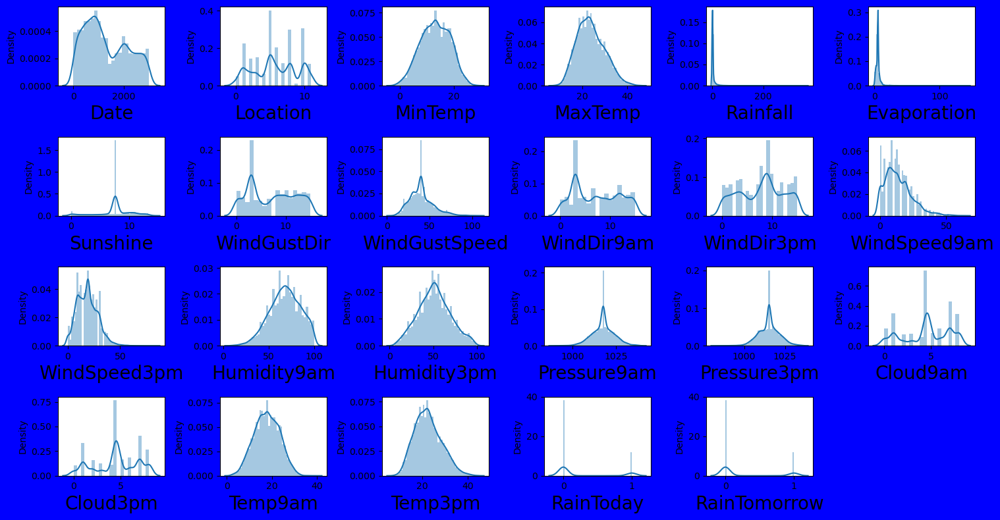

In [106]:
#Check for normal distribution and see how data is distributed for every column
plt.figure(figsize=(15,8), facecolor='blue')#dimension and color
plotnumber = 1 #like a form of counter which we will see its relevance in the ‘for loop’

for column in df:#triggering your for loop
    if plotnumber<=23:
        ax = plt.subplot(4,6,plotnumber)#2,3 means arrange the graphs in 3-rows and 4-columns spaces as seen below while plotnumber means plot graphs
        sns.distplot(df[column])#performing a distribution plot for all the columns
        plt.xlabel(column,fontsize=20)#labelling the x-axis with their respctive column names with a font size of 20
    plotnumber+=1#incrementals for plot number so as to allow ploting one by one until it gets to 12
plt.tight_layout()#This is just to show you data in a compact form. 

# Observations on Normal Distribution Check
From the above density plot:

- We can see that All the features does not obey a normal distribution, the building blocks is not in tandem with a normalized     curve

- The normal distribution of these features below; 
Date
Location
WindGustDir
WindDir9am
WindDir3pm
RainToday
RainTomorrow 

It has no contribution to our Model Building since they are categorical data

- The normal distribution of the RainTomorrow,rainfall columns also has no contribution to our Model Building since its the Target     variable

In [354]:
#extracting only the features(wihtout the Label) from the original dataset and store in features
features=df.drop(columns=['Rainfall'],axis=1)
features

,Date,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.0,1.0,13.4,22.900000,5.389395,7.632205,13.0,44.000000,13.0,14.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
1,1.0,1.0,7.4,25.100000,5.389395,7.632205,14.0,44.000000,6.0,15.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2,2.0,1.0,12.9,25.700000,5.389395,7.632205,15.0,46.000000,13.0,15.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
3,3.0,1.0,9.2,28.000000,5.389395,7.632205,4.0,24.000000,9.0,0.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
4,4.0,1.0,17.5,32.300000,5.389395,7.632205,13.0,41.000000,1.0,7.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2999.0,9.0,2.8,23.400000,5.389395,7.632205,0.0,31.000000,9.0,1.0,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0
8421,3000.0,9.0,3.6,25.300000,5.389395,7.632205,6.0,22.000000,9.0,3.0,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0
8422,3001.0,9.0,5.4,26.900000,5.389395,7.632205,3.0,37.000000,9.0,14.0,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0
8423,3002.0,9.0,7.8,27.000000,5.389395,7.632205,9.0,28.000000,10.0,3.0,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0


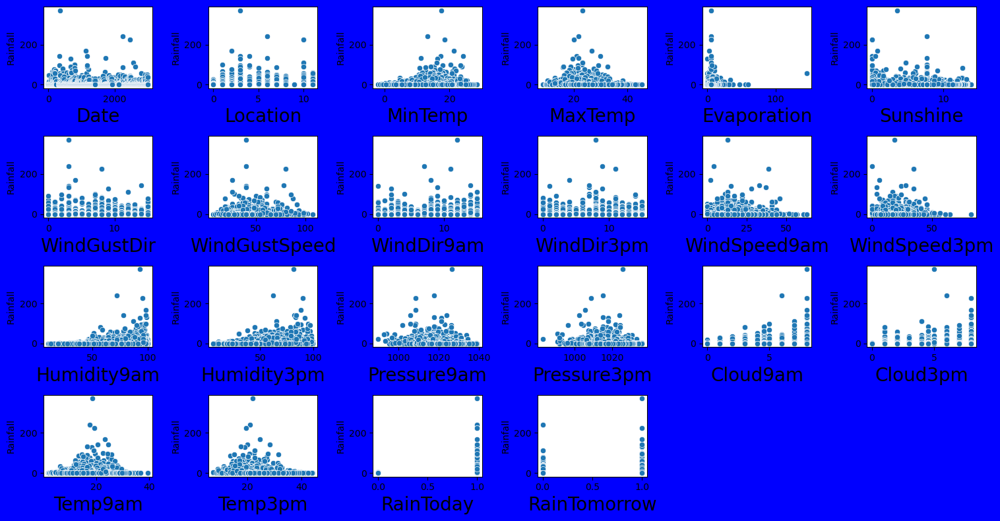

In [108]:
#Check for the relatinship between each features and Target
plt.figure(figsize=(15,8), facecolor='blue')#dimension and line color
plotnumber = 1 #like a form of counter which we will see its relevance in the ‘for loop’

for column in features:#triggering your for loop
    if plotnumber<=22:#since there are 3 features
        ax = plt.subplot(4,6,plotnumber)#3,4 means arrange the graphs in 3-rows and 3-columns spaces as seen below while plotnumber means plot graphs
        sns.scatterplot(x=features[column],y=df['Rainfall'])#performing a relationship plot between features and label
        plt.xlabel(column,fontsize=20)#labelling the x-axis with their respctive column names with a font size of 20
    plotnumber+=1#incrementals for plot number so as to allow ploting one by one until it gets to 12
plt.tight_layout()#This is just to show you data in a compact form. 

# Observations on Scatter Plot

From the above scatter plot we can see a strong relationship between some of the features and the Label(rainfall).

# Step 3.5 - Count Plot Check(Bivariate Analysis)
- Lets visualize the relationship between the Categorical features and the Label

# Step 3.6 - Correlation Check(Collinearity and Multicollinearity)- Multivariate Analysis;
 - Collinearity Between Feature and Label
 - Multicolinearity between features

Lets see/visualize the correlation between (Features vs Label) and (Features vs Features)

In [109]:
#checking for general correlation
df.corr()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,1.000000,0.475037,0.016931,0.102409,0.004945,0.153853,0.065101,-0.084552,-0.037361,-0.012369,...,0.086328,-0.038345,0.030809,0.013545,0.005237,-0.010572,0.070703,0.113734,-0.011365,-0.011228
Location,0.475037,1.000000,0.116531,0.064268,0.007693,0.143519,0.057817,-0.035408,0.231396,-0.027103,...,0.005662,0.055790,-0.032261,-0.020574,0.038019,0.017561,0.118051,0.060570,0.003071,0.002824
MinTemp,0.016931,0.116531,1.000000,0.717522,0.087684,0.254965,0.056184,-0.145316,0.230058,-0.041650,...,-0.130731,0.079048,-0.429432,-0.422991,0.091604,0.038414,0.887119,0.685520,0.064789,0.092942
MaxTemp,0.102409,0.064268,0.717522,1.000000,-0.087451,0.322405,0.378403,-0.224670,0.139998,-0.214119,...,-0.390976,-0.421879,-0.325721,-0.403258,-0.253968,-0.250132,0.866039,0.974506,-0.224883,-0.152886
Rainfall,0.004945,0.007693,0.087684,-0.087451,1.000000,0.023517,-0.169432,0.038812,0.086000,0.093821,...,0.228800,0.235444,-0.072668,-0.033649,0.185444,0.150760,-0.007083,-0.090687,0.461106,0.220021
Evaporation,0.153853,0.143519,0.254965,0.322405,0.023517,1.000000,0.226001,-0.078765,0.136371,-0.061677,...,-0.213108,-0.161661,-0.177786,-0.189558,-0.062283,-0.108022,0.305264,0.315109,-0.088654,-0.059012
Sunshine,0.065101,0.057817,0.056184,0.378403,-0.169432,0.226001,1.000000,-0.105918,-0.013778,-0.076560,...,-0.360831,-0.440268,0.021887,-0.035863,-0.533391,-0.547304,0.250640,0.395324,-0.234230,-0.327731
WindGustDir,-0.084552,-0.035408,-0.145316,-0.224670,0.038812,-0.078765,-0.105918,1.000000,0.016591,0.403562,...,0.036467,0.053567,-0.109704,-0.024997,0.123883,0.092979,-0.176318,-0.238856,0.125188,0.051832
WindGustSpeed,-0.037361,0.231396,0.230058,0.139998,0.086000,0.136371,-0.013778,0.016591,1.000000,-0.072058,...,-0.269593,-0.091860,-0.407139,-0.372651,0.023313,0.078631,0.202298,0.102199,0.076822,0.190127
WindDir9am,-0.012369,-0.027103,-0.041650,-0.214119,0.093821,-0.061677,-0.076560,0.403562,-0.072058,1.000000,...,0.025604,0.124556,-0.011024,0.073446,0.099582,0.062947,-0.103111,-0.221634,0.157324,0.032860


In [110]:
#checking for correlation between each feature and Label
df.corr()['Rainfall'].sort_values()

Sunshine        -0.169432
Temp3pm         -0.090687
MaxTemp         -0.087451
Pressure9am     -0.072668
Pressure3pm     -0.033649
Temp9am         -0.007083
Date             0.004945
Location         0.007693
Evaporation      0.023517
WindSpeed3pm     0.024791
WindDir3pm       0.038560
WindGustDir      0.038812
WindSpeed9am     0.050631
WindGustSpeed    0.086000
MinTemp          0.087684
WindDir9am       0.093821
Cloud3pm         0.150760
Cloud9am         0.185444
RainTomorrow     0.220021
Humidity9am      0.228800
Humidity3pm      0.235444
RainToday        0.461106
Rainfall         1.000000
Name: Rainfall, dtype: float64

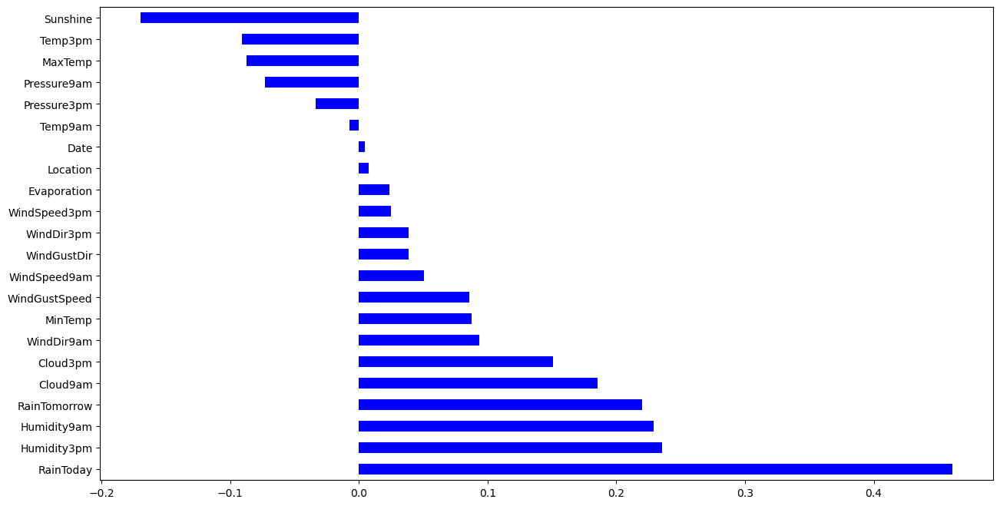

In [111]:
#Plotting a bar chart to visualize correlation through the stand-alone bars
plt.figure(figsize=(15,8))
df.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='barh', color='b')
plt.show()

# Multicollinearity Check

<AxesSubplot:>

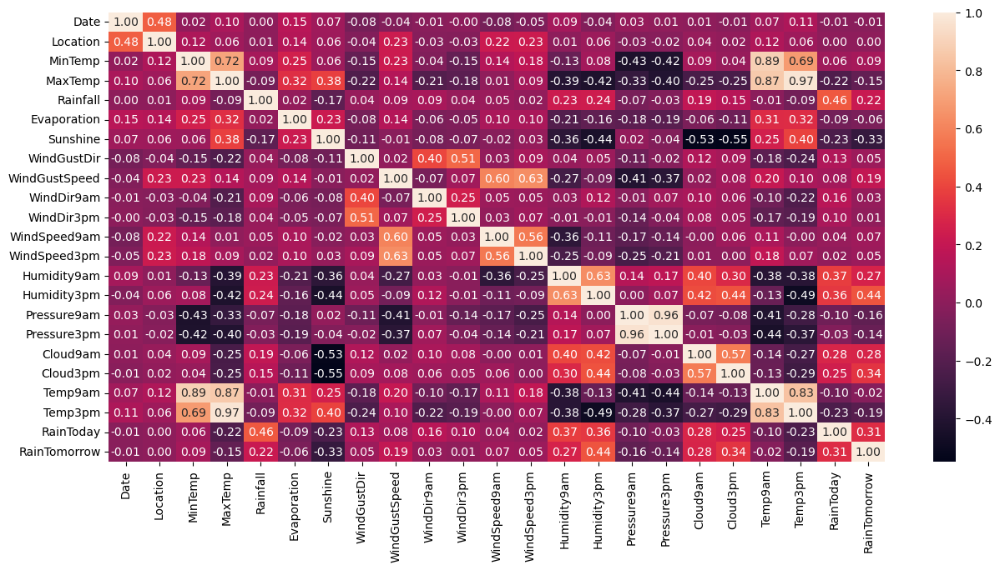

In [112]:
#Plotting a heatmap to show correlation through the brightness of the map-squares
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(),annot=True, linewidth=0,linecolor='black',fmt='.2f')

Hmmmm....we can see that most features DO NOT share a 'direct relationship' between each other! as the majority of the map-squares are not bright! But lets conlcude with our findings first:

<function matplotlib.pyplot.show(close=None, block=None)>

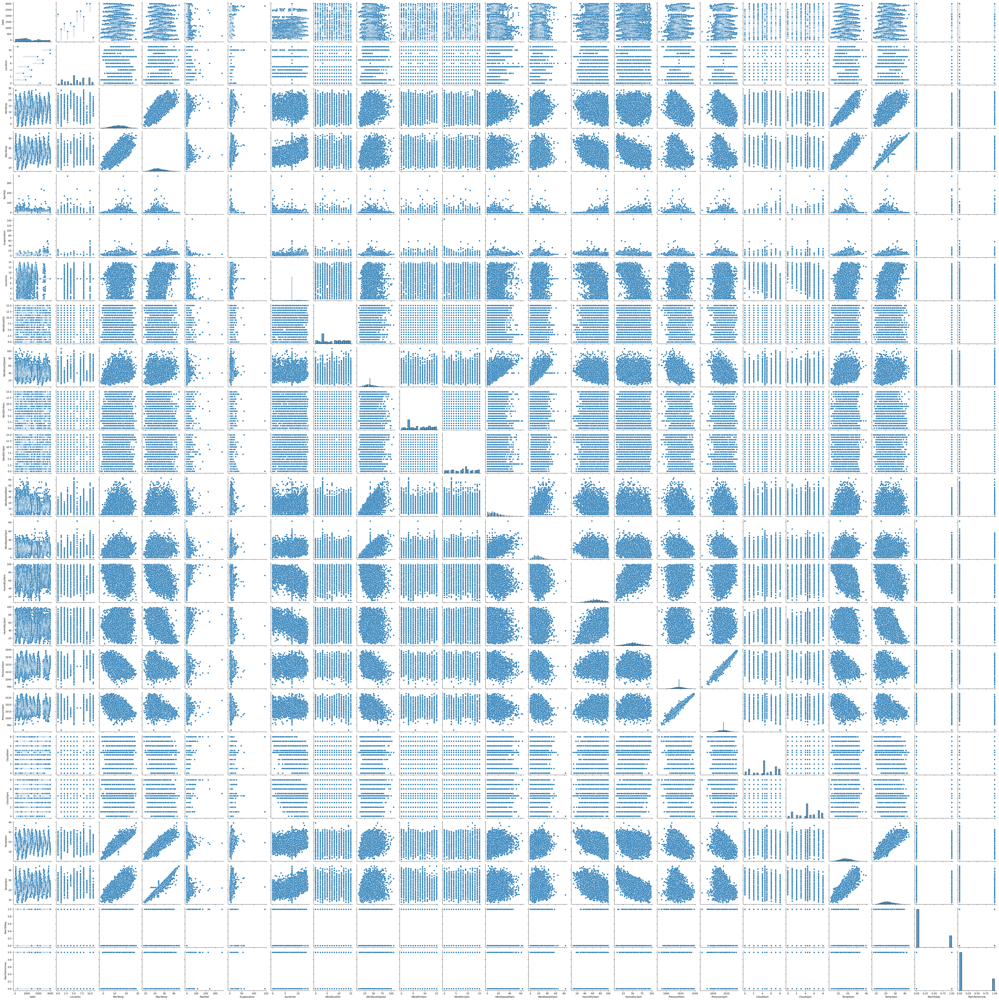

In [113]:
#lets also consumate further our quest for Multicollinearity check by ploting a pair plot
sns.pairplot(df)
plt.show

In [114]:
df.corr()['RainTomorrow'].sort_values()

Sunshine        -0.327731
Temp3pm         -0.193805
Pressure9am     -0.163985
MaxTemp         -0.152886
Pressure3pm     -0.135242
Evaporation     -0.059012
Temp9am         -0.023211
Date            -0.011228
Location         0.002824
WindDir3pm       0.008918
WindDir9am       0.032860
WindGustDir      0.051832
WindSpeed3pm     0.053568
WindSpeed9am     0.068285
MinTemp          0.092942
WindGustSpeed    0.190127
Rainfall         0.220021
Humidity9am      0.271222
Cloud9am         0.278943
RainToday        0.312929
Cloud3pm         0.344369
Humidity3pm      0.444808
RainTomorrow     1.000000
Name: RainTomorrow, dtype: float64

# Observations on Correlation(Collinearity & Multicollinearity)
From the above correlation statistics;

Collinearity:

    Sunshine        -0.327731:Has a negative correlation of 33% with the target column which can be considered as a good bond
    Temp3pm         -0.193805:Has a negative correlation of 19% with the target column which can be considered as a fair bond
    Pressure9am     -0.163985:Has a negative correlation of 19% with the target column which can be considered as a fair bond
    MaxTemp         -0.152886:Has a negative correlation of 19% with the target column which can be considered as a fair bond
    Pressure3pm     -0.135242:Has a negative correlation of 19% with the target column which can be considered as a fair bond
    Evaporation     -0.059012:Has a negative correlation of 5% with the target column which can be considered as a poor bond
    Temp9am         -0.023211:Has a negative correlation of 2% with the target column which can be considered as a poor bond
    Date            -0.011228:Has a negative correlation of 1% with the target column which can be considered as a poor bond
    Location         0.002824:Has a positive correlation of 0.2% with the target column which can be considered as a poor bond
    WindDir3pm       0.008918:Has a positive correlation of 1% with the target column which can be considered as a poor bond
    WindDir9am       0.032860:Has a positive correlation of 3% with the target column which can be considered as a poor bond
    WindGustDir      0.051832:Has a positive correlation of 5% with the target column which can be considered as a poor bond
    WindSpeed3pm     0.053568:Has a positive correlation of 5% with the target column which can be considered as a poor bond
    WindSpeed9am     0.068285:Has a positive correlation of 6% with the target column which can be considered as a poor bond
    MinTemp          0.092942:Has a positive correlation of 9% with the target column which can be considered as a poor bond
    WindGustSpeed    0.190127:Has a positive correlation of 44% with the target column which can be considered as a fair bond
    Rainfall         0.220021:Has a positive correlation of 22% with the target column which can be considered as a good bond
    Humidity9am      0.271222:Has a positive correlation of 27% with the target column which can be considered as a good bond
    Cloud9am         0.278943:Has a positive correlation of 27% with the target column which can be considered as a good bond
    RainToday        0.312929:Has a positive correlation of 31% with the target column which can be considered as a good bond
    Cloud3pm         0.344369:Has a positive correlation of 34% with the target column which can be considered as a good bond
    Humidity3pm      0.444808: Has a positive correlation of 44% with the target column which can be considered as a good bond
    RainTomorrow     1.000000
  
 - Feature with Maximum correlation = '44%'
 - Feature with Minimum correlation = '0.2%'
 
Multicollinearity:
 - From the heatmap we can see that the ALMOST ALL pairs of features DOES NOT have noticeable correllation between them 

But we will reconfrim this during further steps by finding the Variance Inflation Factor(VIF)


NB: Multicollinnearity means two variables are explaining the same thing, meaning one of them is useless and therefore we have to drop one of them!

# Step 3.4 - Outlier Check

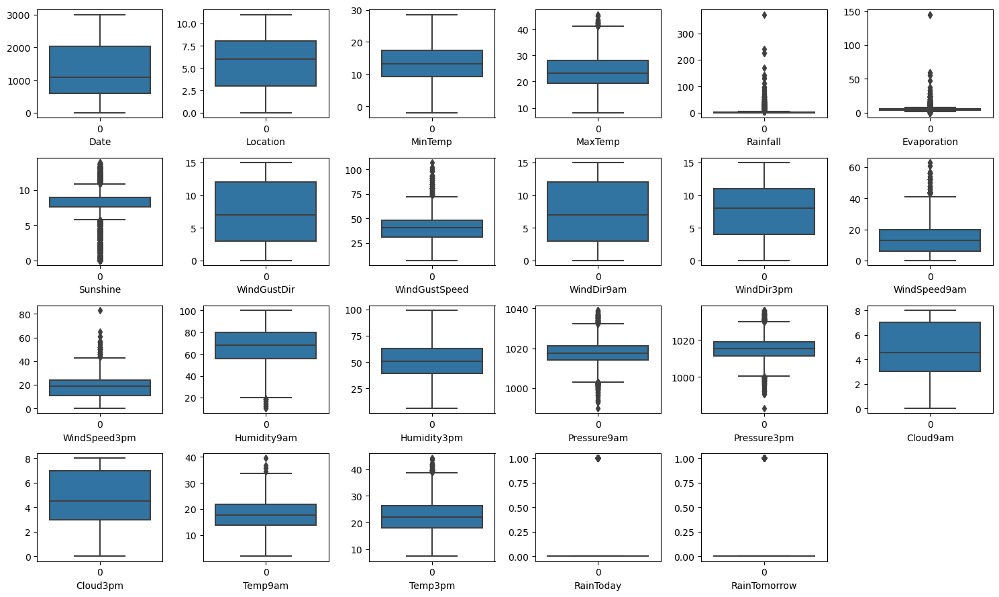

In [115]:
#Check for allien-datapoints in each features data which has been stored in the dataframe; 'features_continuos'
plt.figure(figsize=(15,9))#dimension only
graph = 1 #like a form of counter which we will see its relevance in the ‘for loop’

for column in df:#triggering your for loop
    if graph<=23:#this was made 8 just to allow for 4 spaces
        plt.subplot(4,6,graph)#3,4 means arrange the graphs in 3-rows and 4-columns spaces as seen below while plotnumber means plot graphs
        ax=sns.boxplot(data=df[column])#performing a box plot for all columns
        plt.xlabel(column,fontsize=10)#labelling the x-axis with their respctive column names with a font size of 20
    graph+=1#incrementals for plot number so as to allow ploting one by one until it gets to 12
plt.tight_layout()#This is just to show you data in a compact form.

# Observations on Outlier Check
 - From the above visualization plot its evident that some features posses outliers, however this is subject to      further analysis and reconfirmation using the zscore!
 
 -  The outlier of the categorical data does not impact our model
 
 - The outlier of the Target data does not impact our model

# Step 3.5 - Skewness Check

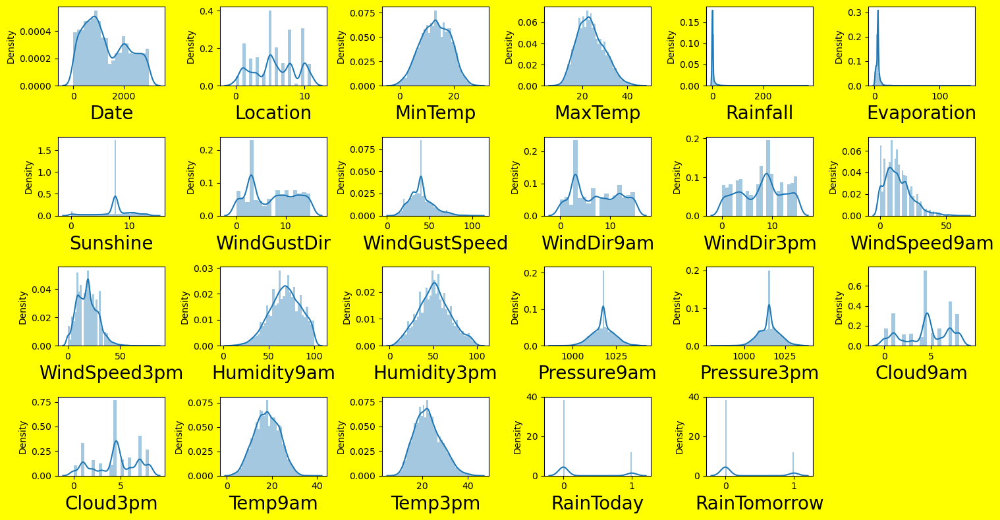

In [116]:
#Visualizing for skewness...
plt.figure(figsize=(15,8), facecolor='yellow')#dimension and line color
plotnumber = 1 #like a form of counter which we will see its relevance in the ‘for loop’

for column in df:#triggering your for loop
    if plotnumber<=23:
        ax = plt.subplot(4,6,plotnumber)
        sns.distplot(df[column])#performing a distribution plot for all the columns
        plt.xlabel(column,fontsize=20)#labelling the x-axis with their respctive column names with a font size of 20
    plotnumber+=1#incrementals for plot number so as to allow ploting one by one until it gets to 12
plt.tight_layout()#This is just to show you data in a compact form. 

In [117]:
#Checking for skewness in each independent variable data which has been stored in the dataframe; 'features'
df.skew()

Date              0.386560
Location         -0.050456
MinTemp          -0.089989
MaxTemp           0.380654
Rainfall         13.218403
Evaporation      14.023948
Sunshine         -0.716525
WindGustDir       0.119640
WindGustSpeed     0.757000
WindDir9am        0.172792
WindDir3pm       -0.119847
WindSpeed9am      0.960591
WindSpeed3pm      0.494217
Humidity9am      -0.256743
Humidity3pm       0.118281
Pressure9am      -0.024082
Pressure3pm      -0.010214
Cloud9am         -0.366503
Cloud3pm         -0.276294
Temp9am          -0.014748
Temp3pm           0.397331
RainToday         1.242362
RainTomorrow      1.241588
dtype: float64

# Observations on Skewness Check: 
Lets assume Skewness threshold is taken as +/-0.50.Meaning any value outside +/-0.50 contains skewness. Hence the below features are skewed:

- Rainfall         13.218403
- Evaporation      14.023948
- WindSpeed9am      0.960591
- WindGustSpeed     0.757000

# Step 4 - DATA PREPROCESSING

# Step 4.1 - Removal of Duplicates and Unwanted Column

In [120]:
#Recheking shape of original data
df.shape

(6762, 23)

In [121]:
#Remove duplicates
df.drop_duplicates(inplace=True)
df.shape

(6762, 23)

The duplicates has been dropped!

# Step 4.2 - Dropping of Features that strongly promotes multicollinearity(VIF)

<AxesSubplot:>

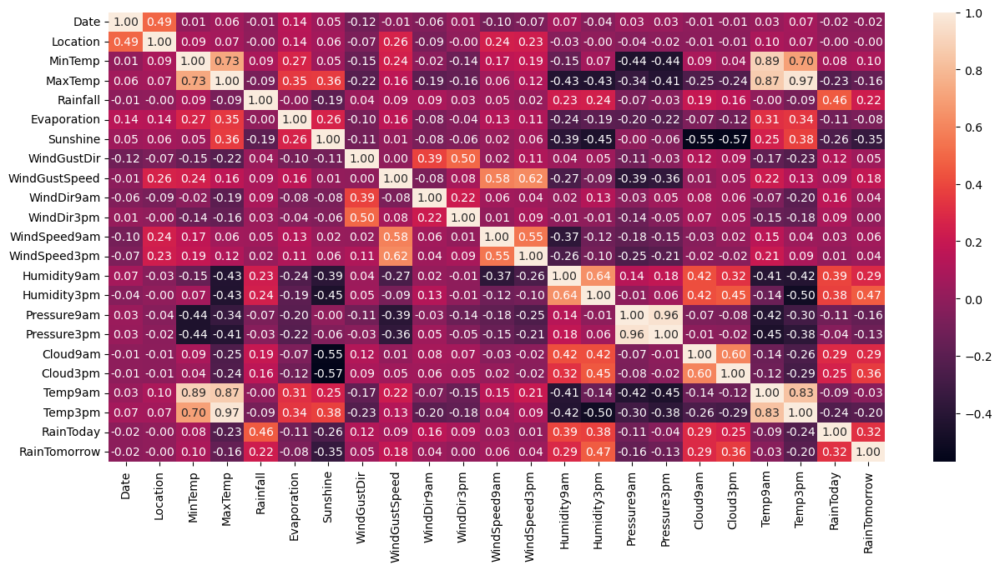

In [122]:
#Lets have a view of the heatmap again with particular focus on map-squares that are more brightened
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(),annot=True, linewidth=0,linecolor='black',fmt='.2f')

From the heatmap above we can see that there are visible correlations between one another

However, lets reconfirm by calculating the Variance Inflation Factor(VIF)!

# Variance Inflation Factor(VIF)

To solve this multicollinearity problem, we have to first scale our data using Standard Scaler

In [123]:
X=df.drop(columns=['Rainfall'])
Y=df['Rainfall']

In [124]:
scalar=StandardScaler()
X_Scaled = scalar.fit_transform(X)
X_Scaled

array([[-1.60941055, -1.39509696,  0.05234111, ..., -0.15154472,
        -0.55035459, -0.55035459],
       [-1.60815308, -1.39509696, -1.0306399 , ...,  0.26711174,
        -0.55035459, -0.55035459],
       [-1.6068956 , -1.39509696, -0.03790731, ...,  0.0829029 ,
        -0.55035459, -0.55035459],
       ...,
       [ 2.16428123,  1.18619268, -1.39163357, ...,  0.56854439,
        -0.55035459, -0.55035459],
       [ 2.1655387 ,  1.18619268, -0.95844117, ...,  0.55179814,
        -0.55035459, -0.55035459],
       [ 2.16679618,  1.18619268,  0.32308636, ..., -0.30226105,
        -0.55035459, -0.55035459]])

In [125]:
#checking the shape
X_Scaled.shape

(6762, 22)

Now we shall treat the above shape as an array of numbers(tuple) where 8523 and 11 are the zeroth and first index respectively.

In [126]:
#initializing...creating an empty dataframe stored in vif
vif=pd.DataFrame()

In [127]:
vif['vif']=[variance_inflation_factor(X_Scaled, i) for i in range(X_Scaled.shape[1])]#This is a list comprehension. in the for loop, the range(X_Scaled.shape[1]) which also means range(3) or (0,1,2), since X_Scaled.shape[1] means the first index in the X_Scaled.shape which is 3. Now all the columns in X_Scaled which is (0,1,2) will now be compared with the entire X_Scaled one by one using the other part of the syntax which is variance_inflation_factor(X_Scaled, i). To shed more light, what happens here is that during th comparison using variance_inflation_factor(X_Scaled, i), the i is seen as a ‘Label’ while the X_Scaled is seen as a Feature. The output of this list comprehension is then stored in a column named 'vif' inside the empty ‘vif dataframe’ created above

In [128]:
vif['Features'] = X.columns#creating another column named 'Features' inside the empty vif Dataframe created earlier and populating it with a data called X.columns(i.e column names from the X DataFrame which was created by dropping the Label – ‘sales’ )
vif

,vif,Features
0,1.500815,Date
1,1.594683,Location
2,8.711336,MinTemp
3,26.671905,MaxTemp
4,1.251231,Evaporation
5,1.915510,Sunshine
6,1.612314,WindGustDir
7,2.356709,WindGustSpeed
8,1.325192,WindDir9am
9,1.475454,WindDir3pm


From the above vif dataframe,we are setting a vif threshold of 6, meaning any feature with Variance Inflation Factor greater than 5 is assumed to have a multicollinearity problem. it is not standard. The dataset demands.

In lieu of the above assumption, MULTICOLLINEARITY DOES EXIST!

# Step 4.3 - Removal of Outliers

This will be achieved using the zscore

In [129]:
#Get the absolute value of the zscore of the remaining dataset
np.abs(zscore(df))

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1.609411,1.395097,0.052341,0.195170,0.208040,0.014779,0.049294,1.246744,0.362850,1.315650,...,0.203179,1.539598,1.647292,1.347736,1.453517,0.056332,0.173722,0.151545,0.550355,0.550355
1,1.608153,1.395097,1.030640,0.163738,0.265281,0.014779,0.049294,1.455523,0.362850,0.222688,...,1.368283,1.377411,1.166162,1.230431,0.067188,0.056332,0.121292,0.267112,0.550355,0.550355
2,1.606896,1.395097,0.037907,0.261622,0.265281,0.014779,0.049294,1.664301,0.512305,1.315650,...,1.717496,1.107100,1.663883,1.079611,0.067188,1.020514,0.542811,0.082903,0.550355,0.550355
3,1.605638,1.395097,0.705746,0.636844,0.265281,0.014779,0.049294,0.632264,1.131708,0.436600,...,1.310080,1.863971,0.004812,0.392542,0.067188,0.056332,0.035995,0.635529,0.550355,0.550355
4,1.604381,1.395097,0.792378,1.338345,0.169879,0.014779,0.049294,1.246744,0.138666,1.321500,...,0.843405,0.944913,1.132980,1.532071,1.049737,1.560632,0.016434,1.171410,0.550355,0.550355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.161766,1.186193,1.860925,0.113600,0.265281,0.014779,0.049294,1.467379,0.608613,0.436600,...,0.960867,1.431473,1.156538,0.864293,0.067188,0.056332,1.362117,0.051067,0.550355,0.550355
8421,2.163024,1.186193,1.716528,0.196366,0.265281,0.014779,0.049294,0.214707,1.281164,0.436600,...,0.669855,1.593660,0.974040,0.663199,0.067188,0.056332,1.222306,0.300604,0.550355,0.550355
8422,2.164281,1.186193,1.391634,0.457390,0.265281,0.014779,0.049294,0.841043,0.160246,0.436600,...,0.844462,1.431473,0.559272,0.277770,0.067188,0.056332,0.942683,0.568544,0.550355,0.550355
8423,2.165539,1.186193,0.958441,0.473704,0.265281,0.014779,0.049294,0.411629,0.832796,0.656363,...,0.960867,1.431473,0.293821,0.227497,0.565382,1.020514,0.488297,0.551798,0.550355,0.550355


In [130]:
#checking the data shape
z=np.abs(zscore(df))
z.shape

(6762, 23)

Now we are setting threshold of outlier zscore>3, meaning any zscore above 3 is assumed to be an Outlier. Again, its not standard. The dataset demands.

In [131]:
#index number
np.where(z>3)

(array([   8,   12,   12,   44,   44,   52,   52,   60,   60,   61,   61,
          62,   62,   62,   67,   68,   68,  123,  267,  271,  296,  381,
         381,  405,  406,  407,  431,  462,  466,  466,  563,  567,  568,
         568,  569,  602,  602,  603,  683,  683,  699,  713,  748,  748,
         770,  795,  796,  797,  802,  928,  928,  935,  949,  979,  980,
         980,  980, 1008, 1009, 1011, 1138, 1148, 1149, 1151, 1189, 1203,
        1237, 1241, 1264, 1265, 1357, 1411, 1412, 1413, 1479, 1480, 1481,
        1513, 1535, 1587, 1644, 1661, 1665, 1673, 1680, 1774, 1819, 1873,
        1898, 1903, 1945, 2016, 2028, 2043, 2074, 2108, 2116, 2186, 2201,
        2219, 2219, 2230, 2231, 2265, 2429, 2488, 2500, 2505, 2527, 2527,
        2541, 2593, 2676, 2677, 2735, 2827, 2835, 2849, 2849, 2855, 2859,
        2863, 2869, 2877, 2883, 2890, 2891, 2897, 2898, 2900, 2900, 2901,
        2905, 2909, 2911, 2919, 2925, 2933, 2939, 2947, 2953, 2961, 2967,
        2975, 2989, 3003, 3027, 3045, 

In [132]:
#Extracting out the non-outliers(i.e zscore<3) and storing output in new object
df_new=df[(z<3).all(axis=1)]
print("Old DataFrame",df.shape)#Data still with outliers
print("New DataFrame",df_new.shape)#Data without outliers
print("total_dropped_rows",df.shape[0]-df_new.shape[0])#Take note of this arithmetic in df.shape

Old DataFrame (6762, 23)
New DataFrame (6409, 23)
total_dropped_rows 353


A Total of 353 outliers have been removed! Lets move on! Data is looking great!

In [133]:
#Checking the new dataframe with non-outliers
df_new

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.0,1.0,13.4,22.900000,0.6,5.389395,7.632205,13.0,44.000000,13.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
1,1.0,1.0,7.4,25.100000,0.0,5.389395,7.632205,14.0,44.000000,6.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2,2.0,1.0,12.9,25.700000,0.0,5.389395,7.632205,15.0,46.000000,13.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
3,3.0,1.0,9.2,28.000000,0.0,5.389395,7.632205,4.0,24.000000,9.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
4,4.0,1.0,17.5,32.300000,1.0,5.389395,7.632205,13.0,41.000000,1.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2999.0,9.0,2.8,23.400000,0.0,5.389395,7.632205,0.0,31.000000,9.0,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0
8421,3000.0,9.0,3.6,25.300000,0.0,5.389395,7.632205,6.0,22.000000,9.0,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0
8422,3001.0,9.0,5.4,26.900000,0.0,5.389395,7.632205,3.0,37.000000,9.0,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0
8423,3002.0,9.0,7.8,27.000000,0.0,5.389395,7.632205,9.0,28.000000,10.0,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0


Now we need to reset our data having removed outliers.....

In [134]:
#Lets reset our data having removed outliers
df_new.reset_index(inplace=True)
df_new

,index,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0,0.0,1.0,13.4,22.900000,0.6,5.389395,7.632205,13.0,44.000000,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
1,1,1.0,1.0,7.4,25.100000,0.0,5.389395,7.632205,14.0,44.000000,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2,2,2.0,1.0,12.9,25.700000,0.0,5.389395,7.632205,15.0,46.000000,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
3,3,3.0,1.0,9.2,28.000000,0.0,5.389395,7.632205,4.0,24.000000,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
4,4,4.0,1.0,17.5,32.300000,1.0,5.389395,7.632205,13.0,41.000000,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6404,8420,2999.0,9.0,2.8,23.400000,0.0,5.389395,7.632205,0.0,31.000000,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0
6405,8421,3000.0,9.0,3.6,25.300000,0.0,5.389395,7.632205,6.0,22.000000,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0
6406,8422,3001.0,9.0,5.4,26.900000,0.0,5.389395,7.632205,3.0,37.000000,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0
6407,8423,3002.0,9.0,7.8,27.000000,0.0,5.389395,7.632205,9.0,28.000000,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0


In [135]:
#dropping the index columns which is not needed
df_new.drop('index', axis=1,inplace=True)
df_new

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.0,1.0,13.4,22.900000,0.6,5.389395,7.632205,13.0,44.000000,13.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
1,1.0,1.0,7.4,25.100000,0.0,5.389395,7.632205,14.0,44.000000,6.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2,2.0,1.0,12.9,25.700000,0.0,5.389395,7.632205,15.0,46.000000,13.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
3,3.0,1.0,9.2,28.000000,0.0,5.389395,7.632205,4.0,24.000000,9.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
4,4.0,1.0,17.5,32.300000,1.0,5.389395,7.632205,13.0,41.000000,1.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6404,2999.0,9.0,2.8,23.400000,0.0,5.389395,7.632205,0.0,31.000000,9.0,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0
6405,3000.0,9.0,3.6,25.300000,0.0,5.389395,7.632205,6.0,22.000000,9.0,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0
6406,3001.0,9.0,5.4,26.900000,0.0,5.389395,7.632205,3.0,37.000000,9.0,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0
6407,3002.0,9.0,7.8,27.000000,0.0,5.389395,7.632205,9.0,28.000000,10.0,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0


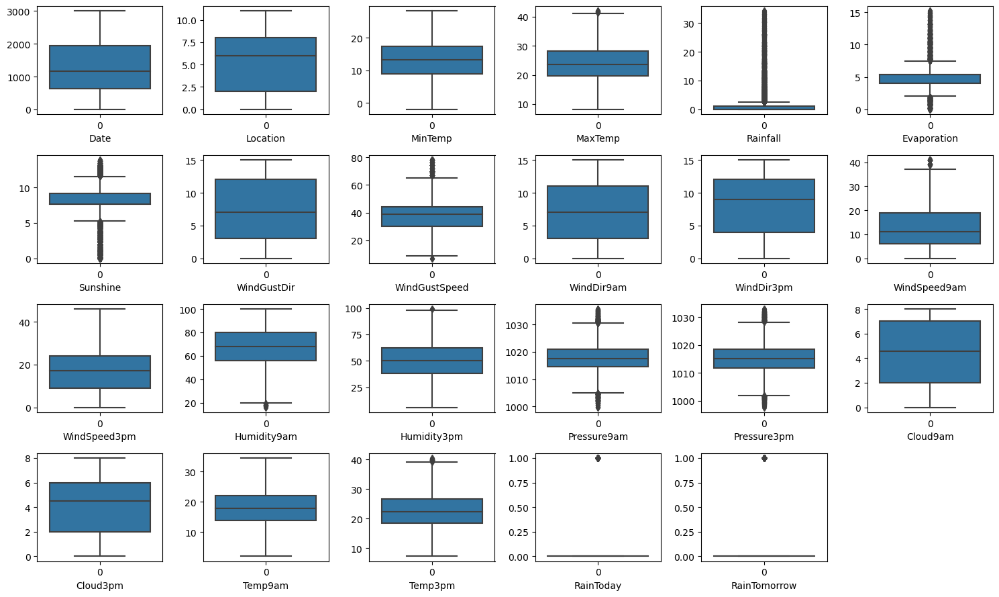

In [137]:
#rechecking for allien-datapoints in each features data which are now stored in df_new
plt.figure(figsize=(15,9))#dimension only
graph = 1 #like a form of counter which we will see its relevance in the ‘for loop’

for column in df_new:#triggering your for loop
    if graph<=23:
        plt.subplot(4,6,graph)#3,4 means arrange the graphs in 3-rows and 3-columns spaces as seen below while plotnumber means plot graphs
        ax=sns.boxplot(data=df_new[column])#performing box plots
        plt.xlabel(column,fontsize=10)#labelling the x-axis with their respctive column names with a font size of 20
    graph+=1#incrementals for plot number so as to allow ploting one by one until it gets to 12
plt.tight_layout()#This is just to show you data in a compact form.

From the above we can see that there are outliers in the continous data!

# Step 4.4 - Transforming Data to Remove Skewness using Power transformation

In [138]:
#rechecking for skewness...
df_new.skew()

Date             0.321759
Location         0.004558
MinTemp         -0.079583
MaxTemp          0.266849
Rainfall         3.514866
Evaporation      0.666495
Sunshine        -0.747742
WindGustDir      0.178714
WindGustSpeed    0.434313
WindDir9am       0.210848
WindDir3pm      -0.128886
WindSpeed9am     0.673887
WindSpeed3pm     0.336515
Humidity9am     -0.233515
Humidity3pm      0.156591
Pressure9am      0.062576
Pressure3pm      0.077866
Cloud9am        -0.279140
Cloud3pm        -0.212402
Temp9am         -0.071954
Temp3pm          0.292131
RainToday        1.331440
RainTomorrow     1.330358
dtype: float64

- Since we don't apply skewness removal on target data, we need to create a sub data frame that does not include the rainfall         column

- For the skewness data, only the sunshine and evaporation column has skewness in its data

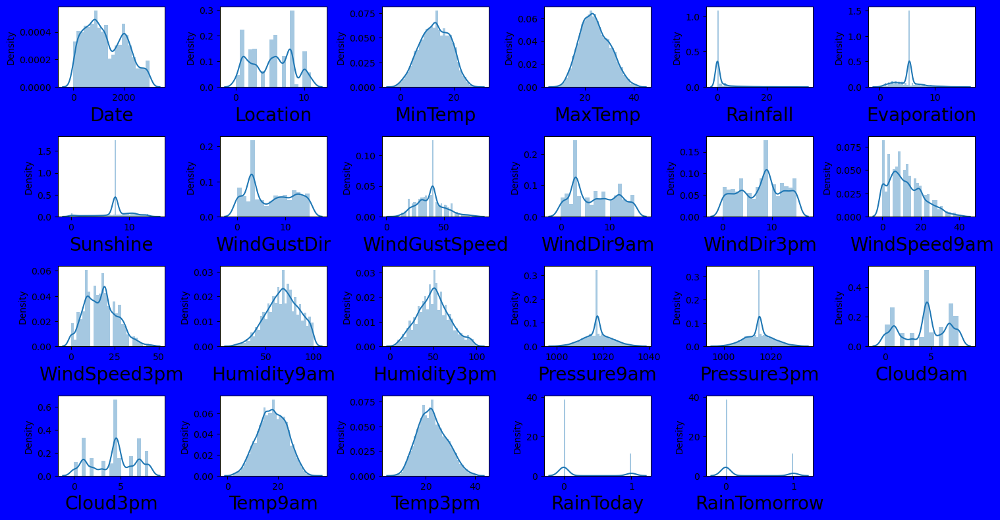

In [139]:
#Visualizing for the current skewness before Power Transformation
plt.figure(figsize=(15,8), facecolor='blue')#dimension and line color
plotnumber = 1 #like a form of counter which we will see its relevance in the ‘for loop’

for column in df_new:#triggering your for loop
    if plotnumber<=23:#since there are 6 features
        ax = plt.subplot(4,6,plotnumber)#3,3 means arrange the graphs in 3-rows and 4-columns spaces as seen below while plotnumber means plot graphs
        sns.distplot(df_new[column])#performing a distribution plot for all the columns starting with Length
        plt.xlabel(column,fontsize=20)#labelling the x-axis with their respctive column names with a font size of 20
    plotnumber+=1#incrementals for plot number so as to allow ploting one by one until it gets to 12
plt.tight_layout()#This is just to show you data in a compact form. 

Let lets go ahead and apply Power Transformation!

In [143]:
#Instantiating PowerTransformer,using 'yeo-johnson',into object 'scaler'
scaler = PowerTransformer(method ='yeo-johnson')#intstantiating using the yeo-johnson
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [144]:
#extracting the columns that are skewed
data=['Sunshine','Evaporation']

In [145]:
#Now removing skewness by Power Transformation and updating dataset(df_new) with result
df_new[data] = scaler.fit_transform(df_new[data].values)

In [146]:
df_new

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.0,1.0,13.4,22.900000,0.6,0.171997,-0.155572,13.0,44.000000,13.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
1,1.0,1.0,7.4,25.100000,0.0,0.171997,-0.155572,14.0,44.000000,6.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2,2.0,1.0,12.9,25.700000,0.0,0.171997,-0.155572,15.0,46.000000,13.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
3,3.0,1.0,9.2,28.000000,0.0,0.171997,-0.155572,4.0,24.000000,9.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
4,4.0,1.0,17.5,32.300000,1.0,0.171997,-0.155572,13.0,41.000000,1.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6404,2999.0,9.0,2.8,23.400000,0.0,0.171997,-0.155572,0.0,31.000000,9.0,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0
6405,3000.0,9.0,3.6,25.300000,0.0,0.171997,-0.155572,6.0,22.000000,9.0,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0
6406,3001.0,9.0,5.4,26.900000,0.0,0.171997,-0.155572,3.0,37.000000,9.0,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0
6407,3002.0,9.0,7.8,27.000000,0.0,0.171997,-0.155572,9.0,28.000000,10.0,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0


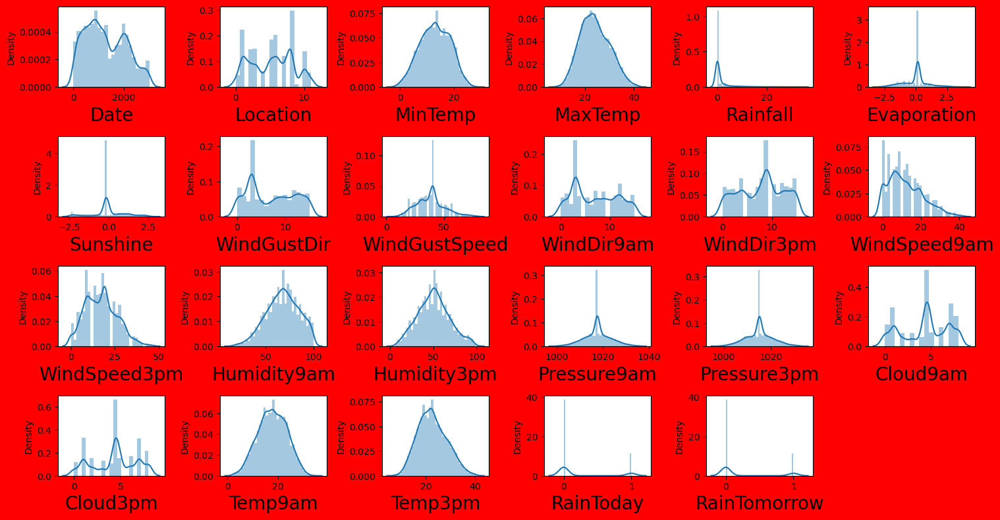

In [148]:
#Visualizing for the current skewness(if any) after Power Transformation
plt.figure(figsize=(15,8), facecolor='red')#dimension and line color
plotnumber = 1 #like a form of counter which we will see its relevance in the ‘for loop’

for column in df_new:#triggering your for loop
    if plotnumber<=24:#since there are 6 features
        ax = plt.subplot(4,6,plotnumber)#3,4 means arrange the graphs in 3-rows and 3-columns spaces as seen below while plotnumber means plot graphs
        sns.distplot(df_new[column])#performing a distribution plot for all the columns
        plt.xlabel(column,fontsize=20)#labelling the x-axis with their respctive column names with a font size of 20
    plotnumber+=1#incrementals for plot number so as to allow ploting one by one until it gets to 12
plt.tight_layout()#This is just to show you data in a compact form. 

In [149]:
#rechecking for skewness
df_new.skew()

Date             0.321759
Location         0.004558
MinTemp         -0.079583
MaxTemp          0.266849
Rainfall         3.514866
Evaporation      0.070907
Sunshine        -0.031067
WindGustDir      0.178714
WindGustSpeed    0.434313
WindDir9am       0.210848
WindDir3pm      -0.128886
WindSpeed9am     0.673887
WindSpeed3pm     0.336515
Humidity9am     -0.233515
Humidity3pm      0.156591
Pressure9am      0.062576
Pressure3pm      0.077866
Cloud9am        -0.279140
Cloud3pm        -0.212402
Temp9am         -0.071954
Temp3pm          0.292131
RainToday        1.331440
RainTomorrow     1.330358
dtype: float64

From the above you can see all skewness in all continuos data are now within the threshold of +/-0.5 which was chosen earlier!

From the above we can see that skewness has been removed!

NOTE:
- All continuos data columns was considered for skewness removal
- The rainfall is not considered for skewness since its the Target data

# Feature selection and engineering

# lets import a package to select the best features

# automatic feature selection by using featurewiz package

In [151]:
from featurewiz import featurewiz

Imported 0.2.02 version. Select nrows to a small number when running on huge datasets.
output = featurewiz(dataname, target, corr_limit=0.90, verbose=2, sep=',', 
		header=0, test_data='',feature_engg='', category_encoders='',
		dask_xgboost_flag=False, nrows=None, skip_sulov=False)
Create new features via 'feature_engg' flag : ['interactions','groupby','target']



############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Correlation Limit = 0.7
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Regression problem ####
    Loaded train data. Shape = (6409, 23)
#### Single_Label Regression problem ####
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
        No variables were removed since no ID o

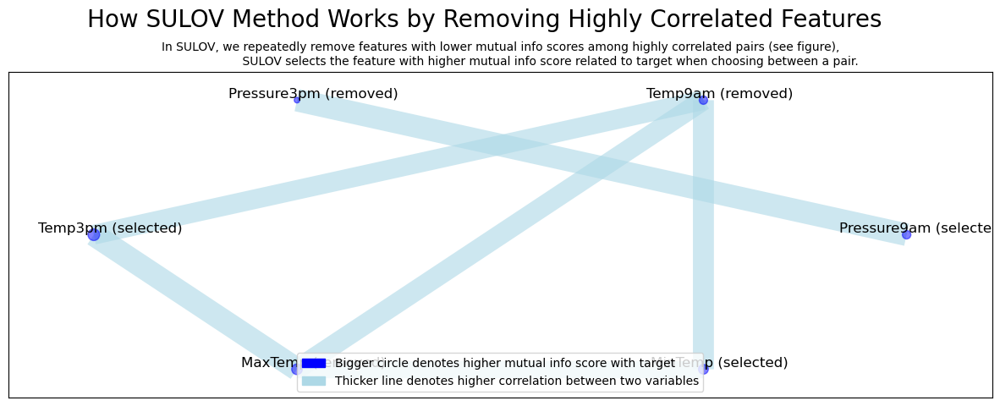

Time taken for SULOV method = 1 seconds
    Adding 0 categorical variables to reduced numeric variables  of 19
Final list of selected 19 vars after SULOV = ['Cloud3pm', 'Cloud9am', 'Date', 'Evaporation', 'Humidity3pm', 'Humidity9am', 'Location', 'RainToday', 'RainTomorrow', 'Sunshine', 'WindDir3pm', 'WindDir9am', 'WindGustDir', 'WindGustSpeed', 'WindSpeed3pm', 'WindSpeed9am', 'Temp3pm', 'MinTemp', 'Pressure9am']
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Current number of predictors before recursive XGBoost = 19 
    Taking top 5 features per iteration...
    XGBoost version using 1.6.2 as tree method: hist
Number of booster rounds = 100
        using 19 variables...
            s

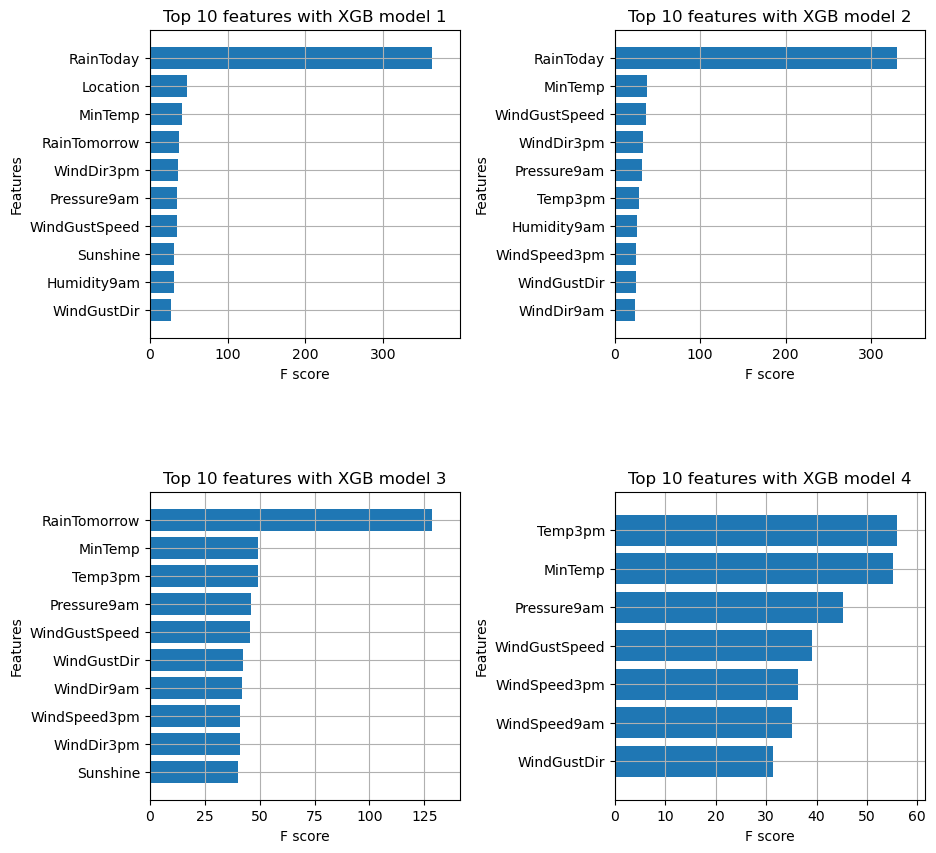

    Completed XGBoost feature selection in 1 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 10 important features:
['RainToday', 'Location', 'MinTemp', 'RainTomorrow', 'WindDir3pm', 'Pressure9am', 'WindGustSpeed', 'Sunshine', 'Humidity9am', 'Temp3pm']
Total Time taken for featurewiz selection = 3 seconds
Output contains a list of 10 important features and a train dataframe


In [153]:
target = 'Rainfall'
 
features, train = featurewiz(df_new, target, corr_limit=0.7, verbose=2, sep=",",
header=0,test_data="", feature_engg="", category_encoders="")

In [154]:
# As you can see, Featurewiz selects 10 important features from the dataset. The Featurewiz instance returns two objects 

# Features - a list of selected features
# One dataframe - This dataframe contains only selected features and the target variable.
# Now you can train the models with selected features.

# Let see the list of selected features.

print(features)

['RainToday', 'Location', 'MinTemp', 'RainTomorrow', 'WindDir3pm', 'Pressure9am', 'WindGustSpeed', 'Sunshine', 'Humidity9am', 'Temp3pm']


In [155]:
df_new[features]

,RainToday,Location,MinTemp,RainTomorrow,WindDir3pm,Pressure9am,WindGustSpeed,Sunshine,Humidity9am,Temp3pm
0,0.0,1.0,13.4,0.0,14.0,1007.7,44.000000,-0.155572,71.0,21.8
1,0.0,1.0,7.4,0.0,15.0,1010.6,44.000000,-0.155572,44.0,24.3
2,0.0,1.0,12.9,0.0,15.0,1007.6,46.000000,-0.155572,38.0,23.2
3,0.0,1.0,9.2,0.0,0.0,1017.6,24.000000,-0.155572,45.0,26.5
4,0.0,1.0,17.5,0.0,7.0,1010.8,41.000000,-0.155572,82.0,29.7
...,...,...,...,...,...,...,...,...,...,...
6404,0.0,9.0,2.8,0.0,1.0,1024.6,31.000000,-0.155572,51.0,22.4
6405,0.0,9.0,3.6,0.0,3.0,1023.5,22.000000,-0.155572,56.0,24.5
6406,0.0,9.0,5.4,0.0,14.0,1021.0,37.000000,-0.155572,53.0,26.1
6407,0.0,9.0,7.8,0.0,3.0,1019.4,28.000000,-0.155572,51.0,26.0


# Step 4.5 - Seperating the datasets into X and Y variables

In [156]:
#seperation
X=df_new[features]
Y=df_new['Rainfall']

# Transforming data into standard normal distribution

In [157]:
#transforming dataset into a standard normal distribution
scalar=StandardScaler()
X_Scaled = scalar.fit_transform(X)
X_Scaled

array([[-0.53567508, -1.39139642,  0.06901307, ..., -0.15557161,
         0.19945255, -0.1489768 ],
       [-0.53567508, -1.39139642, -1.01398407, ..., -0.15557161,
        -1.3957836 ,  0.27706816],
       [-0.53567508, -1.39139642, -0.02123669, ..., -0.15557161,
        -1.75028052,  0.08960838],
       ...,
       [-0.53567508,  1.20333978, -1.37498311, ..., -0.15557161,
        -0.86403822,  0.58382054],
       [-0.53567508,  1.20333978, -0.94178426, ..., -0.15557161,
        -0.98220386,  0.56677874],
       [-0.53567508,  1.20333978,  0.33976236, ..., -0.15557161,
        -0.33229283, -0.30235299]])

What standard scaler does is to bring mean to zero and standard deviation to 1

In [158]:
#reconfirming that mean is 0
X_Scaled.mean()

-6.279472702988309e-16

In [159]:
#reconfirming that standard deviation is 1
X_Scaled.std()

1.0

# Step 5 - MODEL BUILDING

# Step 5.1 - Linear Regression

# Best Random State

In [160]:
#Using LinearRegression to get the best Random state
lm=LinearRegression()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    lm.fit(x_train,y_train)
    pred_train=lm.predict(x_train)
    pred_test=lm.predict(x_test)
    print("At random state of :-",i,"Testing Accuracy and Training Accuracy are:- ",round(metrics.r2_score(y_test,pred_test)*100,2), "and", round(metrics.r2_score(y_train,pred_train)*100,2), "respectively")
    print("At random state of :- ",i, "the mean absolute error of Testing and Training are:- ",round(mean_absolute_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the mean squared error of Testing and Training are:- ",round(mean_squared_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the root mean squared error of Testing and Training are:- ",round(np.sqrt(mean_squared_error(y_test,pred_test)),2), "and", round(np.sqrt(mean_absolute_error(y_train,pred_train)),2), "respectively")
    print("\n")

At random state of :- 0 Testing Accuracy and Training Accuracy are:-  45.83 and 50.21 respectively
At random state of :-  0 the mean absolute error of Testing and Training are:-  1.59 and 1.59 respectively
At random state of :-  0 the mean squared error of Testing and Training are:-  11.87 and 1.59 respectively
At random state of :-  0 the root mean squared error of Testing and Training are:-  3.45 and 1.26 respectively


At random state of :- 1 Testing Accuracy and Training Accuracy are:-  49.03 and 49.46 respectively
At random state of :-  1 the mean absolute error of Testing and Training are:-  1.49 and 1.58 respectively
At random state of :-  1 the mean squared error of Testing and Training are:-  10.65 and 1.58 respectively
At random state of :-  1 the root mean squared error of Testing and Training are:-  3.26 and 1.26 respectively


At random state of :- 2 Testing Accuracy and Training Accuracy are:-  49.63 and 49.29 respectively
At random state of :-  2 the mean absolute error 

At random state of :-  21 the root mean squared error of Testing and Training are:-  3.33 and 1.26 respectively


At random state of :- 22 Testing Accuracy and Training Accuracy are:-  48.37 and 49.56 respectively
At random state of :-  22 the mean absolute error of Testing and Training are:-  1.48 and 1.6 respectively
At random state of :-  22 the mean squared error of Testing and Training are:-  10.11 and 1.6 respectively
At random state of :-  22 the root mean squared error of Testing and Training are:-  3.18 and 1.27 respectively


At random state of :- 23 Testing Accuracy and Training Accuracy are:-  52.03 and 48.77 respectively
At random state of :-  23 the mean absolute error of Testing and Training are:-  1.53 and 1.58 respectively
At random state of :-  23 the mean squared error of Testing and Training are:-  10.46 and 1.58 respectively
At random state of :-  23 the root mean squared error of Testing and Training are:-  3.23 and 1.26 respectively


At random state of :- 24 Tes

At random state of :- 47 Testing Accuracy and Training Accuracy are:-  52.91 and 48.44 respectively
At random state of :-  47 the mean absolute error of Testing and Training are:-  1.5 and 1.58 respectively
At random state of :-  47 the mean squared error of Testing and Training are:-  11.08 and 1.58 respectively
At random state of :-  47 the root mean squared error of Testing and Training are:-  3.33 and 1.26 respectively


At random state of :- 48 Testing Accuracy and Training Accuracy are:-  50.5 and 49.11 respectively
At random state of :-  48 the mean absolute error of Testing and Training are:-  1.58 and 1.56 respectively
At random state of :-  48 the mean squared error of Testing and Training are:-  10.99 and 1.56 respectively
At random state of :-  48 the root mean squared error of Testing and Training are:-  3.32 and 1.25 respectively


At random state of :- 49 Testing Accuracy and Training Accuracy are:-  49.15 and 49.44 respectively
At random state of :-  49 the mean absolut

At random state of :- 67 Testing Accuracy and Training Accuracy are:-  50.5 and 49.13 respectively
At random state of :-  67 the mean absolute error of Testing and Training are:-  1.56 and 1.56 respectively
At random state of :-  67 the mean squared error of Testing and Training are:-  10.86 and 1.56 respectively
At random state of :-  67 the root mean squared error of Testing and Training are:-  3.3 and 1.25 respectively


At random state of :- 68 Testing Accuracy and Training Accuracy are:-  47.66 and 49.77 respectively
At random state of :-  68 the mean absolute error of Testing and Training are:-  1.58 and 1.59 respectively
At random state of :-  68 the mean squared error of Testing and Training are:-  11.12 and 1.59 respectively
At random state of :-  68 the root mean squared error of Testing and Training are:-  3.34 and 1.26 respectively


At random state of :- 69 Testing Accuracy and Training Accuracy are:-  48.8 and 49.53 respectively
At random state of :-  69 the mean absolute

At random state of :- 88 Testing Accuracy and Training Accuracy are:-  46.0 and 50.28 respectively
At random state of :-  88 the mean absolute error of Testing and Training are:-  1.76 and 1.54 respectively
At random state of :-  88 the mean squared error of Testing and Training are:-  13.2 and 1.54 respectively
At random state of :-  88 the root mean squared error of Testing and Training are:-  3.63 and 1.24 respectively


At random state of :- 89 Testing Accuracy and Training Accuracy are:-  50.04 and 49.16 respectively
At random state of :-  89 the mean absolute error of Testing and Training are:-  1.56 and 1.55 respectively
At random state of :-  89 the mean squared error of Testing and Training are:-  12.77 and 1.55 respectively
At random state of :-  89 the root mean squared error of Testing and Training are:-  3.57 and 1.24 respectively


At random state of :- 90 Testing Accuracy and Training Accuracy are:-  48.22 and 49.69 respectively
At random state of :-  90 the mean absolut

At random state of :- 134 Testing Accuracy and Training Accuracy are:-  50.79 and 49.03 respectively
At random state of :-  134 the mean absolute error of Testing and Training are:-  1.58 and 1.57 respectively
At random state of :-  134 the mean squared error of Testing and Training are:-  11.26 and 1.57 respectively
At random state of :-  134 the root mean squared error of Testing and Training are:-  3.36 and 1.25 respectively


At random state of :- 135 Testing Accuracy and Training Accuracy are:-  48.5 and 49.64 respectively
At random state of :-  135 the mean absolute error of Testing and Training are:-  1.58 and 1.56 respectively
At random state of :-  135 the mean squared error of Testing and Training are:-  12.5 and 1.56 respectively
At random state of :-  135 the root mean squared error of Testing and Training are:-  3.53 and 1.25 respectively


At random state of :- 136 Testing Accuracy and Training Accuracy are:-  47.35 and 49.85 respectively
At random state of :-  136 the me

At random state of :- 159 Testing Accuracy and Training Accuracy are:-  49.96 and 49.25 respectively
At random state of :-  159 the mean absolute error of Testing and Training are:-  1.51 and 1.6 respectively
At random state of :-  159 the mean squared error of Testing and Training are:-  11.16 and 1.6 respectively
At random state of :-  159 the root mean squared error of Testing and Training are:-  3.34 and 1.26 respectively


At random state of :- 160 Testing Accuracy and Training Accuracy are:-  51.41 and 48.94 respectively
At random state of :-  160 the mean absolute error of Testing and Training are:-  1.49 and 1.61 respectively
At random state of :-  160 the mean squared error of Testing and Training are:-  9.68 and 1.61 respectively
At random state of :-  160 the root mean squared error of Testing and Training are:-  3.11 and 1.27 respectively


At random state of :- 161 Testing Accuracy and Training Accuracy are:-  50.98 and 48.96 respectively
At random state of :-  161 the mea

At random state of :-  184 the mean squared error of Testing and Training are:-  11.54 and 1.56 respectively
At random state of :-  184 the root mean squared error of Testing and Training are:-  3.4 and 1.25 respectively


At random state of :- 185 Testing Accuracy and Training Accuracy are:-  50.24 and 49.18 respectively
At random state of :-  185 the mean absolute error of Testing and Training are:-  1.49 and 1.6 respectively
At random state of :-  185 the mean squared error of Testing and Training are:-  10.31 and 1.6 respectively
At random state of :-  185 the root mean squared error of Testing and Training are:-  3.21 and 1.26 respectively


At random state of :- 186 Testing Accuracy and Training Accuracy are:-  50.21 and 49.17 respectively
At random state of :-  186 the mean absolute error of Testing and Training are:-  1.54 and 1.56 respectively
At random state of :-  186 the mean squared error of Testing and Training are:-  11.97 and 1.56 respectively
At random state of :-  186

The best accuracy is 53.95% at random state 128

We have found best_random state value as 128. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [161]:
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=128,test_size=0.20)

In [162]:
x_train.shape

(5127, 10)

In [163]:
x_test.shape

(1282, 10)

In [164]:
y_train.shape

(5127,)

In [165]:
y_test.shape

(1282,)

# Training Model and Metrics Measurement(r2_Score,MAE,MSE,RMSE)

In [166]:
lm=LinearRegression()#Initializing...
lm.fit(x_train,y_train)#Training...
pred_test=lm.predict(x_test)#Prediciting using test data...
pred_train=lm.predict(x_train)#Prediciting using training data...
Test_Accuracy_lm= (metrics.r2_score(y_test,pred_test))#Calculating r2 score for test data
Train_Accuracy_lm= (metrics.r2_score(y_train,pred_train))#Calculating r2 score for training data
Test_mae_lm= mean_absolute_error(y_test,pred_test)#Calculating mean absolute error for test data
Train_mae_lm= mean_absolute_error(y_train,pred_train)#Calculating mean absolute error for training data
Test_mse_lm= mean_squared_error(y_test,pred_test)#Calculating mean squared error for test data
Train_mse_lm= mean_squared_error(y_train,pred_train)#Calculating mean squared error for training data
Test_rmse_lm= np.sqrt(mean_squared_error(y_test,pred_test))#Calculating root mean squared error for test data
Train_rmse_lm= np.sqrt(mean_squared_error(y_train,pred_train))#Calculating root mean squared error for training data
print("Test_Accuracy ",round(metrics.r2_score(y_test,pred_test)*100,2))#printing testing accuracy
print("Test_MAE ", Test_mae_lm)#printing mean absolute error
print("Test_MSE ", Test_mse_lm)#printing mean squared error
print("Test_RMSE ", Test_rmse_lm)#printing root mean squared error

Test_Accuracy  53.94
Test_MAE  1.4258138616819251
Test_MSE  9.618823770072655
Test_RMSE  3.101422862183204


LinearRegression is producing average accuracy 53.94% which is very Good!. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [167]:
#Validation accuracy
vac=cross_val_score(lm,X,Y,cv=5)
CV_Score_lm=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_lm)

[0.50053677 0.48774324 0.45897394 0.46719584 0.53439664]
Cross Validation Score is  0.489769284749385


# Difference between Accuracy Score and Cross Validation Score

In [168]:
Test_Accuracy_lm

0.5393576388546356

In [169]:
CV_Score_lm

0.489769284749385

In [170]:
lm_Acc_vs_CV_Score=np.abs(Test_Accuracy_lm-CV_Score_lm)
print("Difference between Accuracy and Cross Validation Score = ",lm_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.04958835410525059


From the above you can see that difference between Accuracy and Cross Validation score is negligible (0.0495) meaning that model is not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see performance of other Models!

# Step 5.2 - KNN Regressor

# Best Random State

In [171]:
#Using KNeighbors Regressor to get the best Random state
knn=KNeighborsRegressor()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    knn.fit(x_train,y_train)
    pred_train=knn.predict(x_train)
    pred_test=knn.predict(x_test)
    print("At random state of :-",i,"Testing Accuracy and Training Accuracy are:- ",round(metrics.r2_score(y_test,pred_test)*100,2), "and", round(metrics.r2_score(y_train,pred_train)*100,2), "respectively")
    print("At random state of :- ",i, "the mean absolute error of Testing and Training are:- ",round(mean_absolute_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the mean squared error of Testing and Training are:- ",round(mean_squared_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the root mean squared error of Testing and Training are:- ",round(np.sqrt(mean_squared_error(y_test,pred_test)),2), "and", round(np.sqrt(mean_absolute_error(y_train,pred_train)),2), "respectively")
    print("\n")

At random state of :- 0 Testing Accuracy and Training Accuracy are:-  43.95 and 63.0 respectively
At random state of :-  0 the mean absolute error of Testing and Training are:-  1.35 and 1.16 respectively
At random state of :-  0 the mean squared error of Testing and Training are:-  12.28 and 1.16 respectively
At random state of :-  0 the root mean squared error of Testing and Training are:-  3.5 and 1.08 respectively


At random state of :- 1 Testing Accuracy and Training Accuracy are:-  43.04 and 62.59 respectively
At random state of :-  1 the mean absolute error of Testing and Training are:-  1.35 and 1.18 respectively
At random state of :-  1 the mean squared error of Testing and Training are:-  11.9 and 1.18 respectively
At random state of :-  1 the root mean squared error of Testing and Training are:-  3.45 and 1.09 respectively


At random state of :- 2 Testing Accuracy and Training Accuracy are:-  45.51 and 63.59 respectively
At random state of :-  2 the mean absolute error of 

At random state of :- 20 Testing Accuracy and Training Accuracy are:-  43.27 and 64.14 respectively
At random state of :-  20 the mean absolute error of Testing and Training are:-  1.54 and 1.11 respectively
At random state of :-  20 the mean squared error of Testing and Training are:-  14.08 and 1.11 respectively
At random state of :-  20 the root mean squared error of Testing and Training are:-  3.75 and 1.06 respectively


At random state of :- 21 Testing Accuracy and Training Accuracy are:-  40.01 and 63.38 respectively
At random state of :-  21 the mean absolute error of Testing and Training are:-  1.4 and 1.16 respectively
At random state of :-  21 the mean squared error of Testing and Training are:-  12.65 and 1.16 respectively
At random state of :-  21 the root mean squared error of Testing and Training are:-  3.56 and 1.08 respectively


At random state of :- 22 Testing Accuracy and Training Accuracy are:-  45.38 and 62.21 respectively
At random state of :-  22 the mean absolu

At random state of :- 40 Testing Accuracy and Training Accuracy are:-  41.05 and 63.5 respectively
At random state of :-  40 the mean absolute error of Testing and Training are:-  1.54 and 1.13 respectively
At random state of :-  40 the mean squared error of Testing and Training are:-  14.59 and 1.13 respectively
At random state of :-  40 the root mean squared error of Testing and Training are:-  3.82 and 1.06 respectively


At random state of :- 41 Testing Accuracy and Training Accuracy are:-  42.0 and 62.48 respectively
At random state of :-  41 the mean absolute error of Testing and Training are:-  1.45 and 1.16 respectively
At random state of :-  41 the mean squared error of Testing and Training are:-  13.11 and 1.16 respectively
At random state of :-  41 the root mean squared error of Testing and Training are:-  3.62 and 1.08 respectively


At random state of :- 42 Testing Accuracy and Training Accuracy are:-  41.77 and 63.08 respectively
At random state of :-  42 the mean absolut

At random state of :- 60 Testing Accuracy and Training Accuracy are:-  44.06 and 63.25 respectively
At random state of :-  60 the mean absolute error of Testing and Training are:-  1.46 and 1.13 respectively
At random state of :-  60 the mean squared error of Testing and Training are:-  12.93 and 1.13 respectively
At random state of :-  60 the root mean squared error of Testing and Training are:-  3.6 and 1.07 respectively


At random state of :- 61 Testing Accuracy and Training Accuracy are:-  42.88 and 63.65 respectively
At random state of :-  61 the mean absolute error of Testing and Training are:-  1.45 and 1.14 respectively
At random state of :-  61 the mean squared error of Testing and Training are:-  13.29 and 1.14 respectively
At random state of :-  61 the root mean squared error of Testing and Training are:-  3.65 and 1.07 respectively


At random state of :- 62 Testing Accuracy and Training Accuracy are:-  42.0 and 63.76 respectively
At random state of :-  62 the mean absolut

At random state of :- 80 Testing Accuracy and Training Accuracy are:-  44.0 and 62.9 respectively
At random state of :-  80 the mean absolute error of Testing and Training are:-  1.43 and 1.15 respectively
At random state of :-  80 the mean squared error of Testing and Training are:-  13.95 and 1.15 respectively
At random state of :-  80 the root mean squared error of Testing and Training are:-  3.73 and 1.07 respectively


At random state of :- 81 Testing Accuracy and Training Accuracy are:-  46.87 and 61.37 respectively
At random state of :-  81 the mean absolute error of Testing and Training are:-  1.46 and 1.14 respectively
At random state of :-  81 the mean squared error of Testing and Training are:-  13.35 and 1.14 respectively
At random state of :-  81 the root mean squared error of Testing and Training are:-  3.65 and 1.07 respectively


At random state of :- 82 Testing Accuracy and Training Accuracy are:-  43.66 and 62.6 respectively
At random state of :-  82 the mean absolute

At random state of :- 100 Testing Accuracy and Training Accuracy are:-  41.36 and 62.96 respectively
At random state of :-  100 the mean absolute error of Testing and Training are:-  1.35 and 1.19 respectively
At random state of :-  100 the mean squared error of Testing and Training are:-  12.43 and 1.19 respectively
At random state of :-  100 the root mean squared error of Testing and Training are:-  3.53 and 1.09 respectively


At random state of :- 101 Testing Accuracy and Training Accuracy are:-  47.61 and 62.61 respectively
At random state of :-  101 the mean absolute error of Testing and Training are:-  1.31 and 1.17 respectively
At random state of :-  101 the mean squared error of Testing and Training are:-  12.0 and 1.17 respectively
At random state of :-  101 the root mean squared error of Testing and Training are:-  3.46 and 1.08 respectively


At random state of :- 102 Testing Accuracy and Training Accuracy are:-  48.79 and 61.95 respectively
At random state of :-  102 the m

At random state of :- 119 Testing Accuracy and Training Accuracy are:-  44.92 and 62.71 respectively
At random state of :-  119 the mean absolute error of Testing and Training are:-  1.36 and 1.17 respectively
At random state of :-  119 the mean squared error of Testing and Training are:-  11.89 and 1.17 respectively
At random state of :-  119 the root mean squared error of Testing and Training are:-  3.45 and 1.08 respectively


At random state of :- 120 Testing Accuracy and Training Accuracy are:-  44.85 and 62.17 respectively
At random state of :-  120 the mean absolute error of Testing and Training are:-  1.43 and 1.16 respectively
At random state of :-  120 the mean squared error of Testing and Training are:-  13.08 and 1.16 respectively
At random state of :-  120 the root mean squared error of Testing and Training are:-  3.62 and 1.08 respectively


At random state of :- 121 Testing Accuracy and Training Accuracy are:-  42.76 and 63.16 respectively
At random state of :-  121 the 

At random state of :- 138 Testing Accuracy and Training Accuracy are:-  41.79 and 63.42 respectively
At random state of :-  138 the mean absolute error of Testing and Training are:-  1.54 and 1.13 respectively
At random state of :-  138 the mean squared error of Testing and Training are:-  13.96 and 1.13 respectively
At random state of :-  138 the root mean squared error of Testing and Training are:-  3.74 and 1.06 respectively


At random state of :- 139 Testing Accuracy and Training Accuracy are:-  46.72 and 63.43 respectively
At random state of :-  139 the mean absolute error of Testing and Training are:-  1.34 and 1.16 respectively
At random state of :-  139 the mean squared error of Testing and Training are:-  11.24 and 1.16 respectively
At random state of :-  139 the root mean squared error of Testing and Training are:-  3.35 and 1.08 respectively


At random state of :- 140 Testing Accuracy and Training Accuracy are:-  42.74 and 63.41 respectively
At random state of :-  140 the 

At random state of :- 157 Testing Accuracy and Training Accuracy are:-  42.24 and 64.06 respectively
At random state of :-  157 the mean absolute error of Testing and Training are:-  1.32 and 1.16 respectively
At random state of :-  157 the mean squared error of Testing and Training are:-  12.62 and 1.16 respectively
At random state of :-  157 the root mean squared error of Testing and Training are:-  3.55 and 1.08 respectively


At random state of :- 158 Testing Accuracy and Training Accuracy are:-  48.45 and 62.07 respectively
At random state of :-  158 the mean absolute error of Testing and Training are:-  1.28 and 1.18 respectively
At random state of :-  158 the mean squared error of Testing and Training are:-  10.84 and 1.18 respectively
At random state of :-  158 the root mean squared error of Testing and Training are:-  3.29 and 1.09 respectively


At random state of :- 159 Testing Accuracy and Training Accuracy are:-  41.58 and 63.69 respectively
At random state of :-  159 the 

At random state of :- 176 Testing Accuracy and Training Accuracy are:-  48.92 and 62.86 respectively
At random state of :-  176 the mean absolute error of Testing and Training are:-  1.32 and 1.16 respectively
At random state of :-  176 the mean squared error of Testing and Training are:-  11.48 and 1.16 respectively
At random state of :-  176 the root mean squared error of Testing and Training are:-  3.39 and 1.08 respectively


At random state of :- 177 Testing Accuracy and Training Accuracy are:-  42.04 and 63.63 respectively
At random state of :-  177 the mean absolute error of Testing and Training are:-  1.48 and 1.14 respectively
At random state of :-  177 the mean squared error of Testing and Training are:-  14.28 and 1.14 respectively
At random state of :-  177 the root mean squared error of Testing and Training are:-  3.78 and 1.07 respectively


At random state of :- 178 Testing Accuracy and Training Accuracy are:-  43.19 and 63.31 respectively
At random state of :-  178 the 

At random state of :- 195 Testing Accuracy and Training Accuracy are:-  41.99 and 62.43 respectively
At random state of :-  195 the mean absolute error of Testing and Training are:-  1.39 and 1.18 respectively
At random state of :-  195 the mean squared error of Testing and Training are:-  12.71 and 1.18 respectively
At random state of :-  195 the root mean squared error of Testing and Training are:-  3.57 and 1.09 respectively


At random state of :- 196 Testing Accuracy and Training Accuracy are:-  44.74 and 63.95 respectively
At random state of :-  196 the mean absolute error of Testing and Training are:-  1.55 and 1.1 respectively
At random state of :-  196 the mean squared error of Testing and Training are:-  15.0 and 1.1 respectively
At random state of :-  196 the root mean squared error of Testing and Training are:-  3.87 and 1.05 respectively


At random state of :- 197 Testing Accuracy and Training Accuracy are:-  40.31 and 63.45 respectively
At random state of :-  197 the mea

The best accuracy is 49.24% at random state 64

We have found best_random state value as 64. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [172]:
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=64,test_size=0.20)

# Training Model and Metrics Measurement(r2_Score,MAE,MSE,RMSE)

In [173]:
knn=KNeighborsRegressor()#Initializing...
knn.fit(x_train,y_train)#Training...
pred_test=knn.predict(x_test)#Prediciting using test data...
pred_train=knn.predict(x_train)#Prediciting using training data...
Test_Accuracy_knn= (metrics.r2_score(y_test,pred_test))#Calculating r2 score for test data
Train_Accuracy_knn= (metrics.r2_score(y_train,pred_train))#Calculating r2 score for training data
Test_mae_knn= mean_absolute_error(y_test,pred_test)#Calculating mean absolute error for test data
Train_mae_knn= mean_absolute_error(y_train,pred_train)#Calculating mean absolute error for training data
Test_mse_knn= mean_squared_error(y_test,pred_test)#Calculating mean squared error for test data
Train_mse_knn= mean_squared_error(y_train,pred_train)#Calculating mean squared error for training data
Test_rmse_knn= np.sqrt(mean_squared_error(y_test,pred_test))#Calculating root mean squared error for test data
Train_rmse_knn= np.sqrt(mean_squared_error(y_train,pred_train))#Calculating root mean squared error for training data
print("Test_Accuracy ",round(metrics.r2_score(y_test,pred_test)*100,2))#printing testing accuracy
print("Test_MAE ", Test_mae_knn)#printing mean absolute error
print("Test_MSE ", Test_mse_knn)#printing mean squared error
print("Test_RMSE ", Test_rmse_knn)#printing root mean squared error

Test_Accuracy  42.01
Test_MAE  1.4183712205177281
Test_MSE  12.268619101630112
Test_RMSE  3.5026588617263474


KNeighbors is producing average accuracy 42% which is very Good!. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [174]:
#Validation accuracy
vac=cross_val_score(knn,X,Y,cv=5)
CV_Score_knn=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_knn)

[ 0.15668035  0.03494327 -0.01808166  0.20395015  0.19855657]
Cross Validation Score is  0.11520973582938365


# Difference between Accuracy Score and Cross Validation Score

In [175]:
Test_Accuracy_knn

0.4200678808225843

In [176]:
CV_Score_knn

0.11520973582938365

In [177]:
knn_Acc_vs_CV_Score=np.abs(Test_Accuracy_knn-CV_Score_knn)
print("Difference between Accuracy and Cross Validation Score = ",knn_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.30485814499320063


From the above you can see that difference between Accuracy and Cross Validation score is negligible (0.304) meaning that model is not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see performance of other Models!

# Step 5.3 - Decision Tree Regressor

In [178]:
#Using Decision Tree Regressor to get the best Random state
dt=DecisionTreeRegressor()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    dt.fit(x_train,y_train)
    pred_train=dt.predict(x_train)
    pred_test=dt.predict(x_test)
    print("At random state of :-",i,"Testing Accuracy and Training Accuracy are:- ",round(metrics.r2_score(y_test,pred_test)*100,2), "and", round(metrics.r2_score(y_train,pred_train)*100,2), "respectively")
    print("At random state of :- ",i, "the mean absolute error of Testing and Training are:- ",round(mean_absolute_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the mean squared error of Testing and Training are:- ",round(mean_squared_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the root mean squared error of Testing and Training are:- ",round(np.sqrt(mean_squared_error(y_test,pred_test)),2), "and", round(np.sqrt(mean_absolute_error(y_train,pred_train)),2), "respectively")
    print("\n")

At random state of :- 0 Testing Accuracy and Training Accuracy are:-  2.93 and 99.88 respectively
At random state of :-  0 the mean absolute error of Testing and Training are:-  1.69 and 0.01 respectively
At random state of :-  0 the mean squared error of Testing and Training are:-  21.27 and 0.01 respectively
At random state of :-  0 the root mean squared error of Testing and Training are:-  4.61 and 0.09 respectively


At random state of :- 1 Testing Accuracy and Training Accuracy are:-  -11.01 and 99.88 respectively
At random state of :-  1 the mean absolute error of Testing and Training are:-  1.84 and 0.01 respectively
At random state of :-  1 the mean squared error of Testing and Training are:-  23.2 and 0.01 respectively
At random state of :-  1 the root mean squared error of Testing and Training are:-  4.82 and 0.09 respectively


At random state of :- 2 Testing Accuracy and Training Accuracy are:-  4.98 and 99.88 respectively
At random state of :-  2 the mean absolute error of

At random state of :- 21 Testing Accuracy and Training Accuracy are:-  -6.85 and 99.88 respectively
At random state of :-  21 the mean absolute error of Testing and Training are:-  1.8 and 0.01 respectively
At random state of :-  21 the mean squared error of Testing and Training are:-  22.54 and 0.01 respectively
At random state of :-  21 the root mean squared error of Testing and Training are:-  4.75 and 0.09 respectively


At random state of :- 22 Testing Accuracy and Training Accuracy are:-  2.5 and 99.88 respectively
At random state of :-  22 the mean absolute error of Testing and Training are:-  1.68 and 0.01 respectively
At random state of :-  22 the mean squared error of Testing and Training are:-  19.1 and 0.01 respectively
At random state of :-  22 the root mean squared error of Testing and Training are:-  4.37 and 0.09 respectively


At random state of :- 23 Testing Accuracy and Training Accuracy are:-  2.23 and 99.97 respectively
At random state of :-  23 the mean absolute e

At random state of :- 44 Testing Accuracy and Training Accuracy are:-  3.33 and 99.97 respectively
At random state of :-  44 the mean absolute error of Testing and Training are:-  1.8 and 0.01 respectively
At random state of :-  44 the mean squared error of Testing and Training are:-  22.79 and 0.01 respectively
At random state of :-  44 the root mean squared error of Testing and Training are:-  4.77 and 0.07 respectively


At random state of :- 45 Testing Accuracy and Training Accuracy are:-  0.42 and 99.97 respectively
At random state of :-  45 the mean absolute error of Testing and Training are:-  1.74 and 0.0 respectively
At random state of :-  45 the mean squared error of Testing and Training are:-  21.54 and 0.0 respectively
At random state of :-  45 the root mean squared error of Testing and Training are:-  4.64 and 0.07 respectively


At random state of :- 46 Testing Accuracy and Training Accuracy are:-  5.07 and 99.88 respectively
At random state of :-  46 the mean absolute er

At random state of :- 69 Testing Accuracy and Training Accuracy are:-  10.81 and 99.88 respectively
At random state of :-  69 the mean absolute error of Testing and Training are:-  1.82 and 0.01 respectively
At random state of :-  69 the mean squared error of Testing and Training are:-  22.36 and 0.01 respectively
At random state of :-  69 the root mean squared error of Testing and Training are:-  4.73 and 0.08 respectively


At random state of :- 70 Testing Accuracy and Training Accuracy are:-  -7.43 and 99.88 respectively
At random state of :-  70 the mean absolute error of Testing and Training are:-  1.78 and 0.01 respectively
At random state of :-  70 the mean squared error of Testing and Training are:-  23.21 and 0.01 respectively
At random state of :-  70 the root mean squared error of Testing and Training are:-  4.82 and 0.09 respectively


At random state of :- 71 Testing Accuracy and Training Accuracy are:-  4.67 and 99.97 respectively
At random state of :-  71 the mean absolu

At random state of :- 90 Testing Accuracy and Training Accuracy are:-  15.87 and 99.87 respectively
At random state of :-  90 the mean absolute error of Testing and Training are:-  1.9 and 0.01 respectively
At random state of :-  90 the mean squared error of Testing and Training are:-  23.12 and 0.01 respectively
At random state of :-  90 the root mean squared error of Testing and Training are:-  4.81 and 0.09 respectively


At random state of :- 91 Testing Accuracy and Training Accuracy are:-  -4.34 and 99.97 respectively
At random state of :-  91 the mean absolute error of Testing and Training are:-  1.9 and 0.0 respectively
At random state of :-  91 the mean squared error of Testing and Training are:-  23.35 and 0.0 respectively
At random state of :-  91 the root mean squared error of Testing and Training are:-  4.83 and 0.07 respectively


At random state of :- 92 Testing Accuracy and Training Accuracy are:-  2.44 and 99.88 respectively
At random state of :-  92 the mean absolute e

At random state of :- 111 Testing Accuracy and Training Accuracy are:-  -8.29 and 99.89 respectively
At random state of :-  111 the mean absolute error of Testing and Training are:-  1.84 and 0.01 respectively
At random state of :-  111 the mean squared error of Testing and Training are:-  22.06 and 0.01 respectively
At random state of :-  111 the root mean squared error of Testing and Training are:-  4.7 and 0.08 respectively


At random state of :- 112 Testing Accuracy and Training Accuracy are:-  5.55 and 99.96 respectively
At random state of :-  112 the mean absolute error of Testing and Training are:-  1.75 and 0.01 respectively
At random state of :-  112 the mean squared error of Testing and Training are:-  22.37 and 0.01 respectively
At random state of :-  112 the root mean squared error of Testing and Training are:-  4.73 and 0.08 respectively


At random state of :- 113 Testing Accuracy and Training Accuracy are:-  14.69 and 99.87 respectively
At random state of :-  113 the me

At random state of :- 133 Testing Accuracy and Training Accuracy are:-  -5.28 and 99.88 respectively
At random state of :-  133 the mean absolute error of Testing and Training are:-  2.03 and 0.01 respectively
At random state of :-  133 the mean squared error of Testing and Training are:-  25.55 and 0.01 respectively
At random state of :-  133 the root mean squared error of Testing and Training are:-  5.05 and 0.08 respectively


At random state of :- 134 Testing Accuracy and Training Accuracy are:-  0.42 and 99.88 respectively
At random state of :-  134 the mean absolute error of Testing and Training are:-  1.8 and 0.01 respectively
At random state of :-  134 the mean squared error of Testing and Training are:-  22.78 and 0.01 respectively
At random state of :-  134 the root mean squared error of Testing and Training are:-  4.77 and 0.09 respectively


At random state of :- 135 Testing Accuracy and Training Accuracy are:-  -7.83 and 99.87 respectively
At random state of :-  135 the me

At random state of :- 157 Testing Accuracy and Training Accuracy are:-  3.91 and 99.88 respectively
At random state of :-  157 the mean absolute error of Testing and Training are:-  1.68 and 0.01 respectively
At random state of :-  157 the mean squared error of Testing and Training are:-  20.99 and 0.01 respectively
At random state of :-  157 the root mean squared error of Testing and Training are:-  4.58 and 0.09 respectively


At random state of :- 158 Testing Accuracy and Training Accuracy are:-  0.61 and 99.97 respectively
At random state of :-  158 the mean absolute error of Testing and Training are:-  1.73 and 0.01 respectively
At random state of :-  158 the mean squared error of Testing and Training are:-  20.91 and 0.01 respectively
At random state of :-  158 the root mean squared error of Testing and Training are:-  4.57 and 0.08 respectively


At random state of :- 159 Testing Accuracy and Training Accuracy are:-  7.24 and 99.88 respectively
At random state of :-  159 the mea

At random state of :- 179 Testing Accuracy and Training Accuracy are:-  -8.36 and 99.97 respectively
At random state of :-  179 the mean absolute error of Testing and Training are:-  1.83 and 0.0 respectively
At random state of :-  179 the mean squared error of Testing and Training are:-  23.64 and 0.0 respectively
At random state of :-  179 the root mean squared error of Testing and Training are:-  4.86 and 0.07 respectively


At random state of :- 180 Testing Accuracy and Training Accuracy are:-  0.63 and 99.97 respectively
At random state of :-  180 the mean absolute error of Testing and Training are:-  1.93 and 0.0 respectively
At random state of :-  180 the mean squared error of Testing and Training are:-  26.19 and 0.0 respectively
At random state of :-  180 the root mean squared error of Testing and Training are:-  5.12 and 0.07 respectively


At random state of :- 181 Testing Accuracy and Training Accuracy are:-  17.13 and 99.88 respectively
At random state of :-  181 the mean 

The best accuracy is 21.14% at random state 106

We have found best_random state value as 106. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [179]:
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=106,test_size=0.20)

# Training Model and Metrics Measurement(r2_Score,MAE,MSE,RMSE)

In [180]:
dt=DecisionTreeRegressor()#Initializing...
dt.fit(x_train,y_train)#Training...
pred_test=dt.predict(x_test)#Prediciting using test data...
pred_train=dt.predict(x_train)#Prediciting using training data...
Test_Accuracy_dt= (metrics.r2_score(y_test,pred_test))#Calculating r2 score for test data
Train_Accuracy_dt= (metrics.r2_score(y_train,pred_train))#Calculating r2 score for training data
Test_mae_dt= mean_absolute_error(y_test,pred_test)#Calculating mean absolute error for test data
Train_mae_dt= mean_absolute_error(y_train,pred_train)#Calculating mean absolute error for training data
Test_mse_dt= mean_squared_error(y_test,pred_test)#Calculating mean squared error for test data
Train_mse_dt= mean_squared_error(y_train,pred_train)#Calculating mean squared error for training data
Test_rmse_dt= np.sqrt(mean_squared_error(y_test,pred_test))#Calculating root mean squared error for test data
Train_rmse_dt= np.sqrt(mean_squared_error(y_train,pred_train))#Calculating root mean squared error for training data
print("Test_Accuracy ",round(metrics.r2_score(y_test,pred_test)*100,2))#printing testing accuracy
print("Test_MAE ", Test_mae_dt)#printing mean absolute error
print("Test_MSE ", Test_mse_dt)#printing mean squared error
print("Test_RMSE ", Test_rmse_dt)#printing root mean squared error

Test_Accuracy  23.78
Test_MAE  1.565063047677681
Test_MSE  17.61839616208132
Test_RMSE  4.197427326599154


Decision Tree is producing average accuracy 23.78% which is very Good!. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [181]:
#Validation accuracy
vac=cross_val_score(dt,X,Y,cv=5)
CV_Score_dt=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_dt)

[ 0.01047568 -0.09327035 -0.06373277 -0.08801785  0.08886486]
Cross Validation Score is  -0.029136083453664363


# Difference between Accuracy Score and Cross Validation Score

In [182]:
Test_Accuracy_dt

0.23782341954304875

In [183]:
CV_Score_dt

-0.029136083453664363

In [184]:
dt_Acc_vs_CV_Score=np.abs(Test_Accuracy_dt-CV_Score_dt)
print("Difference between Accuracy and Cross Validation Score = ",dt_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.2669595029967131


From the above you can see that difference between Accuracy and Cross Validation score is negligible (0.2669) meaning that model is not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see performance of other Models!

# Step 5.4 - RandomForest Regressor

# Best Random State

In [185]:
#Using RandomForest Regressor to get the best Random state
rf=RandomForestRegressor()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    rf.fit(x_train,y_train)
    pred_train=rf.predict(x_train)
    pred_test=rf.predict(x_test)
    print("At random state of :-",i,"Testing Accuracy and Training Accuracy are:- ",round(metrics.r2_score(y_test,pred_test)*100,2), "and", round(metrics.r2_score(y_train,pred_train)*100,2), "respectively")
    print("At random state of :- ",i, "the mean absolute error of Testing and Training are:- ",round(mean_absolute_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the mean squared error of Testing and Training are:- ",round(mean_squared_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the root mean squared error of Testing and Training are:- ",round(np.sqrt(mean_squared_error(y_test,pred_test)),2), "and", round(np.sqrt(mean_absolute_error(y_train,pred_train)),2), "respectively")
    print("\n")


At random state of :- 0 Testing Accuracy and Training Accuracy are:-  46.09 and 93.21 respectively
At random state of :-  0 the mean absolute error of Testing and Training are:-  1.4 and 0.52 respectively
At random state of :-  0 the mean squared error of Testing and Training are:-  11.81 and 0.52 respectively
At random state of :-  0 the root mean squared error of Testing and Training are:-  3.44 and 0.72 respectively


At random state of :- 1 Testing Accuracy and Training Accuracy are:-  48.31 and 92.81 respectively
At random state of :-  1 the mean absolute error of Testing and Training are:-  1.34 and 0.53 respectively
At random state of :-  1 the mean squared error of Testing and Training are:-  10.8 and 0.53 respectively
At random state of :-  1 the root mean squared error of Testing and Training are:-  3.29 and 0.73 respectively


At random state of :- 2 Testing Accuracy and Training Accuracy are:-  50.14 and 93.12 respectively
At random state of :-  2 the mean absolute error of

At random state of :- 20 Testing Accuracy and Training Accuracy are:-  49.92 and 92.96 respectively
At random state of :-  20 the mean absolute error of Testing and Training are:-  1.45 and 0.51 respectively
At random state of :-  20 the mean squared error of Testing and Training are:-  12.43 and 0.51 respectively
At random state of :-  20 the root mean squared error of Testing and Training are:-  3.53 and 0.71 respectively


At random state of :- 21 Testing Accuracy and Training Accuracy are:-  46.43 and 92.94 respectively
At random state of :-  21 the mean absolute error of Testing and Training are:-  1.38 and 0.52 respectively
At random state of :-  21 the mean squared error of Testing and Training are:-  11.3 and 0.52 respectively
At random state of :-  21 the root mean squared error of Testing and Training are:-  3.36 and 0.72 respectively


At random state of :- 22 Testing Accuracy and Training Accuracy are:-  50.72 and 93.01 respectively
At random state of :-  22 the mean absolu

At random state of :- 40 Testing Accuracy and Training Accuracy are:-  49.42 and 93.09 respectively
At random state of :-  40 the mean absolute error of Testing and Training are:-  1.48 and 0.5 respectively
At random state of :-  40 the mean squared error of Testing and Training are:-  12.52 and 0.5 respectively
At random state of :-  40 the root mean squared error of Testing and Training are:-  3.54 and 0.71 respectively


At random state of :- 41 Testing Accuracy and Training Accuracy are:-  49.47 and 93.06 respectively
At random state of :-  41 the mean absolute error of Testing and Training are:-  1.44 and 0.51 respectively
At random state of :-  41 the mean squared error of Testing and Training are:-  11.42 and 0.51 respectively
At random state of :-  41 the root mean squared error of Testing and Training are:-  3.38 and 0.72 respectively


At random state of :- 42 Testing Accuracy and Training Accuracy are:-  52.84 and 92.75 respectively
At random state of :-  42 the mean absolut

At random state of :- 60 Testing Accuracy and Training Accuracy are:-  47.29 and 92.83 respectively
At random state of :-  60 the mean absolute error of Testing and Training are:-  1.51 and 0.52 respectively
At random state of :-  60 the mean squared error of Testing and Training are:-  12.18 and 0.52 respectively
At random state of :-  60 the root mean squared error of Testing and Training are:-  3.49 and 0.72 respectively


At random state of :- 61 Testing Accuracy and Training Accuracy are:-  50.26 and 92.96 respectively
At random state of :-  61 the mean absolute error of Testing and Training are:-  1.4 and 0.51 respectively
At random state of :-  61 the mean squared error of Testing and Training are:-  11.57 and 0.51 respectively
At random state of :-  61 the root mean squared error of Testing and Training are:-  3.4 and 0.72 respectively


At random state of :- 62 Testing Accuracy and Training Accuracy are:-  48.24 and 93.14 respectively
At random state of :-  62 the mean absolut

At random state of :- 80 Testing Accuracy and Training Accuracy are:-  50.0 and 92.87 respectively
At random state of :-  80 the mean absolute error of Testing and Training are:-  1.37 and 0.52 respectively
At random state of :-  80 the mean squared error of Testing and Training are:-  12.45 and 0.52 respectively
At random state of :-  80 the root mean squared error of Testing and Training are:-  3.53 and 0.72 respectively


At random state of :- 81 Testing Accuracy and Training Accuracy are:-  53.76 and 92.97 respectively
At random state of :-  81 the mean absolute error of Testing and Training are:-  1.38 and 0.51 respectively
At random state of :-  81 the mean squared error of Testing and Training are:-  11.62 and 0.51 respectively
At random state of :-  81 the root mean squared error of Testing and Training are:-  3.41 and 0.72 respectively


At random state of :- 82 Testing Accuracy and Training Accuracy are:-  48.01 and 92.97 respectively
At random state of :-  82 the mean absolu

At random state of :- 100 Testing Accuracy and Training Accuracy are:-  49.45 and 92.92 respectively
At random state of :-  100 the mean absolute error of Testing and Training are:-  1.34 and 0.53 respectively
At random state of :-  100 the mean squared error of Testing and Training are:-  10.71 and 0.53 respectively
At random state of :-  100 the root mean squared error of Testing and Training are:-  3.27 and 0.73 respectively


At random state of :- 101 Testing Accuracy and Training Accuracy are:-  51.22 and 92.51 respectively
At random state of :-  101 the mean absolute error of Testing and Training are:-  1.31 and 0.54 respectively
At random state of :-  101 the mean squared error of Testing and Training are:-  11.17 and 0.54 respectively
At random state of :-  101 the root mean squared error of Testing and Training are:-  3.34 and 0.73 respectively


At random state of :- 102 Testing Accuracy and Training Accuracy are:-  53.51 and 92.66 respectively
At random state of :-  102 the 

At random state of :- 119 Testing Accuracy and Training Accuracy are:-  51.35 and 92.79 respectively
At random state of :-  119 the mean absolute error of Testing and Training are:-  1.35 and 0.53 respectively
At random state of :-  119 the mean squared error of Testing and Training are:-  10.51 and 0.53 respectively
At random state of :-  119 the root mean squared error of Testing and Training are:-  3.24 and 0.73 respectively


At random state of :- 120 Testing Accuracy and Training Accuracy are:-  50.96 and 92.97 respectively
At random state of :-  120 the mean absolute error of Testing and Training are:-  1.39 and 0.52 respectively
At random state of :-  120 the mean squared error of Testing and Training are:-  11.63 and 0.52 respectively
At random state of :-  120 the root mean squared error of Testing and Training are:-  3.41 and 0.72 respectively


At random state of :- 121 Testing Accuracy and Training Accuracy are:-  52.43 and 92.89 respectively
At random state of :-  121 the 

At random state of :- 138 Testing Accuracy and Training Accuracy are:-  51.8 and 92.63 respectively
At random state of :-  138 the mean absolute error of Testing and Training are:-  1.42 and 0.52 respectively
At random state of :-  138 the mean squared error of Testing and Training are:-  11.56 and 0.52 respectively
At random state of :-  138 the root mean squared error of Testing and Training are:-  3.4 and 0.72 respectively


At random state of :- 139 Testing Accuracy and Training Accuracy are:-  48.54 and 92.96 respectively
At random state of :-  139 the mean absolute error of Testing and Training are:-  1.36 and 0.53 respectively
At random state of :-  139 the mean squared error of Testing and Training are:-  10.86 and 0.53 respectively
At random state of :-  139 the root mean squared error of Testing and Training are:-  3.3 and 0.73 respectively


At random state of :- 140 Testing Accuracy and Training Accuracy are:-  44.51 and 92.99 respectively
At random state of :-  140 the mea

At random state of :- 157 Testing Accuracy and Training Accuracy are:-  52.4 and 92.81 respectively
At random state of :-  157 the mean absolute error of Testing and Training are:-  1.25 and 0.53 respectively
At random state of :-  157 the mean squared error of Testing and Training are:-  10.4 and 0.53 respectively
At random state of :-  157 the root mean squared error of Testing and Training are:-  3.22 and 0.73 respectively


At random state of :- 158 Testing Accuracy and Training Accuracy are:-  49.37 and 93.0 respectively
At random state of :-  158 the mean absolute error of Testing and Training are:-  1.34 and 0.53 respectively
At random state of :-  158 the mean squared error of Testing and Training are:-  10.65 and 0.53 respectively
At random state of :-  158 the root mean squared error of Testing and Training are:-  3.26 and 0.73 respectively


At random state of :- 159 Testing Accuracy and Training Accuracy are:-  50.6 and 93.19 respectively
At random state of :-  159 the mean

At random state of :- 176 Testing Accuracy and Training Accuracy are:-  52.0 and 92.81 respectively
At random state of :-  176 the mean absolute error of Testing and Training are:-  1.33 and 0.52 respectively
At random state of :-  176 the mean squared error of Testing and Training are:-  10.79 and 0.52 respectively
At random state of :-  176 the root mean squared error of Testing and Training are:-  3.29 and 0.72 respectively


At random state of :- 177 Testing Accuracy and Training Accuracy are:-  49.26 and 92.98 respectively
At random state of :-  177 the mean absolute error of Testing and Training are:-  1.45 and 0.52 respectively
At random state of :-  177 the mean squared error of Testing and Training are:-  12.5 and 0.52 respectively
At random state of :-  177 the root mean squared error of Testing and Training are:-  3.54 and 0.72 respectively


At random state of :- 178 Testing Accuracy and Training Accuracy are:-  48.14 and 93.01 respectively
At random state of :-  178 the me

At random state of :- 195 Testing Accuracy and Training Accuracy are:-  49.83 and 93.03 respectively
At random state of :-  195 the mean absolute error of Testing and Training are:-  1.34 and 0.53 respectively
At random state of :-  195 the mean squared error of Testing and Training are:-  10.99 and 0.53 respectively
At random state of :-  195 the root mean squared error of Testing and Training are:-  3.32 and 0.73 respectively


At random state of :- 196 Testing Accuracy and Training Accuracy are:-  49.61 and 92.94 respectively
At random state of :-  196 the mean absolute error of Testing and Training are:-  1.52 and 0.51 respectively
At random state of :-  196 the mean squared error of Testing and Training are:-  13.68 and 0.51 respectively
At random state of :-  196 the root mean squared error of Testing and Training are:-  3.7 and 0.71 respectively


At random state of :- 197 Testing Accuracy and Training Accuracy are:-  50.67 and 92.78 respectively
At random state of :-  197 the m

The best accuracy is 57.10% at random state 128

We have found best_random state value as 128. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [186]:
#using the random state of 6
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=128,test_size=0.20)

# Training Model and Metrics Measurement(r2_Score,MAE,MSE,RMSE)

In [187]:
rf=RandomForestRegressor()#Initializing...
rf.fit(x_train,y_train)#Training...
pred_test=rf.predict(x_test)#Prediciting using test data...
pred_train=rf.predict(x_train)#Prediciting using training data...
Test_Accuracy_rf= (metrics.r2_score(y_test,pred_test))#Calculating r2 score for test data
Train_Accuracy_rf= (metrics.r2_score(y_train,pred_train))#Calculating r2 score for training data
Test_mae_rf= mean_absolute_error(y_test,pred_test)#Calculating mean absolute error for test data
Train_mae_rf= mean_absolute_error(y_train,pred_train)#Calculating mean absolute error for training data
Test_mse_rf= mean_squared_error(y_test,pred_test)#Calculating mean squared error for test data
Train_mse_rf= mean_squared_error(y_train,pred_train)#Calculating mean squared error for training data
Test_rmse_rf= np.sqrt(mean_squared_error(y_test,pred_test))#Calculating root mean squared error for test data
Train_rmse_rf= np.sqrt(mean_squared_error(y_train,pred_train))#Calculating root mean squared error for training data
print("Test_Accuracy ",round(metrics.r2_score(y_test,pred_test)*100,2))#printing testing accuracy
print("Test_MAE ", Test_mae_rf)#printing mean absolute error
print("Test_MSE ", Test_mse_rf)#printing mean squared error
print("Test_RMSE ", Test_rmse_rf)#printing root mean squared error

Test_Accuracy  57.62
Test_MAE  1.2123537921484802
Test_MSE  8.850314404721336
Test_RMSE  2.9749477986548496


RandomForest is producing fair accuracy = 57.62%!. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [188]:
#Validation accuracy
vac=cross_val_score(rf,X,Y,cv=5)
CV_Score_rf=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_rf)

[0.52834816 0.42820276 0.45359297 0.51018038 0.54327936]
Cross Validation Score is  0.49272072691511093


# Difference between Accuracy Score and Cross Validation Score

In [189]:
Test_Accuracy_rf

0.576161303947159

In [190]:
CV_Score_rf

0.49272072691511093

In [191]:
rf_Acc_vs_CV_Score=np.abs(Test_Accuracy_rf-CV_Score_rf)
print("Difference between Accuracy and Cross Validation Score = ",rf_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.0834405770320481


From the above you can see that difference between Accuracy and Cross Validation score is low (0.0834) meaning that model is not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see performance of other Models!

# Step 5.5 - AdaBoost Classifier

# Best Random State 

In [192]:
#Using AdaBoost Regressor to get the best Random state
ada=AdaBoostRegressor()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    ada.fit(x_train,y_train)
    pred_train=ada.predict(x_train)
    pred_test=ada.predict(x_test)
    print("At random state of :-",i,"Testing Accuracy and Training Accuracy are:- ",round(metrics.r2_score(y_test,pred_test)*100,2), "and", round(metrics.r2_score(y_train,pred_train)*100,2), "respectively")
    print("At random state of :- ",i, "the mean absolute error of Testing and Training are:- ",round(mean_absolute_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the mean squared error of Testing and Training are:- ",round(mean_squared_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the root mean squared error of Testing and Training are:- ",round(np.sqrt(mean_squared_error(y_test,pred_test)),2), "and", round(np.sqrt(mean_absolute_error(y_train,pred_train)),2), "respectively")
    print("\n")

At random state of :- 0 Testing Accuracy and Training Accuracy are:-  33.53 and 45.09 respectively
At random state of :-  0 the mean absolute error of Testing and Training are:-  1.65 and 1.58 respectively
At random state of :-  0 the mean squared error of Testing and Training are:-  14.57 and 1.58 respectively
At random state of :-  0 the root mean squared error of Testing and Training are:-  3.82 and 1.26 respectively


At random state of :- 1 Testing Accuracy and Training Accuracy are:-  38.17 and 45.83 respectively
At random state of :-  1 the mean absolute error of Testing and Training are:-  1.62 and 1.6 respectively
At random state of :-  1 the mean squared error of Testing and Training are:-  12.92 and 1.6 respectively
At random state of :-  1 the root mean squared error of Testing and Training are:-  3.59 and 1.27 respectively


At random state of :- 2 Testing Accuracy and Training Accuracy are:-  43.86 and 40.37 respectively
At random state of :-  2 the mean absolute error of

At random state of :- 20 Testing Accuracy and Training Accuracy are:-  45.47 and 44.86 respectively
At random state of :-  20 the mean absolute error of Testing and Training are:-  1.65 and 1.59 respectively
At random state of :-  20 the mean squared error of Testing and Training are:-  13.54 and 1.59 respectively
At random state of :-  20 the root mean squared error of Testing and Training are:-  3.68 and 1.26 respectively


At random state of :- 21 Testing Accuracy and Training Accuracy are:-  30.16 and 44.57 respectively
At random state of :-  21 the mean absolute error of Testing and Training are:-  1.71 and 1.6 respectively
At random state of :-  21 the mean squared error of Testing and Training are:-  14.73 and 1.6 respectively
At random state of :-  21 the root mean squared error of Testing and Training are:-  3.84 and 1.26 respectively


At random state of :- 22 Testing Accuracy and Training Accuracy are:-  28.99 and 36.98 respectively
At random state of :-  22 the mean absolut

At random state of :- 40 Testing Accuracy and Training Accuracy are:-  44.8 and 41.45 respectively
At random state of :-  40 the mean absolute error of Testing and Training are:-  1.68 and 1.63 respectively
At random state of :-  40 the mean squared error of Testing and Training are:-  13.66 and 1.63 respectively
At random state of :-  40 the root mean squared error of Testing and Training are:-  3.7 and 1.28 respectively


At random state of :- 41 Testing Accuracy and Training Accuracy are:-  40.39 and 43.83 respectively
At random state of :-  41 the mean absolute error of Testing and Training are:-  1.66 and 1.62 respectively
At random state of :-  41 the mean squared error of Testing and Training are:-  13.47 and 1.62 respectively
At random state of :-  41 the root mean squared error of Testing and Training are:-  3.67 and 1.27 respectively


At random state of :- 42 Testing Accuracy and Training Accuracy are:-  33.13 and 40.75 respectively
At random state of :-  42 the mean absolut

At random state of :- 61 Testing Accuracy and Training Accuracy are:-  37.52 and 39.59 respectively
At random state of :-  61 the mean absolute error of Testing and Training are:-  1.71 and 1.65 respectively
At random state of :-  61 the mean squared error of Testing and Training are:-  14.54 and 1.65 respectively
At random state of :-  61 the root mean squared error of Testing and Training are:-  3.81 and 1.28 respectively


At random state of :- 62 Testing Accuracy and Training Accuracy are:-  35.12 and 40.43 respectively
At random state of :-  62 the mean absolute error of Testing and Training are:-  1.75 and 1.67 respectively
At random state of :-  62 the mean squared error of Testing and Training are:-  14.55 and 1.67 respectively
At random state of :-  62 the root mean squared error of Testing and Training are:-  3.81 and 1.29 respectively


At random state of :- 63 Testing Accuracy and Training Accuracy are:-  41.21 and 43.56 respectively
At random state of :-  63 the mean absol

At random state of :- 81 Testing Accuracy and Training Accuracy are:-  41.02 and 38.1 respectively
At random state of :-  81 the mean absolute error of Testing and Training are:-  1.75 and 1.69 respectively
At random state of :-  81 the mean squared error of Testing and Training are:-  14.82 and 1.69 respectively
At random state of :-  81 the root mean squared error of Testing and Training are:-  3.85 and 1.3 respectively


At random state of :- 82 Testing Accuracy and Training Accuracy are:-  22.41 and 39.56 respectively
At random state of :-  82 the mean absolute error of Testing and Training are:-  1.69 and 1.72 respectively
At random state of :-  82 the mean squared error of Testing and Training are:-  13.43 and 1.72 respectively
At random state of :-  82 the root mean squared error of Testing and Training are:-  3.67 and 1.31 respectively


At random state of :- 83 Testing Accuracy and Training Accuracy are:-  49.71 and 43.64 respectively
At random state of :-  83 the mean absolut

At random state of :- 101 Testing Accuracy and Training Accuracy are:-  45.86 and 42.84 respectively
At random state of :-  101 the mean absolute error of Testing and Training are:-  1.51 and 1.65 respectively
At random state of :-  101 the mean squared error of Testing and Training are:-  12.4 and 1.65 respectively
At random state of :-  101 the root mean squared error of Testing and Training are:-  3.52 and 1.28 respectively


At random state of :- 102 Testing Accuracy and Training Accuracy are:-  44.91 and 39.57 respectively
At random state of :-  102 the mean absolute error of Testing and Training are:-  1.71 and 1.66 respectively
At random state of :-  102 the mean squared error of Testing and Training are:-  13.88 and 1.66 respectively
At random state of :-  102 the root mean squared error of Testing and Training are:-  3.73 and 1.29 respectively


At random state of :- 103 Testing Accuracy and Training Accuracy are:-  37.76 and 40.62 respectively
At random state of :-  103 the m

At random state of :- 120 Testing Accuracy and Training Accuracy are:-  39.02 and 39.41 respectively
At random state of :-  120 the mean absolute error of Testing and Training are:-  1.68 and 1.68 respectively
At random state of :-  120 the mean squared error of Testing and Training are:-  14.46 and 1.68 respectively
At random state of :-  120 the root mean squared error of Testing and Training are:-  3.8 and 1.3 respectively


At random state of :- 121 Testing Accuracy and Training Accuracy are:-  41.78 and 40.29 respectively
At random state of :-  121 the mean absolute error of Testing and Training are:-  1.56 and 1.69 respectively
At random state of :-  121 the mean squared error of Testing and Training are:-  12.25 and 1.69 respectively
At random state of :-  121 the root mean squared error of Testing and Training are:-  3.5 and 1.3 respectively


At random state of :- 122 Testing Accuracy and Training Accuracy are:-  46.72 and 45.16 respectively
At random state of :-  122 the mean

At random state of :- 141 Testing Accuracy and Training Accuracy are:-  43.68 and 43.46 respectively
At random state of :-  141 the mean absolute error of Testing and Training are:-  1.6 and 1.62 respectively
At random state of :-  141 the mean squared error of Testing and Training are:-  12.48 and 1.62 respectively
At random state of :-  141 the root mean squared error of Testing and Training are:-  3.53 and 1.27 respectively


At random state of :- 142 Testing Accuracy and Training Accuracy are:-  31.5 and 44.47 respectively
At random state of :-  142 the mean absolute error of Testing and Training are:-  1.7 and 1.63 respectively
At random state of :-  142 the mean squared error of Testing and Training are:-  14.13 and 1.63 respectively
At random state of :-  142 the root mean squared error of Testing and Training are:-  3.76 and 1.28 respectively


At random state of :- 143 Testing Accuracy and Training Accuracy are:-  44.46 and 44.44 respectively
At random state of :-  143 the mea

At random state of :- 162 Testing Accuracy and Training Accuracy are:-  33.93 and 44.01 respectively
At random state of :-  162 the mean absolute error of Testing and Training are:-  1.75 and 1.64 respectively
At random state of :-  162 the mean squared error of Testing and Training are:-  14.46 and 1.64 respectively
At random state of :-  162 the root mean squared error of Testing and Training are:-  3.8 and 1.28 respectively


At random state of :- 163 Testing Accuracy and Training Accuracy are:-  44.57 and 44.93 respectively
At random state of :-  163 the mean absolute error of Testing and Training are:-  1.57 and 1.61 respectively
At random state of :-  163 the mean squared error of Testing and Training are:-  12.56 and 1.61 respectively
At random state of :-  163 the root mean squared error of Testing and Training are:-  3.54 and 1.27 respectively


At random state of :- 164 Testing Accuracy and Training Accuracy are:-  36.26 and 38.54 respectively
At random state of :-  164 the m

At random state of :- 181 Testing Accuracy and Training Accuracy are:-  34.19 and 43.1 respectively
At random state of :-  181 the mean absolute error of Testing and Training are:-  1.63 and 1.64 respectively
At random state of :-  181 the mean squared error of Testing and Training are:-  13.85 and 1.64 respectively
At random state of :-  181 the root mean squared error of Testing and Training are:-  3.72 and 1.28 respectively


At random state of :- 182 Testing Accuracy and Training Accuracy are:-  44.36 and 41.45 respectively
At random state of :-  182 the mean absolute error of Testing and Training are:-  1.78 and 1.61 respectively
At random state of :-  182 the mean squared error of Testing and Training are:-  15.07 and 1.61 respectively
At random state of :-  182 the root mean squared error of Testing and Training are:-  3.88 and 1.27 respectively


At random state of :- 183 Testing Accuracy and Training Accuracy are:-  39.39 and 43.7 respectively
At random state of :-  183 the me

The best accuracy is 51.02% at random state 106

We have found best_random state value as 106. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [193]:
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=106,test_size=0.20)

# Training Model and Metrics Measurement(r2_Score,MAE,MSE,RMSE)

In [194]:
ada=AdaBoostRegressor()#Initializing...
ada.fit(x_train,y_train)#Training...
pred_test=ada.predict(x_test)#Prediciting using test data...
pred_train=ada.predict(x_train)#Prediciting using training data...
Test_Accuracy_ada= (metrics.r2_score(y_test,pred_test))#Calculating r2 score for test data
Train_Accuracy_ada= (metrics.r2_score(y_train,pred_train))#Calculating r2 score for training data
Test_mae_ada= mean_absolute_error(y_test,pred_test)#Calculating mean absolute error for test data
Train_mae_ada= mean_absolute_error(y_train,pred_train)#Calculating mean absolute error for training data
Test_mse_ada= mean_squared_error(y_test,pred_test)#Calculating mean squared error for test data
Train_mse_ada= mean_squared_error(y_train,pred_train)#Calculating mean squared error for training data
Test_rmse_ada= np.sqrt(mean_squared_error(y_test,pred_test))#Calculating root mean squared error for test data
Train_rmse_ada= np.sqrt(mean_squared_error(y_train,pred_train))#Calculating root mean squared error for training data
print("Test_Accuracy ",round(metrics.r2_score(y_test,pred_test)*100,2))#printing testing accuracy
print("Test_MAE ", Test_mae_ada)#printing mean absolute error
print("Test_MSE ", Test_mse_ada)#printing mean squared error
print("Test_RMSE ", Test_rmse_ada)#printing root mean squared error

Test_Accuracy  47.58
Test_MAE  1.4994478776166438
Test_MSE  12.116652706052887
Test_RMSE  3.480898261376349


AdaBoost is producing good accuracy = 47.58%!. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [195]:
#Validation accuracy
vac=cross_val_score(ada,X,Y,cv=5)
CV_Score_ada=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_ada)

[0.39018649 0.31221668 0.31799673 0.4398182  0.49963445]
Cross Validation Score is  0.39197051008772804


# Difference between Accuracy Score and Cross Validation Score

In [196]:
Test_Accuracy_ada

0.47583032864480157

In [197]:
CV_Score_ada

0.39197051008772804

In [198]:
ada_Acc_vs_CV_Score=np.abs(Test_Accuracy_ada-CV_Score_ada)
print("Difference between Accuracy and Cross Validation Score = ",ada_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.08385981855707353


From the above you can see that difference between Accuracy and Cross Validation score is low (0.083) meaning that model is not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see performance of other Models!

# Step 5.6 - GradientBoosting Classifier

# Best Random State

In [199]:
#Using GradientBoosting to get the best Random state
gb=GradientBoostingRegressor()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    gb.fit(x_train,y_train)
    pred_train=gb.predict(x_train)
    pred_test=gb.predict(x_test)
    print("At random state of :-",i,"Testing Accuracy and Training Accuracy are:- ",round(metrics.r2_score(y_test,pred_test)*100,2), "and", round(metrics.r2_score(y_train,pred_train)*100,2), "respectively")
    print("At random state of :- ",i, "the mean absolute error of Testing and Training are:- ",round(mean_absolute_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the mean squared error of Testing and Training are:- ",round(mean_squared_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the root mean squared error of Testing and Training are:- ",round(np.sqrt(mean_squared_error(y_test,pred_test)),2), "and", round(np.sqrt(mean_absolute_error(y_train,pred_train)),2), "respectively")
    print("\n")

At random state of :- 0 Testing Accuracy and Training Accuracy are:-  45.26 and 63.22 respectively
At random state of :-  0 the mean absolute error of Testing and Training are:-  1.41 and 1.23 respectively
At random state of :-  0 the mean squared error of Testing and Training are:-  12.0 and 1.23 respectively
At random state of :-  0 the root mean squared error of Testing and Training are:-  3.46 and 1.11 respectively


At random state of :- 1 Testing Accuracy and Training Accuracy are:-  48.15 and 62.83 respectively
At random state of :-  1 the mean absolute error of Testing and Training are:-  1.35 and 1.25 respectively
At random state of :-  1 the mean squared error of Testing and Training are:-  10.84 and 1.25 respectively
At random state of :-  1 the root mean squared error of Testing and Training are:-  3.29 and 1.12 respectively


At random state of :- 2 Testing Accuracy and Training Accuracy are:-  51.06 and 62.88 respectively
At random state of :-  2 the mean absolute error o

At random state of :- 20 Testing Accuracy and Training Accuracy are:-  49.99 and 62.96 respectively
At random state of :-  20 the mean absolute error of Testing and Training are:-  1.46 and 1.21 respectively
At random state of :-  20 the mean squared error of Testing and Training are:-  12.41 and 1.21 respectively
At random state of :-  20 the root mean squared error of Testing and Training are:-  3.52 and 1.1 respectively


At random state of :- 21 Testing Accuracy and Training Accuracy are:-  48.58 and 62.71 respectively
At random state of :-  21 the mean absolute error of Testing and Training are:-  1.37 and 1.25 respectively
At random state of :-  21 the mean squared error of Testing and Training are:-  10.85 and 1.25 respectively
At random state of :-  21 the root mean squared error of Testing and Training are:-  3.29 and 1.12 respectively


At random state of :- 22 Testing Accuracy and Training Accuracy are:-  51.59 and 62.06 respectively
At random state of :-  22 the mean absolu

At random state of :- 40 Testing Accuracy and Training Accuracy are:-  51.45 and 62.61 respectively
At random state of :-  40 the mean absolute error of Testing and Training are:-  1.45 and 1.21 respectively
At random state of :-  40 the mean squared error of Testing and Training are:-  12.02 and 1.21 respectively
At random state of :-  40 the root mean squared error of Testing and Training are:-  3.47 and 1.1 respectively


At random state of :- 41 Testing Accuracy and Training Accuracy are:-  52.44 and 62.72 respectively
At random state of :-  41 the mean absolute error of Testing and Training are:-  1.38 and 1.22 respectively
At random state of :-  41 the mean squared error of Testing and Training are:-  10.75 and 1.22 respectively
At random state of :-  41 the root mean squared error of Testing and Training are:-  3.28 and 1.1 respectively


At random state of :- 42 Testing Accuracy and Training Accuracy are:-  53.71 and 60.98 respectively
At random state of :-  42 the mean absolut

At random state of :- 60 Testing Accuracy and Training Accuracy are:-  48.64 and 62.71 respectively
At random state of :-  60 the mean absolute error of Testing and Training are:-  1.5 and 1.21 respectively
At random state of :-  60 the mean squared error of Testing and Training are:-  11.87 and 1.21 respectively
At random state of :-  60 the root mean squared error of Testing and Training are:-  3.45 and 1.1 respectively


At random state of :- 61 Testing Accuracy and Training Accuracy are:-  50.95 and 62.45 respectively
At random state of :-  61 the mean absolute error of Testing and Training are:-  1.4 and 1.23 respectively
At random state of :-  61 the mean squared error of Testing and Training are:-  11.41 and 1.23 respectively
At random state of :-  61 the root mean squared error of Testing and Training are:-  3.38 and 1.11 respectively


At random state of :- 62 Testing Accuracy and Training Accuracy are:-  50.02 and 62.54 respectively
At random state of :-  62 the mean absolute

At random state of :- 80 Testing Accuracy and Training Accuracy are:-  49.37 and 62.87 respectively
At random state of :-  80 the mean absolute error of Testing and Training are:-  1.39 and 1.21 respectively
At random state of :-  80 the mean squared error of Testing and Training are:-  12.61 and 1.21 respectively
At random state of :-  80 the root mean squared error of Testing and Training are:-  3.55 and 1.1 respectively


At random state of :- 81 Testing Accuracy and Training Accuracy are:-  50.83 and 62.4 respectively
At random state of :-  81 the mean absolute error of Testing and Training are:-  1.44 and 1.22 respectively
At random state of :-  81 the mean squared error of Testing and Training are:-  12.35 and 1.22 respectively
At random state of :-  81 the root mean squared error of Testing and Training are:-  3.51 and 1.1 respectively


At random state of :- 82 Testing Accuracy and Training Accuracy are:-  50.27 and 62.33 respectively
At random state of :-  82 the mean absolute

At random state of :- 100 Testing Accuracy and Training Accuracy are:-  50.0 and 61.48 respectively
At random state of :-  100 the mean absolute error of Testing and Training are:-  1.34 and 1.26 respectively
At random state of :-  100 the mean squared error of Testing and Training are:-  10.6 and 1.26 respectively
At random state of :-  100 the root mean squared error of Testing and Training are:-  3.26 and 1.12 respectively


At random state of :- 101 Testing Accuracy and Training Accuracy are:-  49.91 and 62.04 respectively
At random state of :-  101 the mean absolute error of Testing and Training are:-  1.33 and 1.25 respectively
At random state of :-  101 the mean squared error of Testing and Training are:-  11.47 and 1.25 respectively
At random state of :-  101 the root mean squared error of Testing and Training are:-  3.39 and 1.12 respectively


At random state of :- 102 Testing Accuracy and Training Accuracy are:-  52.22 and 62.16 respectively
At random state of :-  102 the me

At random state of :- 119 Testing Accuracy and Training Accuracy are:-  51.67 and 61.87 respectively
At random state of :-  119 the mean absolute error of Testing and Training are:-  1.33 and 1.25 respectively
At random state of :-  119 the mean squared error of Testing and Training are:-  10.44 and 1.25 respectively
At random state of :-  119 the root mean squared error of Testing and Training are:-  3.23 and 1.12 respectively


At random state of :- 120 Testing Accuracy and Training Accuracy are:-  52.41 and 61.86 respectively
At random state of :-  120 the mean absolute error of Testing and Training are:-  1.37 and 1.24 respectively
At random state of :-  120 the mean squared error of Testing and Training are:-  11.28 and 1.24 respectively
At random state of :-  120 the root mean squared error of Testing and Training are:-  3.36 and 1.11 respectively


At random state of :- 121 Testing Accuracy and Training Accuracy are:-  52.31 and 61.46 respectively
At random state of :-  121 the 

At random state of :- 138 Testing Accuracy and Training Accuracy are:-  49.35 and 62.51 respectively
At random state of :-  138 the mean absolute error of Testing and Training are:-  1.47 and 1.2 respectively
At random state of :-  138 the mean squared error of Testing and Training are:-  12.15 and 1.2 respectively
At random state of :-  138 the root mean squared error of Testing and Training are:-  3.49 and 1.1 respectively


At random state of :- 139 Testing Accuracy and Training Accuracy are:-  52.85 and 62.63 respectively
At random state of :-  139 the mean absolute error of Testing and Training are:-  1.33 and 1.24 respectively
At random state of :-  139 the mean squared error of Testing and Training are:-  9.95 and 1.24 respectively
At random state of :-  139 the root mean squared error of Testing and Training are:-  3.15 and 1.11 respectively


At random state of :- 140 Testing Accuracy and Training Accuracy are:-  46.92 and 62.69 respectively
At random state of :-  140 the mean

At random state of :- 157 Testing Accuracy and Training Accuracy are:-  51.16 and 61.61 respectively
At random state of :-  157 the mean absolute error of Testing and Training are:-  1.28 and 1.26 respectively
At random state of :-  157 the mean squared error of Testing and Training are:-  10.67 and 1.26 respectively
At random state of :-  157 the root mean squared error of Testing and Training are:-  3.27 and 1.12 respectively


At random state of :- 158 Testing Accuracy and Training Accuracy are:-  52.36 and 61.9 respectively
At random state of :-  158 the mean absolute error of Testing and Training are:-  1.3 and 1.26 respectively
At random state of :-  158 the mean squared error of Testing and Training are:-  10.02 and 1.26 respectively
At random state of :-  158 the root mean squared error of Testing and Training are:-  3.17 and 1.12 respectively


At random state of :- 159 Testing Accuracy and Training Accuracy are:-  52.51 and 61.84 respectively
At random state of :-  159 the me

At random state of :- 176 Testing Accuracy and Training Accuracy are:-  51.5 and 61.72 respectively
At random state of :-  176 the mean absolute error of Testing and Training are:-  1.34 and 1.25 respectively
At random state of :-  176 the mean squared error of Testing and Training are:-  10.9 and 1.25 respectively
At random state of :-  176 the root mean squared error of Testing and Training are:-  3.3 and 1.12 respectively


At random state of :- 177 Testing Accuracy and Training Accuracy are:-  49.61 and 62.44 respectively
At random state of :-  177 the mean absolute error of Testing and Training are:-  1.46 and 1.22 respectively
At random state of :-  177 the mean squared error of Testing and Training are:-  12.42 and 1.22 respectively
At random state of :-  177 the root mean squared error of Testing and Training are:-  3.52 and 1.1 respectively


At random state of :- 178 Testing Accuracy and Training Accuracy are:-  49.24 and 62.74 respectively
At random state of :-  178 the mean

At random state of :- 195 Testing Accuracy and Training Accuracy are:-  51.14 and 61.99 respectively
At random state of :-  195 the mean absolute error of Testing and Training are:-  1.35 and 1.25 respectively
At random state of :-  195 the mean squared error of Testing and Training are:-  10.71 and 1.25 respectively
At random state of :-  195 the root mean squared error of Testing and Training are:-  3.27 and 1.12 respectively


At random state of :- 196 Testing Accuracy and Training Accuracy are:-  50.85 and 62.21 respectively
At random state of :-  196 the mean absolute error of Testing and Training are:-  1.49 and 1.2 respectively
At random state of :-  196 the mean squared error of Testing and Training are:-  13.34 and 1.2 respectively
At random state of :-  196 the root mean squared error of Testing and Training are:-  3.65 and 1.1 respectively


At random state of :- 197 Testing Accuracy and Training Accuracy are:-  53.38 and 61.52 respectively
At random state of :-  197 the mea

The best accuracy is 55.90% at random state 75

We have found best_random state value as 75. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [200]:
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=75,test_size=0.20)

# Training Model and Metrics Measurement(r2_Score,MAE,MSE,RMSE)

In [201]:
gb=GradientBoostingRegressor()#Initializing...
gb.fit(x_train,y_train)#Training...
pred_test=gb.predict(x_test)#Prediciting using test data...
pred_train=gb.predict(x_train)#Prediciting using training data...
Test_Accuracy_gb= (metrics.r2_score(y_test,pred_test))#Calculating r2 score for test data
Train_Accuracy_gb= (metrics.r2_score(y_train,pred_train))#Calculating r2 score for training data
Test_mae_gb= mean_absolute_error(y_test,pred_test)#Calculating mean absolute error for test data
Train_mae_gb= mean_absolute_error(y_train,pred_train)#Calculating mean absolute error for training data
Test_mse_gb= mean_squared_error(y_test,pred_test)#Calculating mean squared error for test data
Train_mse_gb= mean_squared_error(y_train,pred_train)#Calculating mean squared error for training data
Test_rmse_gb= np.sqrt(mean_squared_error(y_test,pred_test))#Calculating root mean squared error for test data
Train_rmse_gb= np.sqrt(mean_squared_error(y_train,pred_train))#Calculating root mean squared error for training data
print("Test_Accuracy ",round(metrics.r2_score(y_test,pred_test)*100,2))#printing testing accuracy
print("Test_MAE ", Test_mae_gb)#printing mean absolute error
print("Test_MSE ", Test_mse_gb)#printing mean squared error
print("Test_RMSE ", Test_rmse_gb)#printing root mean squared error

Test_Accuracy  55.7
Test_MAE  1.298198802231334
Test_MSE  9.541222499730218
Test_RMSE  3.088886935407351


GradientBoosting is producing good accuracy = 55.70%. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [202]:
#Validation accuracy
vac=cross_val_score(gb,X,Y,cv=5)
CV_Score_gb=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_gb)

[0.51614472 0.48713107 0.4720084  0.47730179 0.53449931]
Cross Validation Score is  0.4974170571576197


# Difference between Accuracy Score and Cross Validation Score

In [203]:
Test_Accuracy_gb

0.5569695297852015

In [204]:
CV_Score_gb

0.4974170571576197

In [205]:
gb_Acc_vs_CV_Score=np.abs(Test_Accuracy_gb-CV_Score_gb)
print("Difference between Accuracy and Cross Validation Score = ",gb_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.05955247262758184


From the above you can see that difference between Accuracy and Cross Validation score is low (0.0595) meaning that model is not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see performance of other Models!

# Step 5.7 - XGBoost Classifier

# Best Random State

In [206]:
#Using XGBoost Regressor to get the best Random state
xgb=XGBRegressor()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    xgb.fit(x_train,y_train)
    pred_train=xgb.predict(x_train)
    pred_test=xgb.predict(x_test)
    print("At random state of :-",i,"Testing Accuracy and Training Accuracy are:- ",round(metrics.r2_score(y_test,pred_test)*100,2), "and", round(metrics.r2_score(y_train,pred_train)*100,2), "respectively")
    print("At random state of :- ",i, "the mean absolute error of Testing and Training are:- ",round(mean_absolute_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the mean squared error of Testing and Training are:- ",round(mean_squared_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the root mean squared error of Testing and Training are:- ",round(np.sqrt(mean_squared_error(y_test,pred_test)),2), "and", round(np.sqrt(mean_absolute_error(y_train,pred_train)),2), "respectively")
    print("\n")

At random state of :- 0 Testing Accuracy and Training Accuracy are:-  42.14 and 96.91 respectively
At random state of :-  0 the mean absolute error of Testing and Training are:-  1.49 and 0.38 respectively
At random state of :-  0 the mean squared error of Testing and Training are:-  12.68 and 0.38 respectively
At random state of :-  0 the root mean squared error of Testing and Training are:-  3.56 and 0.61 respectively


At random state of :- 1 Testing Accuracy and Training Accuracy are:-  45.22 and 96.04 respectively
At random state of :-  1 the mean absolute error of Testing and Training are:-  1.42 and 0.42 respectively
At random state of :-  1 the mean squared error of Testing and Training are:-  11.45 and 0.42 respectively
At random state of :-  1 the root mean squared error of Testing and Training are:-  3.38 and 0.65 respectively


At random state of :- 2 Testing Accuracy and Training Accuracy are:-  41.01 and 96.9 respectively
At random state of :-  2 the mean absolute error o

At random state of :- 20 Testing Accuracy and Training Accuracy are:-  41.85 and 97.01 respectively
At random state of :-  20 the mean absolute error of Testing and Training are:-  1.6 and 0.37 respectively
At random state of :-  20 the mean squared error of Testing and Training are:-  14.43 and 0.37 respectively
At random state of :-  20 the root mean squared error of Testing and Training are:-  3.8 and 0.61 respectively


At random state of :- 21 Testing Accuracy and Training Accuracy are:-  34.63 and 97.39 respectively
At random state of :-  21 the mean absolute error of Testing and Training are:-  1.56 and 0.36 respectively
At random state of :-  21 the mean squared error of Testing and Training are:-  13.79 and 0.36 respectively
At random state of :-  21 the root mean squared error of Testing and Training are:-  3.71 and 0.6 respectively


At random state of :- 22 Testing Accuracy and Training Accuracy are:-  43.95 and 96.65 respectively
At random state of :-  22 the mean absolute

At random state of :- 40 Testing Accuracy and Training Accuracy are:-  44.93 and 97.2 respectively
At random state of :-  40 the mean absolute error of Testing and Training are:-  1.55 and 0.36 respectively
At random state of :-  40 the mean squared error of Testing and Training are:-  13.63 and 0.36 respectively
At random state of :-  40 the root mean squared error of Testing and Training are:-  3.69 and 0.6 respectively


At random state of :- 41 Testing Accuracy and Training Accuracy are:-  43.12 and 96.54 respectively
At random state of :-  41 the mean absolute error of Testing and Training are:-  1.54 and 0.39 respectively
At random state of :-  41 the mean squared error of Testing and Training are:-  12.86 and 0.39 respectively
At random state of :-  41 the root mean squared error of Testing and Training are:-  3.59 and 0.62 respectively


At random state of :- 42 Testing Accuracy and Training Accuracy are:-  48.35 and 96.59 respectively
At random state of :-  42 the mean absolut

At random state of :- 60 Testing Accuracy and Training Accuracy are:-  40.87 and 96.83 respectively
At random state of :-  60 the mean absolute error of Testing and Training are:-  1.6 and 0.37 respectively
At random state of :-  60 the mean squared error of Testing and Training are:-  13.66 and 0.37 respectively
At random state of :-  60 the root mean squared error of Testing and Training are:-  3.7 and 0.61 respectively


At random state of :- 61 Testing Accuracy and Training Accuracy are:-  48.02 and 96.33 respectively
At random state of :-  61 the mean absolute error of Testing and Training are:-  1.45 and 0.4 respectively
At random state of :-  61 the mean squared error of Testing and Training are:-  12.09 and 0.4 respectively
At random state of :-  61 the root mean squared error of Testing and Training are:-  3.48 and 0.64 respectively


At random state of :- 62 Testing Accuracy and Training Accuracy are:-  43.85 and 96.72 respectively
At random state of :-  62 the mean absolute 

At random state of :- 80 Testing Accuracy and Training Accuracy are:-  46.46 and 96.79 respectively
At random state of :-  80 the mean absolute error of Testing and Training are:-  1.42 and 0.38 respectively
At random state of :-  80 the mean squared error of Testing and Training are:-  13.33 and 0.38 respectively
At random state of :-  80 the root mean squared error of Testing and Training are:-  3.65 and 0.61 respectively


At random state of :- 81 Testing Accuracy and Training Accuracy are:-  45.57 and 96.91 respectively
At random state of :-  81 the mean absolute error of Testing and Training are:-  1.55 and 0.37 respectively
At random state of :-  81 the mean squared error of Testing and Training are:-  13.67 and 0.37 respectively
At random state of :-  81 the root mean squared error of Testing and Training are:-  3.7 and 0.61 respectively


At random state of :- 82 Testing Accuracy and Training Accuracy are:-  41.87 and 96.82 respectively
At random state of :-  82 the mean absolu

At random state of :- 100 Testing Accuracy and Training Accuracy are:-  41.92 and 96.51 respectively
At random state of :-  100 the mean absolute error of Testing and Training are:-  1.47 and 0.41 respectively
At random state of :-  100 the mean squared error of Testing and Training are:-  12.31 and 0.41 respectively
At random state of :-  100 the root mean squared error of Testing and Training are:-  3.51 and 0.64 respectively


At random state of :- 101 Testing Accuracy and Training Accuracy are:-  43.71 and 96.75 respectively
At random state of :-  101 the mean absolute error of Testing and Training are:-  1.45 and 0.38 respectively
At random state of :-  101 the mean squared error of Testing and Training are:-  12.89 and 0.38 respectively
At random state of :-  101 the root mean squared error of Testing and Training are:-  3.59 and 0.62 respectively


At random state of :- 102 Testing Accuracy and Training Accuracy are:-  49.5 and 96.54 respectively
At random state of :-  102 the m

At random state of :- 119 Testing Accuracy and Training Accuracy are:-  47.6 and 96.51 respectively
At random state of :-  119 the mean absolute error of Testing and Training are:-  1.43 and 0.4 respectively
At random state of :-  119 the mean squared error of Testing and Training are:-  11.32 and 0.4 respectively
At random state of :-  119 the root mean squared error of Testing and Training are:-  3.36 and 0.63 respectively


At random state of :- 120 Testing Accuracy and Training Accuracy are:-  45.93 and 96.47 respectively
At random state of :-  120 the mean absolute error of Testing and Training are:-  1.45 and 0.39 respectively
At random state of :-  120 the mean squared error of Testing and Training are:-  12.82 and 0.39 respectively
At random state of :-  120 the root mean squared error of Testing and Training are:-  3.58 and 0.63 respectively


At random state of :- 121 Testing Accuracy and Training Accuracy are:-  47.36 and 96.75 respectively
At random state of :-  121 the mea

At random state of :- 138 Testing Accuracy and Training Accuracy are:-  45.99 and 96.9 respectively
At random state of :-  138 the mean absolute error of Testing and Training are:-  1.55 and 0.38 respectively
At random state of :-  138 the mean squared error of Testing and Training are:-  12.95 and 0.38 respectively
At random state of :-  138 the root mean squared error of Testing and Training are:-  3.6 and 0.62 respectively


At random state of :- 139 Testing Accuracy and Training Accuracy are:-  39.94 and 96.7 respectively
At random state of :-  139 the mean absolute error of Testing and Training are:-  1.53 and 0.4 respectively
At random state of :-  139 the mean squared error of Testing and Training are:-  12.67 and 0.4 respectively
At random state of :-  139 the root mean squared error of Testing and Training are:-  3.56 and 0.63 respectively


At random state of :- 140 Testing Accuracy and Training Accuracy are:-  36.12 and 96.93 respectively
At random state of :-  140 the mean 

At random state of :- 157 Testing Accuracy and Training Accuracy are:-  47.17 and 96.26 respectively
At random state of :-  157 the mean absolute error of Testing and Training are:-  1.37 and 0.41 respectively
At random state of :-  157 the mean squared error of Testing and Training are:-  11.54 and 0.41 respectively
At random state of :-  157 the root mean squared error of Testing and Training are:-  3.4 and 0.64 respectively


At random state of :- 158 Testing Accuracy and Training Accuracy are:-  42.15 and 96.82 respectively
At random state of :-  158 the mean absolute error of Testing and Training are:-  1.46 and 0.39 respectively
At random state of :-  158 the mean squared error of Testing and Training are:-  12.17 and 0.39 respectively
At random state of :-  158 the root mean squared error of Testing and Training are:-  3.49 and 0.63 respectively


At random state of :- 159 Testing Accuracy and Training Accuracy are:-  47.06 and 96.54 respectively
At random state of :-  159 the m

At random state of :- 176 Testing Accuracy and Training Accuracy are:-  44.16 and 95.94 respectively
At random state of :-  176 the mean absolute error of Testing and Training are:-  1.48 and 0.41 respectively
At random state of :-  176 the mean squared error of Testing and Training are:-  12.55 and 0.41 respectively
At random state of :-  176 the root mean squared error of Testing and Training are:-  3.54 and 0.64 respectively


At random state of :- 177 Testing Accuracy and Training Accuracy are:-  47.12 and 96.96 respectively
At random state of :-  177 the mean absolute error of Testing and Training are:-  1.53 and 0.36 respectively
At random state of :-  177 the mean squared error of Testing and Training are:-  13.03 and 0.36 respectively
At random state of :-  177 the root mean squared error of Testing and Training are:-  3.61 and 0.6 respectively


At random state of :- 178 Testing Accuracy and Training Accuracy are:-  45.81 and 96.91 respectively
At random state of :-  178 the m

At random state of :- 195 Testing Accuracy and Training Accuracy are:-  45.15 and 96.2 respectively
At random state of :-  195 the mean absolute error of Testing and Training are:-  1.44 and 0.42 respectively
At random state of :-  195 the mean squared error of Testing and Training are:-  12.02 and 0.42 respectively
At random state of :-  195 the root mean squared error of Testing and Training are:-  3.47 and 0.64 respectively


At random state of :- 196 Testing Accuracy and Training Accuracy are:-  45.06 and 96.42 respectively
At random state of :-  196 the mean absolute error of Testing and Training are:-  1.66 and 0.38 respectively
At random state of :-  196 the mean squared error of Testing and Training are:-  14.91 and 0.38 respectively
At random state of :-  196 the root mean squared error of Testing and Training are:-  3.86 and 0.62 respectively


At random state of :- 197 Testing Accuracy and Training Accuracy are:-  46.93 and 96.87 respectively
At random state of :-  197 the m

The best accuracy is 53.26% at random state 128

We have found best_random state value as 128. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [207]:
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=128,test_size=0.20)

# Training Model and Metrics Measurement(r2_Score,MAE,MSE,RMSE)

In [208]:
xgb=XGBRegressor()#Initializing...
xgb.fit(x_train,y_train)#Training...
pred_test=xgb.predict(x_test)#Prediciting using test data...
pred_train=xgb.predict(x_train)#Prediciting using training data...
Test_Accuracy_xgb=(metrics.r2_score(y_test,pred_test))#Calculating r2 score for test data
Train_Accuracy_xgb= (metrics.r2_score(y_train,pred_train))#Calculating r2 score for training data
Test_mae_xgb= mean_absolute_error(y_test,pred_test)#Calculating mean absolute error for test data
Train_mae_xgb= mean_absolute_error(y_train,pred_train)#Calculating mean absolute error for training data
Test_mse_xgb= mean_squared_error(y_test,pred_test)#Calculating mean squared error for test data
Train_mse_xgb= mean_squared_error(y_train,pred_train)#Calculating mean squared error for training data
Test_rmse_xgb= np.sqrt(mean_squared_error(y_test,pred_test))#Calculating root mean squared error for test data
Train_rmse_xgb= np.sqrt(mean_squared_error(y_train,pred_train))#Calculating root mean squared error for training data
print("Test_Accuracy ",round(metrics.r2_score(y_test,pred_test)*100,2))#printing testing accuracy
print("Test_MAE ", Test_mae_xgb)#printing mean absolute error
print("Test_MSE ", Test_mse_xgb)#printing mean squared error
print("Test_RMSE ", Test_rmse_xgb)#printing root mean squared error

Test_Accuracy  53.26
Test_MAE  1.2869129389790825
Test_MSE  9.758914080914558
Test_RMSE  3.123926068413681


XGBoost is producing good accuracy = 53.27%. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [209]:
#Validation accuracy
vac=cross_val_score(xgb,X,Y,cv=5)
CV_Score_xgb=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_xgb)

[0.40541568 0.41569385 0.33559956 0.43355616 0.43716234]
Cross Validation Score is  0.40548551745422284


# Difference between Accuracy Score and Cross Validation Score

In [210]:
Test_Accuracy_xgb

0.5326487591514248

In [211]:
CV_Score_xgb

0.40548551745422284

In [212]:
xgb_Acc_vs_CV_Score=np.abs(Test_Accuracy_xgb-CV_Score_xgb)
print("Difference between Accuracy and Cross Validation Score = ",xgb_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.127163241697202


From the above you can see that difference between Accuracy and Cross Validation score is low (0.127) meaning that model is not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see performance of other Models!

# Step 5.8 - ExtraTrees Regressor

# Best Random State

In [213]:
#Using ExtraTree Regressor to get the best Random state
ex=ExtraTreesRegressor()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    ex.fit(x_train,y_train)
    pred_train=ex.predict(x_train)
    pred_test=ex.predict(x_test)
    print("At random state of :-",i,"Testing Accuracy and Training Accuracy are:- ",round(metrics.r2_score(y_test,pred_test)*100,2), "and", round(metrics.r2_score(y_train,pred_train)*100,2), "respectively")
    print("At random state of :- ",i, "the mean absolute error of Testing and Training are:- ",round(mean_absolute_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the mean squared error of Testing and Training are:- ",round(mean_squared_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the root mean squared error of Testing and Training are:- ",round(np.sqrt(mean_squared_error(y_test,pred_test)),2), "and", round(np.sqrt(mean_absolute_error(y_train,pred_train)),2), "respectively")
    print("\n")

At random state of :- 0 Testing Accuracy and Training Accuracy are:-  43.98 and 99.88 respectively
At random state of :-  0 the mean absolute error of Testing and Training are:-  1.37 and 0.01 respectively
At random state of :-  0 the mean squared error of Testing and Training are:-  12.28 and 0.01 respectively
At random state of :-  0 the root mean squared error of Testing and Training are:-  3.5 and 0.09 respectively


At random state of :- 1 Testing Accuracy and Training Accuracy are:-  49.28 and 99.88 respectively
At random state of :-  1 the mean absolute error of Testing and Training are:-  1.3 and 0.01 respectively
At random state of :-  1 the mean squared error of Testing and Training are:-  10.6 and 0.01 respectively
At random state of :-  1 the root mean squared error of Testing and Training are:-  3.26 and 0.09 respectively


At random state of :- 2 Testing Accuracy and Training Accuracy are:-  52.14 and 99.88 respectively
At random state of :-  2 the mean absolute error of 

At random state of :- 20 Testing Accuracy and Training Accuracy are:-  47.14 and 99.88 respectively
At random state of :-  20 the mean absolute error of Testing and Training are:-  1.49 and 0.01 respectively
At random state of :-  20 the mean squared error of Testing and Training are:-  13.12 and 0.01 respectively
At random state of :-  20 the root mean squared error of Testing and Training are:-  3.62 and 0.09 respectively


At random state of :- 21 Testing Accuracy and Training Accuracy are:-  45.28 and 99.88 respectively
At random state of :-  21 the mean absolute error of Testing and Training are:-  1.38 and 0.01 respectively
At random state of :-  21 the mean squared error of Testing and Training are:-  11.54 and 0.01 respectively
At random state of :-  21 the root mean squared error of Testing and Training are:-  3.4 and 0.09 respectively


At random state of :- 22 Testing Accuracy and Training Accuracy are:-  49.63 and 99.88 respectively
At random state of :-  22 the mean absolu

At random state of :- 40 Testing Accuracy and Training Accuracy are:-  47.89 and 99.97 respectively
At random state of :-  40 the mean absolute error of Testing and Training are:-  1.48 and 0.0 respectively
At random state of :-  40 the mean squared error of Testing and Training are:-  12.9 and 0.0 respectively
At random state of :-  40 the root mean squared error of Testing and Training are:-  3.59 and 0.06 respectively


At random state of :- 41 Testing Accuracy and Training Accuracy are:-  49.23 and 99.88 respectively
At random state of :-  41 the mean absolute error of Testing and Training are:-  1.4 and 0.01 respectively
At random state of :-  41 the mean squared error of Testing and Training are:-  11.48 and 0.01 respectively
At random state of :-  41 the root mean squared error of Testing and Training are:-  3.39 and 0.09 respectively


At random state of :- 42 Testing Accuracy and Training Accuracy are:-  53.31 and 99.97 respectively
At random state of :-  42 the mean absolute 

At random state of :- 60 Testing Accuracy and Training Accuracy are:-  46.43 and 99.87 respectively
At random state of :-  60 the mean absolute error of Testing and Training are:-  1.51 and 0.01 respectively
At random state of :-  60 the mean squared error of Testing and Training are:-  12.38 and 0.01 respectively
At random state of :-  60 the root mean squared error of Testing and Training are:-  3.52 and 0.09 respectively


At random state of :- 61 Testing Accuracy and Training Accuracy are:-  48.56 and 99.88 respectively
At random state of :-  61 the mean absolute error of Testing and Training are:-  1.4 and 0.01 respectively
At random state of :-  61 the mean squared error of Testing and Training are:-  11.97 and 0.01 respectively
At random state of :-  61 the root mean squared error of Testing and Training are:-  3.46 and 0.08 respectively


At random state of :- 62 Testing Accuracy and Training Accuracy are:-  49.31 and 99.88 respectively
At random state of :-  62 the mean absolu

At random state of :- 80 Testing Accuracy and Training Accuracy are:-  49.55 and 99.88 respectively
At random state of :-  80 the mean absolute error of Testing and Training are:-  1.37 and 0.01 respectively
At random state of :-  80 the mean squared error of Testing and Training are:-  12.56 and 0.01 respectively
At random state of :-  80 the root mean squared error of Testing and Training are:-  3.54 and 0.09 respectively


At random state of :- 81 Testing Accuracy and Training Accuracy are:-  52.44 and 99.88 respectively
At random state of :-  81 the mean absolute error of Testing and Training are:-  1.39 and 0.01 respectively
At random state of :-  81 the mean squared error of Testing and Training are:-  11.95 and 0.01 respectively
At random state of :-  81 the root mean squared error of Testing and Training are:-  3.46 and 0.09 respectively


At random state of :- 82 Testing Accuracy and Training Accuracy are:-  50.09 and 99.88 respectively
At random state of :-  82 the mean absol

At random state of :- 100 Testing Accuracy and Training Accuracy are:-  47.58 and 99.88 respectively
At random state of :-  100 the mean absolute error of Testing and Training are:-  1.33 and 0.01 respectively
At random state of :-  100 the mean squared error of Testing and Training are:-  11.11 and 0.01 respectively
At random state of :-  100 the root mean squared error of Testing and Training are:-  3.33 and 0.09 respectively


At random state of :- 101 Testing Accuracy and Training Accuracy are:-  51.47 and 99.87 respectively
At random state of :-  101 the mean absolute error of Testing and Training are:-  1.29 and 0.01 respectively
At random state of :-  101 the mean squared error of Testing and Training are:-  11.11 and 0.01 respectively
At random state of :-  101 the root mean squared error of Testing and Training are:-  3.33 and 0.09 respectively


At random state of :- 102 Testing Accuracy and Training Accuracy are:-  52.77 and 99.88 respectively
At random state of :-  102 the 

At random state of :- 119 Testing Accuracy and Training Accuracy are:-  51.33 and 99.88 respectively
At random state of :-  119 the mean absolute error of Testing and Training are:-  1.34 and 0.01 respectively
At random state of :-  119 the mean squared error of Testing and Training are:-  10.51 and 0.01 respectively
At random state of :-  119 the root mean squared error of Testing and Training are:-  3.24 and 0.09 respectively


At random state of :- 120 Testing Accuracy and Training Accuracy are:-  47.98 and 99.97 respectively
At random state of :-  120 the mean absolute error of Testing and Training are:-  1.39 and 0.01 respectively
At random state of :-  120 the mean squared error of Testing and Training are:-  12.34 and 0.01 respectively
At random state of :-  120 the root mean squared error of Testing and Training are:-  3.51 and 0.07 respectively


At random state of :- 121 Testing Accuracy and Training Accuracy are:-  48.59 and 99.98 respectively
At random state of :-  121 the 

At random state of :- 138 Testing Accuracy and Training Accuracy are:-  50.14 and 99.98 respectively
At random state of :-  138 the mean absolute error of Testing and Training are:-  1.44 and 0.0 respectively
At random state of :-  138 the mean squared error of Testing and Training are:-  11.96 and 0.0 respectively
At random state of :-  138 the root mean squared error of Testing and Training are:-  3.46 and 0.06 respectively


At random state of :- 139 Testing Accuracy and Training Accuracy are:-  49.8 and 99.88 respectively
At random state of :-  139 the mean absolute error of Testing and Training are:-  1.35 and 0.01 respectively
At random state of :-  139 the mean squared error of Testing and Training are:-  10.59 and 0.01 respectively
At random state of :-  139 the root mean squared error of Testing and Training are:-  3.25 and 0.09 respectively


At random state of :- 140 Testing Accuracy and Training Accuracy are:-  48.11 and 99.88 respectively
At random state of :-  140 the mea

At random state of :- 157 Testing Accuracy and Training Accuracy are:-  48.68 and 99.88 respectively
At random state of :-  157 the mean absolute error of Testing and Training are:-  1.28 and 0.01 respectively
At random state of :-  157 the mean squared error of Testing and Training are:-  11.21 and 0.01 respectively
At random state of :-  157 the root mean squared error of Testing and Training are:-  3.35 and 0.09 respectively


At random state of :- 158 Testing Accuracy and Training Accuracy are:-  49.48 and 99.97 respectively
At random state of :-  158 the mean absolute error of Testing and Training are:-  1.31 and 0.01 respectively
At random state of :-  158 the mean squared error of Testing and Training are:-  10.63 and 0.01 respectively
At random state of :-  158 the root mean squared error of Testing and Training are:-  3.26 and 0.08 respectively


At random state of :- 159 Testing Accuracy and Training Accuracy are:-  44.16 and 99.88 respectively
At random state of :-  159 the 

At random state of :- 176 Testing Accuracy and Training Accuracy are:-  51.06 and 99.88 respectively
At random state of :-  176 the mean absolute error of Testing and Training are:-  1.33 and 0.01 respectively
At random state of :-  176 the mean squared error of Testing and Training are:-  11.0 and 0.01 respectively
At random state of :-  176 the root mean squared error of Testing and Training are:-  3.32 and 0.09 respectively


At random state of :- 177 Testing Accuracy and Training Accuracy are:-  48.24 and 99.96 respectively
At random state of :-  177 the mean absolute error of Testing and Training are:-  1.44 and 0.01 respectively
At random state of :-  177 the mean squared error of Testing and Training are:-  12.75 and 0.01 respectively
At random state of :-  177 the root mean squared error of Testing and Training are:-  3.57 and 0.08 respectively


At random state of :- 178 Testing Accuracy and Training Accuracy are:-  44.98 and 99.97 respectively
At random state of :-  178 the m

At random state of :- 195 Testing Accuracy and Training Accuracy are:-  49.78 and 99.97 respectively
At random state of :-  195 the mean absolute error of Testing and Training are:-  1.34 and 0.0 respectively
At random state of :-  195 the mean squared error of Testing and Training are:-  11.0 and 0.0 respectively
At random state of :-  195 the root mean squared error of Testing and Training are:-  3.32 and 0.07 respectively


At random state of :- 196 Testing Accuracy and Training Accuracy are:-  46.06 and 99.97 respectively
At random state of :-  196 the mean absolute error of Testing and Training are:-  1.57 and 0.01 respectively
At random state of :-  196 the mean squared error of Testing and Training are:-  14.64 and 0.01 respectively
At random state of :-  196 the root mean squared error of Testing and Training are:-  3.83 and 0.07 respectively


At random state of :- 197 Testing Accuracy and Training Accuracy are:-  50.16 and 99.88 respectively
At random state of :-  197 the mea

The best accuracy is 55% at random state 128

We have found best_random state value as 128. We will now create our tain_test_splitusing this randome_state 

# Creating train_test_split....

In [214]:
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=128,test_size=0.20)

# Training Model and Metrics Measurement(r2_Score,MAE,MSE,RMSE)

In [215]:
ex=ExtraTreesRegressor()#Initializing...
ex.fit(x_train,y_train)#Training...
pred_test=ex.predict(x_test)#Prediciting using test data...
pred_train=ex.predict(x_train)#Prediciting using training data...
Test_Accuracy_ex= (metrics.r2_score(y_test,pred_test))#Calculating r2 score for test data
Train_Accuracy_ex= (metrics.r2_score(y_train,pred_train))#Calculating r2 score for training data
Test_mae_ex= mean_absolute_error(y_test,pred_test)#Calculating mean absolute error for test data
Train_mae_ex= mean_absolute_error(y_train,pred_train)#Calculating mean absolute error for training data
Test_mse_ex= mean_squared_error(y_test,pred_test)#Calculating mean squared error for test data
Train_mse_ex= mean_squared_error(y_train,pred_train)#Calculating mean squared error for training data
Test_rmse_ex= np.sqrt(mean_squared_error(y_test,pred_test))#Calculating root mean squared error for test data
Train_rmse_ex= np.sqrt(mean_squared_error(y_train,pred_train))#Calculating root mean squared error for training data
print("Test_Accuracy ",round(metrics.r2_score(y_test,pred_test)*100,2))#printing testing accuracy
print("Test_MAE ", Test_mae_ex)#printing mean absolute error
print("Test_MSE ", Test_mse_ex)#printing mean squared error
print("Test_RMSE ", Test_rmse_ex)#printing root mean squared error

Test_Accuracy  55.24
Test_MAE  1.2194235491832637
Test_MSE  9.347012703427588
Test_RMSE  3.0572884560387146


ExtraTress  is producing good accuracy = 55.24%. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [216]:
#Validation of accuracy
vac=cross_val_score(ex,X,Y,cv=5)
CV_Score_ex=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_ex)

[0.53959511 0.46423253 0.44974066 0.49986209 0.52439322]
Cross Validation Score is  0.4955647215492883


# Difference between Accuracy Score and Cross Validation Score

In [217]:
Test_Accuracy_ex

0.5523745829756399

In [218]:
CV_Score_ex

0.4955647215492883

In [219]:
ex_Acc_vs_CV_Score=np.abs(Test_Accuracy_ex-CV_Score_ex)
print("Difference between Accuracy and Cross Validation Score = ",ex_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.05680986142635158


From the above you can see that difference between Accuracy and Cross Validation score is low (0.056) meaning that model is not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see performance of other Models!

# Step 5.9 - Support Vector Regressor(SVR)

# Best Random State

In [220]:
#Using Support Vector Regressor to get the best Random state
sv=SVR()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    sv.fit(x_train,y_train)
    pred_train=sv.predict(x_train)
    pred_test=sv.predict(x_test)
    print("At random state of :-",i,"Testing Accuracy and Training Accuracy are:- ",round(metrics.r2_score(y_test,pred_test)*100,2), "and", round(metrics.r2_score(y_train,pred_train)*100,2), "respectively")
    print("At random state of :- ",i, "the mean absolute error of Testing and Training are:- ",round(mean_absolute_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the mean squared error of Testing and Training are:- ",round(mean_squared_error(y_test,pred_test),2), "and", round(mean_absolute_error(y_train,pred_train),2), "respectively")
    print("At random state of :- ",i, "the root mean squared error of Testing and Training are:- ",round(np.sqrt(mean_squared_error(y_test,pred_test)),2), "and", round(np.sqrt(mean_absolute_error(y_train,pred_train)),2), "respectively")
    print("\n")

At random state of :- 0 Testing Accuracy and Training Accuracy are:-  39.85 and 48.56 respectively
At random state of :-  0 the mean absolute error of Testing and Training are:-  1.26 and 1.22 respectively
At random state of :-  0 the mean squared error of Testing and Training are:-  13.18 and 1.22 respectively
At random state of :-  0 the root mean squared error of Testing and Training are:-  3.63 and 1.1 respectively


At random state of :- 1 Testing Accuracy and Training Accuracy are:-  46.22 and 46.69 respectively
At random state of :-  1 the mean absolute error of Testing and Training are:-  1.19 and 1.24 respectively
At random state of :-  1 the mean squared error of Testing and Training are:-  11.24 and 1.24 respectively
At random state of :-  1 the root mean squared error of Testing and Training are:-  3.35 and 1.11 respectively


At random state of :- 2 Testing Accuracy and Training Accuracy are:-  42.55 and 47.19 respectively
At random state of :-  2 the mean absolute error o

At random state of :- 20 Testing Accuracy and Training Accuracy are:-  41.77 and 47.57 respectively
At random state of :-  20 the mean absolute error of Testing and Training are:-  1.4 and 1.19 respectively
At random state of :-  20 the mean squared error of Testing and Training are:-  14.45 and 1.19 respectively
At random state of :-  20 the root mean squared error of Testing and Training are:-  3.8 and 1.09 respectively


At random state of :- 21 Testing Accuracy and Training Accuracy are:-  43.52 and 47.69 respectively
At random state of :-  21 the mean absolute error of Testing and Training are:-  1.24 and 1.23 respectively
At random state of :-  21 the mean squared error of Testing and Training are:-  11.91 and 1.23 respectively
At random state of :-  21 the root mean squared error of Testing and Training are:-  3.45 and 1.11 respectively


At random state of :- 22 Testing Accuracy and Training Accuracy are:-  47.17 and 46.35 respectively
At random state of :-  22 the mean absolut

At random state of :- 40 Testing Accuracy and Training Accuracy are:-  43.19 and 47.33 respectively
At random state of :-  40 the mean absolute error of Testing and Training are:-  1.35 and 1.2 respectively
At random state of :-  40 the mean squared error of Testing and Training are:-  14.06 and 1.2 respectively
At random state of :-  40 the root mean squared error of Testing and Training are:-  3.75 and 1.09 respectively


At random state of :- 41 Testing Accuracy and Training Accuracy are:-  45.08 and 46.66 respectively
At random state of :-  41 the mean absolute error of Testing and Training are:-  1.31 and 1.21 respectively
At random state of :-  41 the mean squared error of Testing and Training are:-  12.41 and 1.21 respectively
At random state of :-  41 the root mean squared error of Testing and Training are:-  3.52 and 1.1 respectively


At random state of :- 42 Testing Accuracy and Training Accuracy are:-  47.96 and 46.6 respectively
At random state of :-  42 the mean absolute 

At random state of :- 60 Testing Accuracy and Training Accuracy are:-  42.85 and 48.08 respectively
At random state of :-  60 the mean absolute error of Testing and Training are:-  1.38 and 1.19 respectively
At random state of :-  60 the mean squared error of Testing and Training are:-  13.21 and 1.19 respectively
At random state of :-  60 the root mean squared error of Testing and Training are:-  3.63 and 1.09 respectively


At random state of :- 61 Testing Accuracy and Training Accuracy are:-  43.15 and 46.94 respectively
At random state of :-  61 the mean absolute error of Testing and Training are:-  1.27 and 1.22 respectively
At random state of :-  61 the mean squared error of Testing and Training are:-  13.23 and 1.22 respectively
At random state of :-  61 the root mean squared error of Testing and Training are:-  3.64 and 1.11 respectively


At random state of :- 62 Testing Accuracy and Training Accuracy are:-  46.15 and 46.45 respectively
At random state of :-  62 the mean absol

At random state of :- 80 Testing Accuracy and Training Accuracy are:-  41.77 and 47.42 respectively
At random state of :-  80 the mean absolute error of Testing and Training are:-  1.32 and 1.21 respectively
At random state of :-  80 the mean squared error of Testing and Training are:-  14.5 and 1.21 respectively
At random state of :-  80 the root mean squared error of Testing and Training are:-  3.81 and 1.1 respectively


At random state of :- 81 Testing Accuracy and Training Accuracy are:-  43.63 and 46.86 respectively
At random state of :-  81 the mean absolute error of Testing and Training are:-  1.33 and 1.2 respectively
At random state of :-  81 the mean squared error of Testing and Training are:-  14.16 and 1.2 respectively
At random state of :-  81 the root mean squared error of Testing and Training are:-  3.76 and 1.1 respectively


At random state of :- 82 Testing Accuracy and Training Accuracy are:-  46.81 and 46.75 respectively
At random state of :-  82 the mean absolute e

At random state of :- 100 Testing Accuracy and Training Accuracy are:-  42.85 and 48.23 respectively
At random state of :-  100 the mean absolute error of Testing and Training are:-  1.19 and 1.24 respectively
At random state of :-  100 the mean squared error of Testing and Training are:-  12.11 and 1.24 respectively
At random state of :-  100 the root mean squared error of Testing and Training are:-  3.48 and 1.11 respectively


At random state of :- 101 Testing Accuracy and Training Accuracy are:-  44.34 and 47.36 respectively
At random state of :-  101 the mean absolute error of Testing and Training are:-  1.19 and 1.24 respectively
At random state of :-  101 the mean squared error of Testing and Training are:-  12.75 and 1.24 respectively
At random state of :-  101 the root mean squared error of Testing and Training are:-  3.57 and 1.11 respectively


At random state of :- 102 Testing Accuracy and Training Accuracy are:-  44.88 and 46.48 respectively
At random state of :-  102 the 

At random state of :- 119 Testing Accuracy and Training Accuracy are:-  46.51 and 46.56 respectively
At random state of :-  119 the mean absolute error of Testing and Training are:-  1.19 and 1.24 respectively
At random state of :-  119 the mean squared error of Testing and Training are:-  11.55 and 1.24 respectively
At random state of :-  119 the root mean squared error of Testing and Training are:-  3.4 and 1.11 respectively


At random state of :- 120 Testing Accuracy and Training Accuracy are:-  43.94 and 47.33 respectively
At random state of :-  120 the mean absolute error of Testing and Training are:-  1.28 and 1.22 respectively
At random state of :-  120 the mean squared error of Testing and Training are:-  13.29 and 1.22 respectively
At random state of :-  120 the root mean squared error of Testing and Training are:-  3.65 and 1.1 respectively


At random state of :- 121 Testing Accuracy and Training Accuracy are:-  45.65 and 46.39 respectively
At random state of :-  121 the me

At random state of :- 138 Testing Accuracy and Training Accuracy are:-  43.79 and 47.18 respectively
At random state of :-  138 the mean absolute error of Testing and Training are:-  1.34 and 1.2 respectively
At random state of :-  138 the mean squared error of Testing and Training are:-  13.48 and 1.2 respectively
At random state of :-  138 the root mean squared error of Testing and Training are:-  3.67 and 1.1 respectively


At random state of :- 139 Testing Accuracy and Training Accuracy are:-  46.74 and 46.25 respectively
At random state of :-  139 the mean absolute error of Testing and Training are:-  1.19 and 1.24 respectively
At random state of :-  139 the mean squared error of Testing and Training are:-  11.24 and 1.24 respectively
At random state of :-  139 the root mean squared error of Testing and Training are:-  3.35 and 1.11 respectively


At random state of :- 140 Testing Accuracy and Training Accuracy are:-  45.61 and 46.58 respectively
At random state of :-  140 the mea

At random state of :- 157 Testing Accuracy and Training Accuracy are:-  42.15 and 47.7 respectively
At random state of :-  157 the mean absolute error of Testing and Training are:-  1.19 and 1.24 respectively
At random state of :-  157 the mean squared error of Testing and Training are:-  12.64 and 1.24 respectively
At random state of :-  157 the root mean squared error of Testing and Training are:-  3.55 and 1.11 respectively


At random state of :- 158 Testing Accuracy and Training Accuracy are:-  48.05 and 46.25 respectively
At random state of :-  158 the mean absolute error of Testing and Training are:-  1.19 and 1.24 respectively
At random state of :-  158 the mean squared error of Testing and Training are:-  10.93 and 1.24 respectively
At random state of :-  158 the root mean squared error of Testing and Training are:-  3.31 and 1.11 respectively


At random state of :- 159 Testing Accuracy and Training Accuracy are:-  44.59 and 46.65 respectively
At random state of :-  159 the m

At random state of :- 176 Testing Accuracy and Training Accuracy are:-  44.26 and 47.27 respectively
At random state of :-  176 the mean absolute error of Testing and Training are:-  1.23 and 1.23 respectively
At random state of :-  176 the mean squared error of Testing and Training are:-  12.53 and 1.23 respectively
At random state of :-  176 the root mean squared error of Testing and Training are:-  3.54 and 1.11 respectively


At random state of :- 177 Testing Accuracy and Training Accuracy are:-  43.72 and 47.07 respectively
At random state of :-  177 the mean absolute error of Testing and Training are:-  1.31 and 1.21 respectively
At random state of :-  177 the mean squared error of Testing and Training are:-  13.87 and 1.21 respectively
At random state of :-  177 the root mean squared error of Testing and Training are:-  3.72 and 1.1 respectively


At random state of :- 178 Testing Accuracy and Training Accuracy are:-  41.49 and 48.51 respectively
At random state of :-  178 the m

At random state of :- 195 Testing Accuracy and Training Accuracy are:-  47.1 and 46.86 respectively
At random state of :-  195 the mean absolute error of Testing and Training are:-  1.2 and 1.24 respectively
At random state of :-  195 the mean squared error of Testing and Training are:-  11.59 and 1.24 respectively
At random state of :-  195 the root mean squared error of Testing and Training are:-  3.4 and 1.11 respectively


At random state of :- 196 Testing Accuracy and Training Accuracy are:-  41.74 and 46.84 respectively
At random state of :-  196 the mean absolute error of Testing and Training are:-  1.42 and 1.19 respectively
At random state of :-  196 the mean squared error of Testing and Training are:-  15.82 and 1.19 respectively
At random state of :-  196 the root mean squared error of Testing and Training are:-  3.98 and 1.09 respectively


At random state of :- 197 Testing Accuracy and Training Accuracy are:-  46.35 and 46.99 respectively
At random state of :-  197 the mea

The best accuracy is 48.03% at random state 92

We have found best_random state value as 92. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [221]:
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=92,test_size=0.20)

# Training Model and Metrics Measurement(r2_Score,MAE,MSE,RMSE)

In [222]:
sv=SVR()#Initializing...
sv.fit(x_train,y_train)#Training...
pred_test=sv.predict(x_test)#Prediciting using test data...
pred_train=sv.predict(x_train)#Prediciting using training data...
Test_Accuracy_sv= (metrics.r2_score(y_test,pred_test))#Calculating r2 score for test data
Train_Accuracy_sv= (metrics.r2_score(y_train,pred_train))#Calculating r2 score for training data
Test_mae_sv= mean_absolute_error(y_test,pred_test)#Calculating mean absolute error for test data
Train_mae_sv= mean_absolute_error(y_train,pred_train)#Calculating mean absolute error for training data
Test_mse_sv= mean_squared_error(y_test,pred_test)#Calculating mean squared error for test data
Train_mse_sv= mean_squared_error(y_train,pred_train)#Calculating mean squared error for training data
Test_rmse_sv= np.sqrt(mean_squared_error(y_test,pred_test))#Calculating root mean squared error for test data
Train_rmse_sv= np.sqrt(mean_squared_error(y_train,pred_train))#Calculating root mean squared error for training data
print("Test_Accuracy ",round(metrics.r2_score(y_test,pred_test)*100,2))#printing testing accuracy
print("Test_MAE ", Test_mae_sv)#printing mean absolute error
print("Test_MSE ", Test_mse_sv)#printing mean squared error
print("Test_RMSE ", Test_rmse_sv)#printing root mean squared error

Test_Accuracy  48.03
Test_MAE  1.169272113772583
Test_MSE  10.904906056956555
Test_RMSE  3.302257721159352


Support Vector is producing good accuracy = 48.03%. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [223]:
#Validation accuracy
vac=cross_val_score(sv,X,Y,cv=5)
CV_Score_sv=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_sv)

[-0.11542727 -0.13431627 -0.13622938 -0.13193297 -0.08649681]
Cross Validation Score is  -0.12088053983617959


# Difference between Accuracy Score and Cross Validation Score

In [224]:
Test_Accuracy_sv

0.48033319744134373

In [225]:
CV_Score_sv

-0.12088053983617959

In [226]:
sv_Acc_vs_CV_Score=np.abs(Test_Accuracy_sv-CV_Score_sv)
print("Difference between Accuracy and Cross Validation Score = ",sv_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.6012137372775234


From the above you can see that difference between Accuracy and Cross Validation score is low(0.60) meaning that our model is very good and not having any overfitting or underfitting problems!!

 Now that we have build 9 models in total lets compare each of them and find the best Model!

# Step 6 - COMPARING ALL MACHINE LEARNING MODELS

Lets create a dataframe that will juxtapose the metrics of all the models...

In [227]:
#Constructing a dataframe...
models = pd.DataFrame({'ML_Model' : ['Linear Regression','KNeigbors Regressor','DecisionTree Regressor','Random Forest Regressor','Ada Boosting Regressor','Gradient Boosting Regressor', 'XgBoost','Extra Trees Regressor','SVR'],'Accuracy_Score' : [Test_Accuracy_lm,Test_Accuracy_knn,Test_Accuracy_dt,Test_Accuracy_rf,Test_Accuracy_ada,Test_Accuracy_gb,Test_Accuracy_xgb,Test_Accuracy_ex,Test_Accuracy_sv],'Cross_Validation_Score':[CV_Score_lm,CV_Score_knn,CV_Score_dt,CV_Score_rf,CV_Score_ada,CV_Score_gb,CV_Score_xgb,CV_Score_ex,CV_Score_sv],'Accuracy_VS_CVScore':[lm_Acc_vs_CV_Score,knn_Acc_vs_CV_Score,dt_Acc_vs_CV_Score,rf_Acc_vs_CV_Score,ada_Acc_vs_CV_Score,gb_Acc_vs_CV_Score,xgb_Acc_vs_CV_Score,ex_Acc_vs_CV_Score,sv_Acc_vs_CV_Score],'MAE':[Test_mae_lm,Test_mae_knn,Test_mae_dt,Test_mae_rf,Test_mae_ada,Test_mae_gb,Test_mae_xgb,Test_mae_ex,Test_mae_sv],'MSE':[Test_mse_lm,Test_mse_knn,Test_mse_dt,Test_mse_rf,Test_mse_ada,Test_mse_gb,Test_mse_xgb,Test_mse_ex,Test_mse_sv],'RMSE':[Test_rmse_lm,Test_rmse_knn,Test_rmse_dt,Test_rmse_rf,Test_rmse_ada,Test_rmse_gb,Test_rmse_xgb,Test_rmse_ex,Test_rmse_sv]})
models

,ML_Model,Accuracy_Score,Cross_Validation_Score,Accuracy_VS_CVScore,MAE,MSE,RMSE
0,Linear Regression,0.539358,0.489769,0.049588,1.425814,9.618824,3.101423
1,KNeigbors Regressor,0.420068,0.115210,0.304858,1.418371,12.268619,3.502659
2,DecisionTree Regressor,0.237823,-0.029136,0.266960,1.565063,17.618396,4.197427
3,Random Forest Regressor,0.576161,0.492721,0.083441,1.212354,8.850314,2.974948
4,Ada Boosting Regressor,0.475830,0.391971,0.083860,1.499448,12.116653,3.480898
5,Gradient Boosting Regressor,0.556970,0.497417,0.059552,1.298199,9.541222,3.088887
6,XgBoost,0.532649,0.405486,0.127163,1.286913,9.758914,3.123926
7,Extra Trees Regressor,0.552375,0.495565,0.056810,1.219424,9.347013,3.057288
8,SVR,0.480333,-0.120881,0.601214,1.169272,10.904906,3.302258


In [228]:
#Converting Accuracy and Cross_Validation_Score into Percentage....
models["Accuracy_Score"] = np.ceil((models["Accuracy_Score"] * 100))
models["Cross_Validation_Score"] = np.ceil((models["Cross_Validation_Score"] * 100))
models.sort_values(by = 'Accuracy_Score', ascending = False)

,ML_Model,Accuracy_Score,Cross_Validation_Score,Accuracy_VS_CVScore,MAE,MSE,RMSE
3,Random Forest Regressor,58.0,50.0,0.083441,1.212354,8.850314,2.974948
5,Gradient Boosting Regressor,56.0,50.0,0.059552,1.298199,9.541222,3.088887
7,Extra Trees Regressor,56.0,50.0,0.056810,1.219424,9.347013,3.057288
0,Linear Regression,54.0,49.0,0.049588,1.425814,9.618824,3.101423
6,XgBoost,54.0,41.0,0.127163,1.286913,9.758914,3.123926
8,SVR,49.0,-12.0,0.601214,1.169272,10.904906,3.302258
4,Ada Boosting Regressor,48.0,40.0,0.083860,1.499448,12.116653,3.480898
1,KNeigbors Regressor,43.0,12.0,0.304858,1.418371,12.268619,3.502659
2,DecisionTree Regressor,24.0,-2.0,0.266960,1.565063,17.618396,4.197427


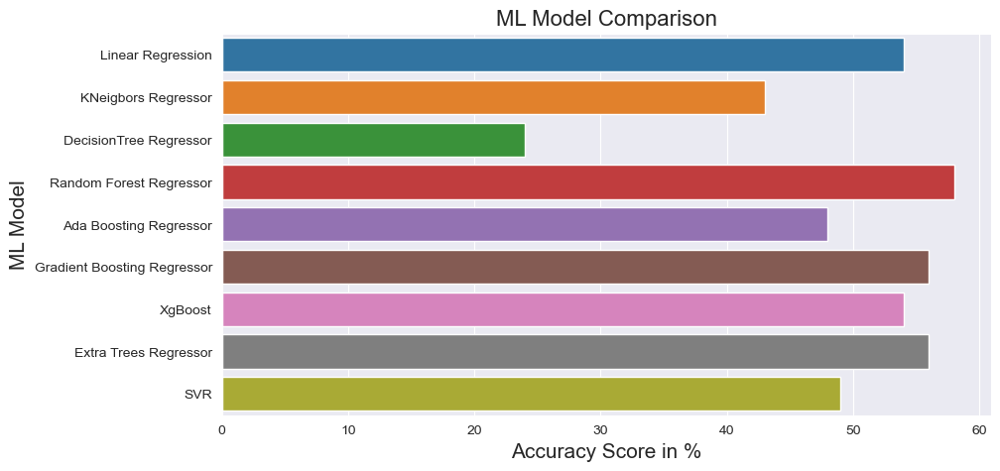

In [229]:
#Now focusing on the Accuracy Score....
plt.figure(figsize = (10, 5))
sns.set_style('darkgrid')

sns.barplot(x = 'Accuracy_Score', y = 'ML_Model', data = models)

plt.xlabel('Accuracy Score in %', fontsize = 15)
plt.ylabel('ML Model', fontsize = 15)

plt.title('ML Model Comparison', fontsize = 16)

plt.show()

Now from the above diagram it seems that Random Forest Regressor(58%) has the highest Accuracy, However, our aim is to find the BEST MODEL, so lets consider the difference Between Accuracy_Score and Cross_Validation_Score....

# Step 6.1 - Comparing Differences between Accuracy and Cross_Validation Scores...

Lets sort by the column; Accuracy_VS_CVScore to have a good view of the differential between Accuracy_Score and CVScore

In [230]:
#Sorting....
models.sort_values(by = 'Accuracy_VS_CVScore', ascending = True)

,ML_Model,Accuracy_Score,Cross_Validation_Score,Accuracy_VS_CVScore,MAE,MSE,RMSE
0,Linear Regression,54.0,49.0,0.049588,1.425814,9.618824,3.101423
7,Extra Trees Regressor,56.0,50.0,0.056810,1.219424,9.347013,3.057288
5,Gradient Boosting Regressor,56.0,50.0,0.059552,1.298199,9.541222,3.088887
3,Random Forest Regressor,58.0,50.0,0.083441,1.212354,8.850314,2.974948
4,Ada Boosting Regressor,48.0,40.0,0.083860,1.499448,12.116653,3.480898
6,XgBoost,54.0,41.0,0.127163,1.286913,9.758914,3.123926
2,DecisionTree Regressor,24.0,-2.0,0.266960,1.565063,17.618396,4.197427
1,KNeigbors Regressor,43.0,12.0,0.304858,1.418371,12.268619,3.502659
8,SVR,49.0,-12.0,0.601214,1.169272,10.904906,3.302258


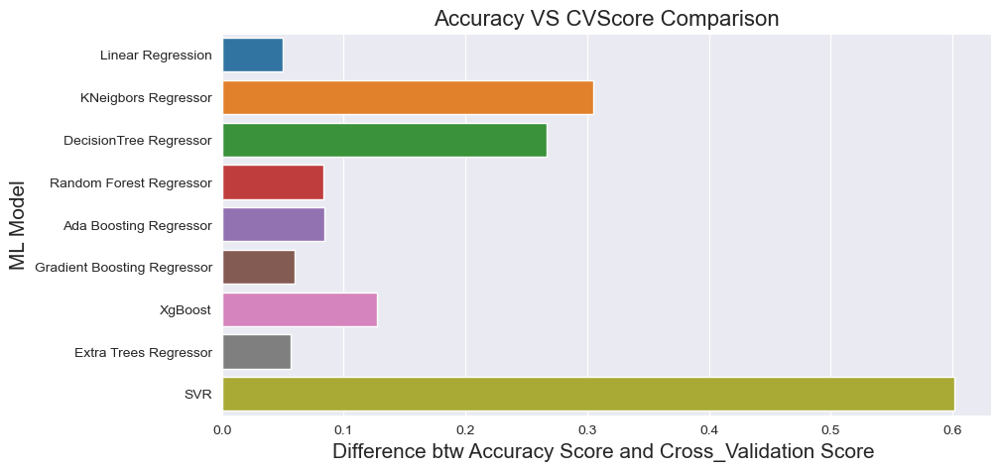

In [231]:
#A more clearer visualization.....
plt.figure(figsize = (10, 5))
sns.set_style('darkgrid')

sns.barplot(x = 'Accuracy_VS_CVScore', y = 'ML_Model', data = models)

plt.xlabel('Difference btw Accuracy Score and Cross_Validation Score ', fontsize = 15)
plt.ylabel('ML Model', fontsize = 15)

plt.title('Accuracy VS CVScore Comparison', fontsize = 16)

plt.show()

From the above we can see the Model with least difference is STILL ExtraTrees Regressor!

# Step 6.2 - Conclusion on Best Choice of Model

From the above we can see:
 - The Model with least difference(0.056) between Accuracy Score(r2 score) and Cross Validation Score is EXTRATREES REGRESSOR!
 
 - It has the lowest Root Mean Square Error(RMSE): 0.4

# Hence Optimum Machine Model Chosen = EXTRATREES REGRESSION MODEL!

# Step 7 - HYPERPARAMETER TUNNING
 - Lets prepare list of parameters with options

In [236]:
ex=ExtraTreesRegressor()

In [237]:
param_grid = {'n_estimators': [10,50,100],'criterion': ['mse', 'mae'],'max_depth': [2,8,16,32],'max_features': ['auto','sqrt','log2'],'bootstrap': [True, False],'warm_start': [True, False]}

In [239]:
#Gridsearch
gridsearch = GridSearchCV(ex, param_grid, cv=3, scoring='accuracy')
gridsearch.fit(x_train, y_train)

GridSearchCV(cv=3, estimator=ExtraTreesRegressor(),
             param_grid={'bootstrap': [True, False],
                         'criterion': ['mse', 'mae'],
                         'max_depth': [2, 8, 16, 32, 50],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [10, 50, 100],
                         'warm_start': [True, False]},
             scoring='accuracy')

In [240]:
#Get best hyperparameters
gridsearch.best_params_ 

{'bootstrap': True,
 'criterion': 'mse',
 'max_depth': 2,
 'max_features': 'auto',
 'n_estimators': 10,
 'warm_start': True}

Now lets use the best parameters.....

In [241]:
#Instantiating using the best parameters...
ex=ExtraTreesRegressor(criterion='mse',max_depth=2,max_features='auto',n_estimators=10,warm_start=True)

In [242]:
#Instantiating using the best parameters...
ex=ExtraTreesRegressor(criterion='squared_error',max_depth=500,max_features='auto',n_estimators=500,min_samples_leaf=1,random_state=174,verbose=5,max_samples=100,ccp_alpha=0.0,bootstrap=True)

In [243]:
#fitting the model...
ex.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 500
building tree 2 of 500
building tree 3 of 500
building tree 4 of 500
building tree 5 of 500
building tree 6 of 500
building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500
building tree 16 of 500
building tree 17 of 500
building tree 18 of 500
building tree 19 of 500
building tree 20 of 500
building tree 21 of 500
building tree 22 of 500
building tree 23 of 500
building tree 24 of 500
building tree 25 of 500
building tree 26 of 500
building tree 27 of 500
building tree 28 of 500
building tree 29 of 500
building tree 30 of 500
building tree 31 of 500
building tree 32 of 500
building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500
building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
b

building tree 336 of 500
building tree 337 of 500
building tree 338 of 500
building tree 339 of 500
building tree 340 of 500
building tree 341 of 500
building tree 342 of 500
building tree 343 of 500
building tree 344 of 500
building tree 345 of 500
building tree 346 of 500
building tree 347 of 500
building tree 348 of 500
building tree 349 of 500
building tree 350 of 500
building tree 351 of 500
building tree 352 of 500
building tree 353 of 500
building tree 354 of 500
building tree 355 of 500
building tree 356 of 500
building tree 357 of 500
building tree 358 of 500
building tree 359 of 500
building tree 360 of 500
building tree 361 of 500
building tree 362 of 500
building tree 363 of 500
building tree 364 of 500
building tree 365 of 500
building tree 366 of 500
building tree 367 of 500
building tree 368 of 500
building tree 369 of 500
building tree 370 of 500
building tree 371 of 500
building tree 372 of 500
building tree 373 of 500
building tree 374 of 500
building tree 375 of 500


[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.8s finished


ExtraTreesRegressor(bootstrap=True, max_depth=500, max_features='auto',
                    max_samples=100, n_estimators=500, random_state=174,
                    verbose=5)

In [244]:
pred_test=ex.predict(x_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.0s finished


In [245]:
metrics.r2_score(y_test,pred_test)

0.5182439146683293

From the above we can see:
- Final Accuracy is 98% and RMSE is 0.007
- That the ExtraTreeRegressor has a low RMSE

HENCE WE CAN CONCLUDE OUR MODEL IS GOOD!!

# Lets predict whether it will rain tomorrow or not
# This is a categorical problem

# Imbalancing of Target Variable

0.0    5190
1.0    1572
Name: RainTomorrow, dtype: int64


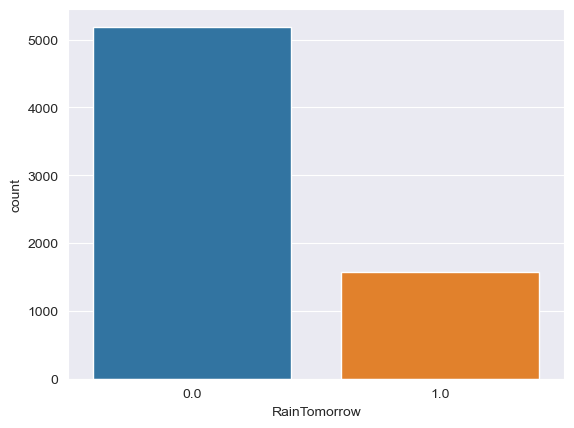

In [248]:
#Lets visualize data distribution amongst the new Binary classes
ax=sns.countplot(x='RainTomorrow',data=df)
print(df['RainTomorrow'].value_counts())

In [249]:
#seperation
X=df_new[features]
Y=df_new['RainTomorrow']

In [253]:
X.drop('RainTomorrow',axis=1,inplace=True)

In [251]:
Y

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
6404    0.0
6405    0.0
6406    0.0
6407    0.0
6408    0.0
Name: RainTomorrow, Length: 6409, dtype: float64

In [254]:
X

,RainToday,Location,MinTemp,WindDir3pm,Pressure9am,WindGustSpeed,Sunshine,Humidity9am,Temp3pm
0,0.0,1.0,13.4,14.0,1007.7,44.000000,-0.155572,71.0,21.8
1,0.0,1.0,7.4,15.0,1010.6,44.000000,-0.155572,44.0,24.3
2,0.0,1.0,12.9,15.0,1007.6,46.000000,-0.155572,38.0,23.2
3,0.0,1.0,9.2,0.0,1017.6,24.000000,-0.155572,45.0,26.5
4,0.0,1.0,17.5,7.0,1010.8,41.000000,-0.155572,82.0,29.7
...,...,...,...,...,...,...,...,...,...
6404,0.0,9.0,2.8,1.0,1024.6,31.000000,-0.155572,51.0,22.4
6405,0.0,9.0,3.6,3.0,1023.5,22.000000,-0.155572,56.0,24.5
6406,0.0,9.0,5.4,14.0,1021.0,37.000000,-0.155572,53.0,26.1
6407,0.0,9.0,7.8,3.0,1019.4,28.000000,-0.155572,51.0,26.0


From the above graph we can see:

- the dependent variable has two classes of raintomorrow with the majority being Class 0 and minority Class 1
- there is a clear case of imbalanced data and this will be resolved during futher preprocessing using sampling techniques

# Step 5 - MODEL BUILDING

# Step 5.1 - Logistic Regression

# Best Random State and Balancing Target Data(Oversampling)

In [261]:
#Using LogisticRegression to get the best Random state and apply SMOTE Oversampling technique
lr=LogisticRegression()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=i,test_size=0.20)
    ove_smp=SMOTE(0.75)#increasing data by 75% using SMOTE Oversampling technique
    x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
    print("The number of classes before fit{}".format(Counter(y_train)))
    print("The number of classes before fit{}".format(Counter(y_train_ns)))
    lr.fit(x_train_ns,y_train_ns)
    pred_train=lr.predict(x_train_ns)
    pred_test=lr.predict(x_test)
    print("At random state:-",i,"Testing Accuracy and Training Accuracy are:- ",round(accuracy_score(y_test,pred_test)*100,1), "and", round(accuracy_score(y_train_ns,pred_train)*100,1), "respectively")

The number of classes before fitCounter({0.0: 3964, 1.0: 1163})
The number of classes before fitCounter({0.0: 3964, 1.0: 2973})
At random state:- 0 Testing Accuracy and Training Accuracy are:-  76.1 and 74.8 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 1 Testing Accuracy and Training Accuracy are:-  76.1 and 75.4 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 2 Testing Accuracy and Training Accuracy are:-  76.5 and 74.8 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 3 Testing Accuracy and Training Accuracy are:-  77.6 and 75.4 respectively
The number of classes before fitCounter({0.0: 3974, 1.0: 1153})
The number of classes before fitCounter({0.0: 3974, 

At random state:- 37 Testing Accuracy and Training Accuracy are:-  76.3 and 75.5 respectively
The number of classes before fitCounter({0.0: 3963, 1.0: 1164})
The number of classes before fitCounter({0.0: 3963, 1.0: 2972})
At random state:- 38 Testing Accuracy and Training Accuracy are:-  75.7 and 75.4 respectively
The number of classes before fitCounter({0.0: 3966, 1.0: 1161})
The number of classes before fitCounter({0.0: 3966, 1.0: 2974})
At random state:- 39 Testing Accuracy and Training Accuracy are:-  78.2 and 74.5 respectively
The number of classes before fitCounter({0.0: 3974, 1.0: 1153})
The number of classes before fitCounter({0.0: 3974, 1.0: 2980})
At random state:- 40 Testing Accuracy and Training Accuracy are:-  78.3 and 73.9 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 41 Testing Accuracy and Training Accuracy are:-  78.9 and 74.5 respectively
The number of clas

At random state:- 75 Testing Accuracy and Training Accuracy are:-  77.2 and 74.8 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 76 Testing Accuracy and Training Accuracy are:-  78.1 and 74.8 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 77 Testing Accuracy and Training Accuracy are:-  77.1 and 75.0 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 78 Testing Accuracy and Training Accuracy are:-  75.4 and 75.6 respectively
The number of classes before fitCounter({0.0: 4004, 1.0: 1123})
The number of classes before fitCounter({0.0: 4004, 1.0: 3003})
At random state:- 79 Testing Accuracy and Training Accuracy are:-  77.4 and 74.9 respectively
The number of clas

At random state:- 113 Testing Accuracy and Training Accuracy are:-  77.5 and 74.6 respectively
The number of classes before fitCounter({0.0: 3991, 1.0: 1136})
The number of classes before fitCounter({0.0: 3991, 1.0: 2993})
At random state:- 114 Testing Accuracy and Training Accuracy are:-  78.0 and 74.8 respectively
The number of classes before fitCounter({0.0: 3996, 1.0: 1131})
The number of classes before fitCounter({0.0: 3996, 1.0: 2997})
At random state:- 115 Testing Accuracy and Training Accuracy are:-  77.1 and 74.6 respectively
The number of classes before fitCounter({0.0: 3978, 1.0: 1149})
The number of classes before fitCounter({0.0: 3978, 1.0: 2983})
At random state:- 116 Testing Accuracy and Training Accuracy are:-  76.5 and 75.3 respectively
The number of classes before fitCounter({0.0: 3991, 1.0: 1136})
The number of classes before fitCounter({0.0: 3991, 1.0: 2993})
At random state:- 117 Testing Accuracy and Training Accuracy are:-  77.3 and 74.1 respectively
The number of

The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 152 Testing Accuracy and Training Accuracy are:-  74.4 and 75.2 respectively
The number of classes before fitCounter({0.0: 3997, 1.0: 1130})
The number of classes before fitCounter({0.0: 3997, 1.0: 2997})
At random state:- 153 Testing Accuracy and Training Accuracy are:-  76.4 and 75.0 respectively
The number of classes before fitCounter({0.0: 4002, 1.0: 1125})
The number of classes before fitCounter({0.0: 4002, 1.0: 3001})
At random state:- 154 Testing Accuracy and Training Accuracy are:-  73.9 and 75.5 respectively
The number of classes before fitCounter({0.0: 3976, 1.0: 1151})
The number of classes before fitCounter({0.0: 3976, 1.0: 2982})
At random state:- 155 Testing Accuracy and Training Accuracy are:-  77.0 and 75.0 respectively
The number of classes before fitCounter({0.0: 3973, 1.0: 1154})
The number of classes before fitCounter({0.0

At random state:- 190 Testing Accuracy and Training Accuracy are:-  75.8 and 74.7 respectively
The number of classes before fitCounter({0.0: 3982, 1.0: 1145})
The number of classes before fitCounter({0.0: 3982, 1.0: 2986})
At random state:- 191 Testing Accuracy and Training Accuracy are:-  75.5 and 76.0 respectively
The number of classes before fitCounter({0.0: 3967, 1.0: 1160})
The number of classes before fitCounter({0.0: 3967, 1.0: 2975})
At random state:- 192 Testing Accuracy and Training Accuracy are:-  78.1 and 74.2 respectively
The number of classes before fitCounter({0.0: 3953, 1.0: 1174})
The number of classes before fitCounter({0.0: 3953, 1.0: 2964})
At random state:- 193 Testing Accuracy and Training Accuracy are:-  76.5 and 74.9 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 194 Testing Accuracy and Training Accuracy are:-  75.4 and 75.4 respectively
The number of

# The best accuracy is 80.40% at random state 197

# We have found best_random state value as 197. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [266]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=197,test_size=0.20)

In [267]:
x_train.shape

(5127, 9)

In [268]:
x_test.shape

(1282, 9)

In [269]:
y_train.shape

(5127,)

In [270]:
y_test.shape

(1282,)

# Over Sampling using SMOTE(Synthetic Minority Oversampling Technique)
This technique can be used when you have small data set.This uses the euclidean distance method and find the closest data points to the minority class and create new minority data points.

In [271]:
#applying the oversampling technique
ove_smp=SMOTE(0.75)#increasing data by 75%
x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
print("The number of classes before fit{}".format(Counter(y_train)))
print("The number of classes after fit{}".format(Counter(y_train_ns)))

The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes after fitCounter({0.0: 3983, 1.0: 2987})


From the above you can see that the 'Binary Class = 1" of the training Target variable has been upgraded by 75% i.e from 1144 to 2987.

So we can now go ahead to train our model using the upgraded training data!

# Training Model and Metrics Measurement

In [272]:
lr=LogisticRegression()
lr.fit(x_train_ns,y_train_ns)
pred_test=lr.predict(x_test)
pred_train=lr.predict(x_train_ns)
Test_Accuracy_lr= (accuracy_score(y_test,pred_test))
Train_Accuracy_lr= (accuracy_score(y_train_ns,pred_train))
print("Test_Accuracy ",round(accuracy_score(y_test,pred_test)*100,2))#testing score
print("Confusion Matrix ", confusion_matrix(y_test,pred_test))
print("Classification Report ", classification_report(y_test,pred_test))

Test_Accuracy  79.64
Confusion Matrix  [[820 176]
 [ 85 201]]
Classification Report                precision    recall  f1-score   support

         0.0       0.91      0.82      0.86       996
         1.0       0.53      0.70      0.61       286

    accuracy                           0.80      1282
   macro avg       0.72      0.76      0.73      1282
weighted avg       0.82      0.80      0.81      1282



LogisticRegression is producing good accuracy 79.64%. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [276]:
#Validation accuracy
vac=cross_val_score(lr,X,Y,cv=5)
CV_Score_lr=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_lr)

[0.83697348 0.81513261 0.74024961 0.82683307 0.83450429]
Cross Validation Score is  0.8107386122142778


# Difference between Accuracy Score and Cross Validation Score

In [277]:
Test_Accuracy_lr

0.7964118564742589

In [278]:
CV_Score_lr

0.8107386122142778

In [279]:
lr_Acc_vs_CV_Score=np.abs(Test_Accuracy_lr-CV_Score_lr)
print("Difference between Accuracy and Cross Validation Score = ",lr_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.014326755740018848


From the above you can see that difference between Accuracy and Cross Validation score is neglible(0.014) meaning that our model is very good and not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see the Accuracy of other Models!

# Step 5.2 - DecisionTree Classifier

# Best Random State and Balancing Target Data(Oversampling)

In [280]:
#Using Decision tree Classifier to get the best Random state and apply SMOTE Oversampling technique
dt=DecisionTreeClassifier()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=i,test_size=0.20)
    ove_smp=SMOTE(0.75)#increasing data by 75% using SMOTE Oversampling technique
    x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
    print("The number of classes before fit{}".format(Counter(y_train)))
    print("The number of classes before fit{}".format(Counter(y_train_ns)))
    dt.fit(x_train_ns,y_train_ns)
    pred_train=dt.predict(x_train_ns)
    pred_test=dt.predict(x_test)
    print("At random state:-",i,"Testing Accuracy and Training Accuracy are:- ",round(accuracy_score(y_test,pred_test)*100,1), "and", round(accuracy_score(y_train_ns,pred_train)*100,1), "respectively")

The number of classes before fitCounter({0.0: 3964, 1.0: 1163})
The number of classes before fitCounter({0.0: 3964, 1.0: 2973})
At random state:- 0 Testing Accuracy and Training Accuracy are:-  74.5 and 99.8 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 1 Testing Accuracy and Training Accuracy are:-  75.8 and 99.9 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 2 Testing Accuracy and Training Accuracy are:-  76.1 and 99.9 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 3 Testing Accuracy and Training Accuracy are:-  75.0 and 99.9 respectively
The number of classes before fitCounter({0.0: 3974, 1.0: 1153})
The number of classes before fitCounter({0.0: 3974, 

At random state:- 38 Testing Accuracy and Training Accuracy are:-  75.8 and 99.8 respectively
The number of classes before fitCounter({0.0: 3966, 1.0: 1161})
The number of classes before fitCounter({0.0: 3966, 1.0: 2974})
At random state:- 39 Testing Accuracy and Training Accuracy are:-  77.3 and 99.9 respectively
The number of classes before fitCounter({0.0: 3974, 1.0: 1153})
The number of classes before fitCounter({0.0: 3974, 1.0: 2980})
At random state:- 40 Testing Accuracy and Training Accuracy are:-  74.7 and 99.9 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 41 Testing Accuracy and Training Accuracy are:-  75.1 and 99.8 respectively
The number of classes before fitCounter({0.0: 3970, 1.0: 1157})
The number of classes before fitCounter({0.0: 3970, 1.0: 2977})
At random state:- 42 Testing Accuracy and Training Accuracy are:-  77.0 and 99.8 respectively
The number of clas

At random state:- 75 Testing Accuracy and Training Accuracy are:-  74.0 and 99.8 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 76 Testing Accuracy and Training Accuracy are:-  74.3 and 99.9 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 77 Testing Accuracy and Training Accuracy are:-  73.1 and 99.9 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 78 Testing Accuracy and Training Accuracy are:-  74.6 and 99.9 respectively
The number of classes before fitCounter({0.0: 4004, 1.0: 1123})
The number of classes before fitCounter({0.0: 4004, 1.0: 3003})
At random state:- 79 Testing Accuracy and Training Accuracy are:-  75.1 and 99.8 respectively
The number of clas

At random state:- 112 Testing Accuracy and Training Accuracy are:-  76.1 and 99.8 respectively
The number of classes before fitCounter({0.0: 3989, 1.0: 1138})
The number of classes before fitCounter({0.0: 3989, 1.0: 2991})
At random state:- 113 Testing Accuracy and Training Accuracy are:-  76.4 and 99.9 respectively
The number of classes before fitCounter({0.0: 3991, 1.0: 1136})
The number of classes before fitCounter({0.0: 3991, 1.0: 2993})
At random state:- 114 Testing Accuracy and Training Accuracy are:-  73.4 and 99.8 respectively
The number of classes before fitCounter({0.0: 3996, 1.0: 1131})
The number of classes before fitCounter({0.0: 3996, 1.0: 2997})
At random state:- 115 Testing Accuracy and Training Accuracy are:-  74.9 and 99.8 respectively
The number of classes before fitCounter({0.0: 3978, 1.0: 1149})
The number of classes before fitCounter({0.0: 3978, 1.0: 2983})
At random state:- 116 Testing Accuracy and Training Accuracy are:-  75.4 and 99.8 respectively
The number of

At random state:- 150 Testing Accuracy and Training Accuracy are:-  73.8 and 99.8 respectively
The number of classes before fitCounter({0.0: 3994, 1.0: 1133})
The number of classes before fitCounter({0.0: 3994, 1.0: 2995})
At random state:- 151 Testing Accuracy and Training Accuracy are:-  74.8 and 99.9 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 152 Testing Accuracy and Training Accuracy are:-  75.2 and 99.9 respectively
The number of classes before fitCounter({0.0: 3997, 1.0: 1130})
The number of classes before fitCounter({0.0: 3997, 1.0: 2997})
At random state:- 153 Testing Accuracy and Training Accuracy are:-  74.8 and 99.8 respectively
The number of classes before fitCounter({0.0: 4002, 1.0: 1125})
The number of classes before fitCounter({0.0: 4002, 1.0: 3001})
At random state:- 154 Testing Accuracy and Training Accuracy are:-  73.5 and 99.9 respectively
The number of

At random state:- 189 Testing Accuracy and Training Accuracy are:-  73.8 and 99.9 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 190 Testing Accuracy and Training Accuracy are:-  75.6 and 99.9 respectively
The number of classes before fitCounter({0.0: 3982, 1.0: 1145})
The number of classes before fitCounter({0.0: 3982, 1.0: 2986})
At random state:- 191 Testing Accuracy and Training Accuracy are:-  73.6 and 99.8 respectively
The number of classes before fitCounter({0.0: 3967, 1.0: 1160})
The number of classes before fitCounter({0.0: 3967, 1.0: 2975})
At random state:- 192 Testing Accuracy and Training Accuracy are:-  74.6 and 99.9 respectively
The number of classes before fitCounter({0.0: 3953, 1.0: 1174})
The number of classes before fitCounter({0.0: 3953, 1.0: 2964})
At random state:- 193 Testing Accuracy and Training Accuracy are:-  75.5 and 99.8 respectively
The number of

The best accuracy is 84.2% at random state 194

We have found best random state value as 194. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [281]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=194,test_size=0.20)

In [282]:
x_train.shape

(5127, 9)

In [283]:
x_test.shape

(1282, 9)

In [284]:
y_train.shape

(5127,)

In [285]:
y_test.shape

(1282,)

# Over Sampling using SMOTE(Synthetic Minority Oversampling Technique)
This technique can be used when you have small data set.This uses the euclidean distance method and find the closest data points to the minority class and create new minority data points. 

In [286]:
#applying the oversampling technique
ove_smp=SMOTE(0.75)#increasing data by 75%
x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
print("The number of classes before fit{}".format(Counter(y_train)))
print("The number of classes after fit{}".format(Counter(y_train_ns)))

The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes after fitCounter({0.0: 3977, 1.0: 2982})


From the above you can see that the 'Binary Class = 1" of the training Target variable has been upgraded by 75% i.e from 1150 to 2982.

So we can now go ahead to train our model using the upgraded training data!

# Training Model and Metrics Measurement

In [287]:
dt=LogisticRegression()
dt.fit(x_train_ns,y_train_ns)
pred_test=dt.predict(x_test)
pred_train=dt.predict(x_train_ns)
Test_Accuracy_dt= (accuracy_score(y_test,pred_test))
Train_Accuracy_dt= (accuracy_score(y_train_ns,pred_train))
print("Test_Accuracy ",round(accuracy_score(y_test,pred_test)*100,2))#testing score
print("Confusion Matrix ", confusion_matrix(y_test,pred_test))
print("Classification Report ", classification_report(y_test,pred_test))

Test_Accuracy  74.49
Confusion Matrix  [[784 218]
 [109 171]]
Classification Report                precision    recall  f1-score   support

         0.0       0.88      0.78      0.83      1002
         1.0       0.44      0.61      0.51       280

    accuracy                           0.74      1282
   macro avg       0.66      0.70      0.67      1282
weighted avg       0.78      0.74      0.76      1282



Decision Tree Model is producing good accuracy - 74.49%!. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [289]:
#Validation accuracy
vac=cross_val_score(dt,X,Y,cv=5)
CV_Score_dt=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_dt)

[0.83697348 0.81513261 0.74024961 0.82683307 0.83450429]
Cross Validation Score is  0.8107386122142778


# Difference between Accuracy Score and Cross Validation Score

In [290]:
Test_Accuracy_dt

0.7449297971918877

In [291]:
CV_Score_dt

0.8107386122142778

In [292]:
dt_Acc_vs_CV_Score=np.abs(Test_Accuracy_dt-CV_Score_dt)
print("Difference between Accuracy and Cross Validation Score = ",dt_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.06580881502239011


From the above you can see that difference between Accuracy and Cross Validation score is low(0.0658) meaning that our model is very good and not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets try ensembling Techniques!

# Step 5.3 - RandomForest Classifier

# Best Random State and Balancing Data(Oversampling)

In [294]:
#Using RandomForest Classifier to get the best Random state and apply SMOTE Oversampling technique
rf=RandomForestClassifier()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=i,test_size=0.20)
    ove_smp=SMOTE(0.75)#increasing data by 75% using SMOTE Oversampling technique
    x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
    print("The number of classes before fit{}".format(Counter(y_train)))
    print("The number of classes before fit{}".format(Counter(y_train_ns)))
    rf.fit(x_train_ns,y_train_ns)
    pred_train=rf.predict(x_train_ns)
    pred_test=rf.predict(x_test)
    print("At random state:-",i,"Testing Accuracy and Training Accuracy are:- ",round(accuracy_score(y_test,pred_test)*100,1), "and", round(accuracy_score(y_train_ns,pred_train)*100,1), "respectively")

The number of classes before fitCounter({0.0: 3964, 1.0: 1163})
The number of classes before fitCounter({0.0: 3964, 1.0: 2973})
At random state:- 0 Testing Accuracy and Training Accuracy are:-  80.9 and 99.8 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 1 Testing Accuracy and Training Accuracy are:-  79.3 and 99.8 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 2 Testing Accuracy and Training Accuracy are:-  82.2 and 99.8 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 3 Testing Accuracy and Training Accuracy are:-  81.1 and 99.9 respectively
The number of classes before fitCounter({0.0: 3974, 1.0: 1153})
The number of classes before fitCounter({0.0: 3974, 

At random state:- 37 Testing Accuracy and Training Accuracy are:-  81.1 and 99.9 respectively
The number of classes before fitCounter({0.0: 3963, 1.0: 1164})
The number of classes before fitCounter({0.0: 3963, 1.0: 2972})
At random state:- 38 Testing Accuracy and Training Accuracy are:-  81.4 and 99.8 respectively
The number of classes before fitCounter({0.0: 3966, 1.0: 1161})
The number of classes before fitCounter({0.0: 3966, 1.0: 2974})
At random state:- 39 Testing Accuracy and Training Accuracy are:-  81.6 and 99.9 respectively
The number of classes before fitCounter({0.0: 3974, 1.0: 1153})
The number of classes before fitCounter({0.0: 3974, 1.0: 2980})
At random state:- 40 Testing Accuracy and Training Accuracy are:-  82.2 and 99.9 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 41 Testing Accuracy and Training Accuracy are:-  82.8 and 99.8 respectively
The number of clas

At random state:- 74 Testing Accuracy and Training Accuracy are:-  81.0 and 99.9 respectively
The number of classes before fitCounter({0.0: 3970, 1.0: 1157})
The number of classes before fitCounter({0.0: 3970, 1.0: 2977})
At random state:- 75 Testing Accuracy and Training Accuracy are:-  80.4 and 99.9 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 76 Testing Accuracy and Training Accuracy are:-  81.7 and 99.9 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 77 Testing Accuracy and Training Accuracy are:-  80.7 and 99.8 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 78 Testing Accuracy and Training Accuracy are:-  79.8 and 99.8 respectively
The number of clas

At random state:- 111 Testing Accuracy and Training Accuracy are:-  80.3 and 99.9 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 112 Testing Accuracy and Training Accuracy are:-  81.7 and 99.8 respectively
The number of classes before fitCounter({0.0: 3989, 1.0: 1138})
The number of classes before fitCounter({0.0: 3989, 1.0: 2991})
At random state:- 113 Testing Accuracy and Training Accuracy are:-  82.4 and 99.9 respectively
The number of classes before fitCounter({0.0: 3991, 1.0: 1136})
The number of classes before fitCounter({0.0: 3991, 1.0: 2993})
At random state:- 114 Testing Accuracy and Training Accuracy are:-  82.1 and 99.8 respectively
The number of classes before fitCounter({0.0: 3996, 1.0: 1131})
The number of classes before fitCounter({0.0: 3996, 1.0: 2997})
At random state:- 115 Testing Accuracy and Training Accuracy are:-  81.5 and 99.8 respectively
The number of

At random state:- 148 Testing Accuracy and Training Accuracy are:-  77.7 and 99.8 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 149 Testing Accuracy and Training Accuracy are:-  81.3 and 99.9 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 150 Testing Accuracy and Training Accuracy are:-  82.0 and 99.8 respectively
The number of classes before fitCounter({0.0: 3994, 1.0: 1133})
The number of classes before fitCounter({0.0: 3994, 1.0: 2995})
At random state:- 151 Testing Accuracy and Training Accuracy are:-  81.5 and 99.8 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 152 Testing Accuracy and Training Accuracy are:-  81.4 and 99.9 respectively
The number of

At random state:- 185 Testing Accuracy and Training Accuracy are:-  82.4 and 99.8 respectively
The number of classes before fitCounter({0.0: 3966, 1.0: 1161})
The number of classes before fitCounter({0.0: 3966, 1.0: 2974})
At random state:- 186 Testing Accuracy and Training Accuracy are:-  83.1 and 99.8 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 187 Testing Accuracy and Training Accuracy are:-  82.3 and 99.9 respectively
The number of classes before fitCounter({0.0: 3998, 1.0: 1129})
The number of classes before fitCounter({0.0: 3998, 1.0: 2998})
At random state:- 188 Testing Accuracy and Training Accuracy are:-  81.2 and 99.8 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 189 Testing Accuracy and Training Accuracy are:-  81.5 and 99.8 respectively
The number of

The best accuracy is 83.90% at random state 54

We have found best_random state value as 54. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [296]:
#using the random state of 54
x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=54,test_size=0.20)

# Over Sampling using SMOTE(Synthetic Minority Oversampling Technique)
This technique can be used when you have small data set.This uses the euclidean distance method and find the closest data points to the minority class and create new minority data points.

In [297]:
#applying the oversampling technique
ove_smp=SMOTE(0.75)#increasing data by 75%
x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
print("The number of classes before fit{}".format(Counter(y_train)))
print("The number of classes after fit{}".format(Counter(y_train_ns)))

The number of classes before fitCounter({0.0: 3975, 1.0: 1152})
The number of classes after fitCounter({0.0: 3975, 1.0: 2981})


From the above you can see that the 'Binary Class = 1" of the training Target variable has been upgraded by 75% i.e from 1152 to 2981.

So we can now go ahead to train our model using the upgraded training data!

# Training Model and Metrics Measurement

In [298]:
rf=RandomForestClassifier()
rf.fit(x_train_ns,y_train_ns)
pred_test=rf.predict(x_test)
pred_train=rf.predict(x_train_ns)
Test_Accuracy_rf= (accuracy_score(y_test,pred_test))
Train_Accuracy_rf= (accuracy_score(y_train_ns,pred_train))
print("Test_Accuracy ",round(accuracy_score(y_test,pred_test)*100,2))#testing score
print("Confusion Matrix ", confusion_matrix(y_test,pred_test))
print("Classification Report ", classification_report(y_test,pred_test))

Test_Accuracy  83.15
Confusion Matrix  [[918  86]
 [130 148]]
Classification Report                precision    recall  f1-score   support

         0.0       0.88      0.91      0.89      1004
         1.0       0.63      0.53      0.58       278

    accuracy                           0.83      1282
   macro avg       0.75      0.72      0.74      1282
weighted avg       0.82      0.83      0.83      1282



RandomForest Classifier is producing good accuracy = 83.15%!. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [299]:
#Validation accuracy
vac=cross_val_score(rf,X,Y,cv=5)
CV_Score_rf=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_rf)

[0.81591264 0.73868955 0.76833073 0.7074883  0.81654957]
Cross Validation Score is  0.769394157499321


# Difference between Accuracy Score and Cross Validation Score

In [300]:
Test_Accuracy_rf

0.8315132605304212

In [301]:
CV_Score_rf

0.769394157499321

In [302]:
rf_Acc_vs_CV_Score=np.abs(Test_Accuracy_rf-CV_Score_rf)
print("Difference between Accuracy and Cross Validation Score = ",rf_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.06211910303110013


From the above you can see that difference between Accuracy and Cross Validation score is very low(0.06211 ) meaning that our model is very good and not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets build further ensemble Models!

# Step 5.4 - AdaBoost Classifier

# Best Random State and Balancing Data(Oversampling)

In [303]:
#Using AdaBoost Classifier to get the best Random state and apply SMOTE Oversampling technique
ada=AdaBoostClassifier()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=i,test_size=0.20)
    ove_smp=SMOTE(0.75)#increasing data by 75% using SMOTE Oversampling technique
    x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
    print("The number of classes before fit{}".format(Counter(y_train)))
    print("The number of classes before fit{}".format(Counter(y_train_ns)))
    ada.fit(x_train_ns,y_train_ns)
    pred_train=ada.predict(x_train_ns)
    pred_test=ada.predict(x_test)
    print("At random state:-",i,"Testing Accuracy and Training Accuracy are:- ",round(accuracy_score(y_test,pred_test)*100,1), "and", round(accuracy_score(y_train_ns,pred_train)*100,1), "respectively")

The number of classes before fitCounter({0.0: 3964, 1.0: 1163})
The number of classes before fitCounter({0.0: 3964, 1.0: 2973})
At random state:- 0 Testing Accuracy and Training Accuracy are:-  78.2 and 80.8 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 1 Testing Accuracy and Training Accuracy are:-  76.6 and 80.8 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 2 Testing Accuracy and Training Accuracy are:-  80.7 and 81.0 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 3 Testing Accuracy and Training Accuracy are:-  77.5 and 80.8 respectively
The number of classes before fitCounter({0.0: 3974, 1.0: 1153})
The number of classes before fitCounter({0.0: 3974, 

At random state:- 37 Testing Accuracy and Training Accuracy are:-  78.5 and 80.8 respectively
The number of classes before fitCounter({0.0: 3963, 1.0: 1164})
The number of classes before fitCounter({0.0: 3963, 1.0: 2972})
At random state:- 38 Testing Accuracy and Training Accuracy are:-  78.8 and 80.6 respectively
The number of classes before fitCounter({0.0: 3966, 1.0: 1161})
The number of classes before fitCounter({0.0: 3966, 1.0: 2974})
At random state:- 39 Testing Accuracy and Training Accuracy are:-  78.6 and 81.0 respectively
The number of classes before fitCounter({0.0: 3974, 1.0: 1153})
The number of classes before fitCounter({0.0: 3974, 1.0: 2980})
At random state:- 40 Testing Accuracy and Training Accuracy are:-  80.1 and 80.3 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 41 Testing Accuracy and Training Accuracy are:-  78.6 and 80.1 respectively
The number of clas

At random state:- 74 Testing Accuracy and Training Accuracy are:-  78.9 and 81.1 respectively
The number of classes before fitCounter({0.0: 3970, 1.0: 1157})
The number of classes before fitCounter({0.0: 3970, 1.0: 2977})
At random state:- 75 Testing Accuracy and Training Accuracy are:-  79.2 and 80.9 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 76 Testing Accuracy and Training Accuracy are:-  80.4 and 80.2 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 77 Testing Accuracy and Training Accuracy are:-  79.1 and 80.4 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 78 Testing Accuracy and Training Accuracy are:-  78.2 and 81.1 respectively
The number of clas

At random state:- 111 Testing Accuracy and Training Accuracy are:-  78.1 and 80.5 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 112 Testing Accuracy and Training Accuracy are:-  79.5 and 80.9 respectively
The number of classes before fitCounter({0.0: 3989, 1.0: 1138})
The number of classes before fitCounter({0.0: 3989, 1.0: 2991})
At random state:- 113 Testing Accuracy and Training Accuracy are:-  79.5 and 80.3 respectively
The number of classes before fitCounter({0.0: 3991, 1.0: 1136})
The number of classes before fitCounter({0.0: 3991, 1.0: 2993})
At random state:- 114 Testing Accuracy and Training Accuracy are:-  80.3 and 80.8 respectively
The number of classes before fitCounter({0.0: 3996, 1.0: 1131})
The number of classes before fitCounter({0.0: 3996, 1.0: 2997})
At random state:- 115 Testing Accuracy and Training Accuracy are:-  79.6 and 81.0 respectively
The number of

At random state:- 148 Testing Accuracy and Training Accuracy are:-  76.8 and 81.0 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 149 Testing Accuracy and Training Accuracy are:-  79.5 and 80.5 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 150 Testing Accuracy and Training Accuracy are:-  77.8 and 80.9 respectively
The number of classes before fitCounter({0.0: 3994, 1.0: 1133})
The number of classes before fitCounter({0.0: 3994, 1.0: 2995})
At random state:- 151 Testing Accuracy and Training Accuracy are:-  78.5 and 80.1 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 152 Testing Accuracy and Training Accuracy are:-  77.7 and 81.3 respectively
The number of

At random state:- 185 Testing Accuracy and Training Accuracy are:-  78.8 and 80.3 respectively
The number of classes before fitCounter({0.0: 3966, 1.0: 1161})
The number of classes before fitCounter({0.0: 3966, 1.0: 2974})
At random state:- 186 Testing Accuracy and Training Accuracy are:-  81.2 and 80.1 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 187 Testing Accuracy and Training Accuracy are:-  81.4 and 80.4 respectively
The number of classes before fitCounter({0.0: 3998, 1.0: 1129})
The number of classes before fitCounter({0.0: 3998, 1.0: 2998})
At random state:- 188 Testing Accuracy and Training Accuracy are:-  80.5 and 80.1 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 189 Testing Accuracy and Training Accuracy are:-  79.0 and 80.0 respectively
The number of

The best accuracy is 81.4% at random state 187

We have found best_random state value as 187. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [304]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=187,test_size=0.20)

# Over Sampling using SMOTE(Synthetic Minority Oversampling Technique)
This technique can be used when you have small data set.This uses the euclidean distance method and find the closest data points to the minority class and create new minority data points.

In [305]:
#applying the oversampling technique
ove_smp=SMOTE(0.75)#increasing data by 75%
x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
print("The number of classes before fit{}".format(Counter(y_train)))
print("The number of classes after fit{}".format(Counter(y_train_ns)))

The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes after fitCounter({0.0: 3988, 1.0: 2991})


From the above you can see that the 'Binary Class = 1" of the training Target variable has been upgraded by 75% i.e from 1139 to 2991.

So we can now go ahead to train our model using the upgraded training data!

# Training Model and Metrics Measurement

In [306]:
gb=GradientBoostingClassifier()
gb.fit(x_train_ns,y_train_ns)
pred_test=gb.predict(x_test)
pred_train=gb.predict(x_train_ns)
Test_Accuracy_gb= (accuracy_score(y_test,pred_test))
Train_Accuracy_gb= (accuracy_score(y_train_ns,pred_train))
print("Test_Accuracy ",round(accuracy_score(y_test,pred_test)*100,2))#testing score
print("Confusion Matrix ", confusion_matrix(y_test,pred_test))
print("Classification Report ", classification_report(y_test,pred_test))

Test_Accuracy  82.61
Confusion Matrix  [[891 100]
 [123 168]]
Classification Report                precision    recall  f1-score   support

         0.0       0.88      0.90      0.89       991
         1.0       0.63      0.58      0.60       291

    accuracy                           0.83      1282
   macro avg       0.75      0.74      0.74      1282
weighted avg       0.82      0.83      0.82      1282



AdaBoostClassifier is producing good accuracy = 82.61%!. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [307]:
#Validation accuracy
vac=cross_val_score(gb,X,Y,cv=5)
CV_Score_gb=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_gb)

[0.82293292 0.79641186 0.76287051 0.71216849 0.83138173]
Cross Validation Score is  0.7851531016744182


# Difference between Accuracy Score and Cross Validation Score

In [308]:
Test_Accuracy_gb

0.8260530421216848

In [309]:
CV_Score_gb

0.7851531016744182

In [310]:
gb_Acc_vs_CV_Score=np.abs(Test_Accuracy_gb-CV_Score_gb)
print("Difference between Accuracy and Cross Validation Score = ",gb_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.040899940447266636


From the above you can see that difference between Accuracy and Cross Validation score is low(0.0408) meaning that our model is very good and not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see the Accuracy of other Models!

# Step 5.6 - XGBoost Classifier

# Best Random State and Balancing Data(Oversampling)

In [314]:
#Using XGBoost Classifier to get the best Random state and apply SMOTE Oversampling technique
xgb=XGBClassifier()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=i,test_size=0.20)
    ove_smp=SMOTE(0.75)#increasing data by 75% using SMOTE Oversampling technique
    x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
    print("The number of classes before fit{}".format(Counter(y_train)))
    print("The number of classes before fit{}".format(Counter(y_train_ns)))
    xgb.fit(x_train_ns,y_train_ns)
    pred_train=xgb.predict(x_train_ns)
    pred_test=xgb.predict(x_test)
    print("At random state:-",i,"Testing Accuracy and Training Accuracy are:- ",round(accuracy_score(y_test,pred_test)*100,1), "and", round(accuracy_score(y_train_ns,pred_train)*100,1), "respectively")

The number of classes before fitCounter({0.0: 3964, 1.0: 1163})
The number of classes before fitCounter({0.0: 3964, 1.0: 2973})
At random state:- 0 Testing Accuracy and Training Accuracy are:-  82.1 and 97.4 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 1 Testing Accuracy and Training Accuracy are:-  80.4 and 97.5 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 2 Testing Accuracy and Training Accuracy are:-  83.0 and 97.4 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 3 Testing Accuracy and Training Accuracy are:-  82.2 and 97.6 respectively
The number of classes before fitCounter({0.0: 3974, 1.0: 1153})
The number of classes before fitCounter({0.0: 3974, 

At random state:- 37 Testing Accuracy and Training Accuracy are:-  80.8 and 97.2 respectively
The number of classes before fitCounter({0.0: 3963, 1.0: 1164})
The number of classes before fitCounter({0.0: 3963, 1.0: 2972})
At random state:- 38 Testing Accuracy and Training Accuracy are:-  81.4 and 98.1 respectively
The number of classes before fitCounter({0.0: 3966, 1.0: 1161})
The number of classes before fitCounter({0.0: 3966, 1.0: 2974})
At random state:- 39 Testing Accuracy and Training Accuracy are:-  82.0 and 97.4 respectively
The number of classes before fitCounter({0.0: 3974, 1.0: 1153})
The number of classes before fitCounter({0.0: 3974, 1.0: 2980})
At random state:- 40 Testing Accuracy and Training Accuracy are:-  83.3 and 97.5 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 41 Testing Accuracy and Training Accuracy are:-  82.8 and 97.1 respectively
The number of clas

At random state:- 74 Testing Accuracy and Training Accuracy are:-  80.7 and 97.7 respectively
The number of classes before fitCounter({0.0: 3970, 1.0: 1157})
The number of classes before fitCounter({0.0: 3970, 1.0: 2977})
At random state:- 75 Testing Accuracy and Training Accuracy are:-  81.7 and 97.4 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 76 Testing Accuracy and Training Accuracy are:-  83.3 and 97.8 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 77 Testing Accuracy and Training Accuracy are:-  81.4 and 97.6 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 78 Testing Accuracy and Training Accuracy are:-  81.0 and 97.6 respectively
The number of clas

At random state:- 111 Testing Accuracy and Training Accuracy are:-  80.3 and 97.7 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 112 Testing Accuracy and Training Accuracy are:-  82.1 and 97.5 respectively
The number of classes before fitCounter({0.0: 3989, 1.0: 1138})
The number of classes before fitCounter({0.0: 3989, 1.0: 2991})
At random state:- 113 Testing Accuracy and Training Accuracy are:-  82.2 and 97.9 respectively
The number of classes before fitCounter({0.0: 3991, 1.0: 1136})
The number of classes before fitCounter({0.0: 3991, 1.0: 2993})
At random state:- 114 Testing Accuracy and Training Accuracy are:-  81.7 and 97.6 respectively
The number of classes before fitCounter({0.0: 3996, 1.0: 1131})
The number of classes before fitCounter({0.0: 3996, 1.0: 2997})
At random state:- 115 Testing Accuracy and Training Accuracy are:-  82.0 and 97.6 respectively
The number of

At random state:- 148 Testing Accuracy and Training Accuracy are:-  79.0 and 97.5 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 149 Testing Accuracy and Training Accuracy are:-  81.7 and 97.4 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 150 Testing Accuracy and Training Accuracy are:-  81.8 and 97.9 respectively
The number of classes before fitCounter({0.0: 3994, 1.0: 1133})
The number of classes before fitCounter({0.0: 3994, 1.0: 2995})
At random state:- 151 Testing Accuracy and Training Accuracy are:-  82.9 and 97.5 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 152 Testing Accuracy and Training Accuracy are:-  81.7 and 97.6 respectively
The number of

At random state:- 185 Testing Accuracy and Training Accuracy are:-  81.4 and 97.1 respectively
The number of classes before fitCounter({0.0: 3966, 1.0: 1161})
The number of classes before fitCounter({0.0: 3966, 1.0: 2974})
At random state:- 186 Testing Accuracy and Training Accuracy are:-  83.6 and 97.3 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 187 Testing Accuracy and Training Accuracy are:-  82.4 and 97.7 respectively
The number of classes before fitCounter({0.0: 3998, 1.0: 1129})
The number of classes before fitCounter({0.0: 3998, 1.0: 2998})
At random state:- 188 Testing Accuracy and Training Accuracy are:-  82.1 and 97.7 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 189 Testing Accuracy and Training Accuracy are:-  82.8 and 97.5 respectively
The number of

The best accuracy is 84.50% at random state 168

We have found best_random state value as 168. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [315]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=168,test_size=0.20)

# Over Sampling using SMOTE(Synthetic Minority Oversampling Technique)
This technique can be used when you have small data set.This uses the euclidean distance method and find the closest data points to the minority class and create new minority data points.

In [316]:
#applying the oversampling technique
ove_smp=SMOTE(0.75)#increasing data by 75%
x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
print("The number of classes before fit{}".format(Counter(y_train)))
print("The number of classes after fit{}".format(Counter(y_train_ns)))

The number of classes before fitCounter({0.0: 3969, 1.0: 1158})
The number of classes after fitCounter({0.0: 3969, 1.0: 2976})


From the above you can see that the 'Binary Class = 1" of the training Target variable has been upgraded by 75% i.e from 1158 to 2976.

So we can now go ahead to train our model using the upgraded training data!

# Training Model and Metrics Measurement

In [317]:
xgb=XGBClassifier()
xgb.fit(x_train_ns,y_train_ns)
pred_test=xgb.predict(x_test)
pred_train=xgb.predict(x_train_ns)
Test_Accuracy_xgb= (accuracy_score(y_test,pred_test))
Train_Accuracy_xgb= (accuracy_score(y_train_ns,pred_train))
print("Test_Accuracy ",round(accuracy_score(y_test,pred_test)*100,2))#testing score
print("Confusion Matrix ", confusion_matrix(y_test,pred_test))
print("Classification Report ", classification_report(y_test,pred_test))

Test_Accuracy  83.31
Confusion Matrix  [[919  91]
 [123 149]]
Classification Report                precision    recall  f1-score   support

         0.0       0.88      0.91      0.90      1010
         1.0       0.62      0.55      0.58       272

    accuracy                           0.83      1282
   macro avg       0.75      0.73      0.74      1282
weighted avg       0.83      0.83      0.83      1282



XGBoost Classifier is producing good accuracy - 83.31%. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [318]:
#Validation accuracy
vac=cross_val_score(xgb,X,Y,cv=5)
CV_Score_xgb=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_xgb)

[0.79563183 0.5975039  0.74570983 0.71450858 0.79078845]
Cross Validation Score is  0.7288285161383037


# Difference between Accuracy Score and Cross Validation Score

In [319]:
Test_Accuracy_xgb

0.8330733229329174

In [320]:
CV_Score_xgb

0.7288285161383037

In [321]:
xgb_Acc_vs_CV_Score=np.abs(Test_Accuracy_xgb-CV_Score_xgb)
print("Difference between Accuracy and Cross Validation Score = ",xgb_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.10424480679461368


From the above you can see that difference between Accuracy and Cross Validation score is low(0.104) meaning that our model is very good and not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see more Models!

# Step 5.7 - ExtraTrees Classifier

# Best Random State and Balancing Data(Oversampling)

In [323]:
#Using ExtraTrees Classifier to get the best Random state and apply SMOTE Oversampling technique
ex=ExtraTreesClassifier()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=i,test_size=0.20)
    ove_smp=SMOTE(0.75)#increasing data by 75% using SMOTE Oversampling technique
    x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
    print("The number of classes before fit{}".format(Counter(y_train)))
    print("The number of classes before fit{}".format(Counter(y_train_ns)))
    ex.fit(x_train_ns,y_train_ns)
    pred_train=ex.predict(x_train_ns)
    pred_test=ex.predict(x_test)
    print("At random state:-",i,"Testing Accuracy and Training Accuracy are:- ",round(accuracy_score(y_test,pred_test)*100,1), "and", round(accuracy_score(y_train_ns,pred_train)*100,1), "respectively")

The number of classes before fitCounter({0.0: 3964, 1.0: 1163})
The number of classes before fitCounter({0.0: 3964, 1.0: 2973})
At random state:- 0 Testing Accuracy and Training Accuracy are:-  82.7 and 99.8 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 1 Testing Accuracy and Training Accuracy are:-  80.4 and 99.9 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 2 Testing Accuracy and Training Accuracy are:-  81.7 and 99.8 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 3 Testing Accuracy and Training Accuracy are:-  82.1 and 99.9 respectively
The number of classes before fitCounter({0.0: 3974, 1.0: 1153})
The number of classes before fitCounter({0.0: 3974, 

At random state:- 37 Testing Accuracy and Training Accuracy are:-  81.7 and 99.9 respectively
The number of classes before fitCounter({0.0: 3963, 1.0: 1164})
The number of classes before fitCounter({0.0: 3963, 1.0: 2972})
At random state:- 38 Testing Accuracy and Training Accuracy are:-  82.4 and 99.8 respectively
The number of classes before fitCounter({0.0: 3966, 1.0: 1161})
The number of classes before fitCounter({0.0: 3966, 1.0: 2974})
At random state:- 39 Testing Accuracy and Training Accuracy are:-  83.4 and 99.9 respectively
The number of classes before fitCounter({0.0: 3974, 1.0: 1153})
The number of classes before fitCounter({0.0: 3974, 1.0: 2980})
At random state:- 40 Testing Accuracy and Training Accuracy are:-  82.3 and 99.9 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 41 Testing Accuracy and Training Accuracy are:-  82.8 and 99.8 respectively
The number of clas

At random state:- 74 Testing Accuracy and Training Accuracy are:-  81.8 and 99.9 respectively
The number of classes before fitCounter({0.0: 3970, 1.0: 1157})
The number of classes before fitCounter({0.0: 3970, 1.0: 2977})
At random state:- 75 Testing Accuracy and Training Accuracy are:-  80.7 and 99.9 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 76 Testing Accuracy and Training Accuracy are:-  82.1 and 99.8 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 77 Testing Accuracy and Training Accuracy are:-  81.7 and 99.8 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 78 Testing Accuracy and Training Accuracy are:-  80.9 and 99.8 respectively
The number of clas

At random state:- 111 Testing Accuracy and Training Accuracy are:-  79.9 and 99.9 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 112 Testing Accuracy and Training Accuracy are:-  82.1 and 99.8 respectively
The number of classes before fitCounter({0.0: 3989, 1.0: 1138})
The number of classes before fitCounter({0.0: 3989, 1.0: 2991})
At random state:- 113 Testing Accuracy and Training Accuracy are:-  81.4 and 99.8 respectively
The number of classes before fitCounter({0.0: 3991, 1.0: 1136})
The number of classes before fitCounter({0.0: 3991, 1.0: 2993})
At random state:- 114 Testing Accuracy and Training Accuracy are:-  81.3 and 99.8 respectively
The number of classes before fitCounter({0.0: 3996, 1.0: 1131})
The number of classes before fitCounter({0.0: 3996, 1.0: 2997})
At random state:- 115 Testing Accuracy and Training Accuracy are:-  81.5 and 99.9 respectively
The number of

At random state:- 148 Testing Accuracy and Training Accuracy are:-  78.5 and 99.8 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 149 Testing Accuracy and Training Accuracy are:-  83.1 and 99.9 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 150 Testing Accuracy and Training Accuracy are:-  81.9 and 99.8 respectively
The number of classes before fitCounter({0.0: 3994, 1.0: 1133})
The number of classes before fitCounter({0.0: 3994, 1.0: 2995})
At random state:- 151 Testing Accuracy and Training Accuracy are:-  82.4 and 99.8 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 152 Testing Accuracy and Training Accuracy are:-  82.3 and 99.9 respectively
The number of

At random state:- 185 Testing Accuracy and Training Accuracy are:-  82.9 and 99.9 respectively
The number of classes before fitCounter({0.0: 3966, 1.0: 1161})
The number of classes before fitCounter({0.0: 3966, 1.0: 2974})
At random state:- 186 Testing Accuracy and Training Accuracy are:-  82.5 and 99.8 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 187 Testing Accuracy and Training Accuracy are:-  82.2 and 99.9 respectively
The number of classes before fitCounter({0.0: 3998, 1.0: 1129})
The number of classes before fitCounter({0.0: 3998, 1.0: 2998})
At random state:- 188 Testing Accuracy and Training Accuracy are:-  81.4 and 99.8 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 189 Testing Accuracy and Training Accuracy are:-  81.4 and 99.8 respectively
The number of

The best accuracy is 83.5% at random state 168

We have found best_random state value as 86. We will now create our tain_test_splitusing this randome_state 

# Creating train_test_split....

In [325]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=168,test_size=0.20)

# Over Sampling using SMOTE(Synthetic Minority Oversampling Technique)
This technique can be used when you have small data set.This uses the euclidean distance method and find the closest data points to the minority class and create new minority data points.

In [326]:
#applying the oversampling technique
ove_smp=SMOTE(0.75)#increasing data by 75%
x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
print("The number of classes before fit{}".format(Counter(y_train)))
print("The number of classes after fit{}".format(Counter(y_train_ns)))

The number of classes before fitCounter({0.0: 3969, 1.0: 1158})
The number of classes after fitCounter({0.0: 3969, 1.0: 2976})


From the above you can see that the 'Binary Class = 1" of the training Target variable has been upgraded by 75% i.e from 1158 to 2976.

So we can now go ahead to train our model using the upgraded training data!

# Training Model and Metrics Measurement

In [327]:
ex=ExtraTreesClassifier()
ex.fit(x_train_ns,y_train_ns)
pred_test=ex.predict(x_test)
pred_train=ex.predict(x_train_ns)
Test_Accuracy_ex= (accuracy_score(y_test,pred_test))
Train_Accuracy_ex= (accuracy_score(y_train_ns,pred_train))
print("Test_Accuracy ",round(accuracy_score(y_test,pred_test)*100,2))#testing score
print("Confusion Matrix ", confusion_matrix(y_test,pred_test))
print("Classification Report ", classification_report(y_test,pred_test))

Test_Accuracy  83.23
Confusion Matrix  [[928  82]
 [133 139]]
Classification Report                precision    recall  f1-score   support

         0.0       0.87      0.92      0.90      1010
         1.0       0.63      0.51      0.56       272

    accuracy                           0.83      1282
   macro avg       0.75      0.71      0.73      1282
weighted avg       0.82      0.83      0.83      1282



ExtraTress Classifier is producing good accuracy = 83.23%. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [328]:
#Validation of accuracy
vac=cross_val_score(ex,X,Y,cv=5)
CV_Score_ex=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_ex)

[0.81669267 0.72464899 0.76131045 0.74024961 0.81030445]
Cross Validation Score is  0.7706412331434709


# Difference between Accuracy Score and Cross Validation Score

In [329]:
Test_Accuracy_ex

0.8322932917316692

In [330]:
CV_Score_ex

0.7706412331434709

In [331]:
ex_Acc_vs_CV_Score=np.abs(Test_Accuracy_ex-CV_Score_ex)
print("Difference between Accuracy and Cross Validation Score = ",ex_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.06165205858819833


From the above you can see that difference between Accuracy and Cross Validation score is low(0.061) meaning that our model is very good and not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see more Models!

# Step 5.8 - Support Vector Classifier(SVC)

# Best Random State and Balancing Data(Oversampling)

In [332]:
#Using SVC to get the best Random state and apply SMOTE Oversampling technique
sv=SVC()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=i,test_size=0.20)
    ove_smp=SMOTE(0.75)#increasing data by 75% using SMOTE Oversampling technique
    x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
    print("The number of classes before fit{}".format(Counter(y_train)))
    print("The number of classes before fit{}".format(Counter(y_train_ns)))
    sv.fit(x_train_ns,y_train_ns)
    pred_train=sv.predict(x_train_ns)
    pred_test=sv.predict(x_test)
    print("At random state:-",i,"Testing Accuracy and Training Accuracy are:- ",round(accuracy_score(y_test,pred_test)*100,1), "and", round(accuracy_score(y_train_ns,pred_train)*100,1), "respectively")

The number of classes before fitCounter({0.0: 3964, 1.0: 1163})
The number of classes before fitCounter({0.0: 3964, 1.0: 2973})
At random state:- 0 Testing Accuracy and Training Accuracy are:-  77.4 and 70.8 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 1 Testing Accuracy and Training Accuracy are:-  77.1 and 69.8 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 2 Testing Accuracy and Training Accuracy are:-  79.8 and 68.8 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 3 Testing Accuracy and Training Accuracy are:-  78.2 and 70.6 respectively
The number of classes before fitCounter({0.0: 3974, 1.0: 1153})
The number of classes before fitCounter({0.0: 3974, 

At random state:- 37 Testing Accuracy and Training Accuracy are:-  77.7 and 70.0 respectively
The number of classes before fitCounter({0.0: 3963, 1.0: 1164})
The number of classes before fitCounter({0.0: 3963, 1.0: 2972})
At random state:- 38 Testing Accuracy and Training Accuracy are:-  79.8 and 69.2 respectively
The number of classes before fitCounter({0.0: 3966, 1.0: 1161})
The number of classes before fitCounter({0.0: 3966, 1.0: 2974})
At random state:- 39 Testing Accuracy and Training Accuracy are:-  80.1 and 69.1 respectively
The number of classes before fitCounter({0.0: 3974, 1.0: 1153})
The number of classes before fitCounter({0.0: 3974, 1.0: 2980})
At random state:- 40 Testing Accuracy and Training Accuracy are:-  80.5 and 69.0 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 41 Testing Accuracy and Training Accuracy are:-  78.7 and 70.0 respectively
The number of clas

At random state:- 74 Testing Accuracy and Training Accuracy are:-  77.0 and 70.8 respectively
The number of classes before fitCounter({0.0: 3970, 1.0: 1157})
The number of classes before fitCounter({0.0: 3970, 1.0: 2977})
At random state:- 75 Testing Accuracy and Training Accuracy are:-  77.9 and 69.7 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 76 Testing Accuracy and Training Accuracy are:-  77.7 and 70.2 respectively
The number of classes before fitCounter({0.0: 3977, 1.0: 1150})
The number of classes before fitCounter({0.0: 3977, 1.0: 2982})
At random state:- 77 Testing Accuracy and Training Accuracy are:-  78.9 and 69.8 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 78 Testing Accuracy and Training Accuracy are:-  77.8 and 70.1 respectively
The number of clas

At random state:- 111 Testing Accuracy and Training Accuracy are:-  77.5 and 71.0 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 112 Testing Accuracy and Training Accuracy are:-  77.8 and 70.2 respectively
The number of classes before fitCounter({0.0: 3989, 1.0: 1138})
The number of classes before fitCounter({0.0: 3989, 1.0: 2991})
At random state:- 113 Testing Accuracy and Training Accuracy are:-  78.6 and 69.4 respectively
The number of classes before fitCounter({0.0: 3991, 1.0: 1136})
The number of classes before fitCounter({0.0: 3991, 1.0: 2993})
At random state:- 114 Testing Accuracy and Training Accuracy are:-  78.1 and 69.8 respectively
The number of classes before fitCounter({0.0: 3996, 1.0: 1131})
The number of classes before fitCounter({0.0: 3996, 1.0: 2997})
At random state:- 115 Testing Accuracy and Training Accuracy are:-  78.5 and 69.9 respectively
The number of

At random state:- 148 Testing Accuracy and Training Accuracy are:-  77.1 and 70.2 respectively
The number of classes before fitCounter({0.0: 3987, 1.0: 1140})
The number of classes before fitCounter({0.0: 3987, 1.0: 2990})
At random state:- 149 Testing Accuracy and Training Accuracy are:-  77.8 and 69.5 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 150 Testing Accuracy and Training Accuracy are:-  76.8 and 70.8 respectively
The number of classes before fitCounter({0.0: 3994, 1.0: 1133})
The number of classes before fitCounter({0.0: 3994, 1.0: 2995})
At random state:- 151 Testing Accuracy and Training Accuracy are:-  77.8 and 70.1 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 152 Testing Accuracy and Training Accuracy are:-  78.9 and 69.9 respectively
The number of

At random state:- 185 Testing Accuracy and Training Accuracy are:-  77.1 and 69.8 respectively
The number of classes before fitCounter({0.0: 3966, 1.0: 1161})
The number of classes before fitCounter({0.0: 3966, 1.0: 2974})
At random state:- 186 Testing Accuracy and Training Accuracy are:-  80.3 and 69.1 respectively
The number of classes before fitCounter({0.0: 3988, 1.0: 1139})
The number of classes before fitCounter({0.0: 3988, 1.0: 2991})
At random state:- 187 Testing Accuracy and Training Accuracy are:-  80.0 and 69.7 respectively
The number of classes before fitCounter({0.0: 3998, 1.0: 1129})
The number of classes before fitCounter({0.0: 3998, 1.0: 2998})
At random state:- 188 Testing Accuracy and Training Accuracy are:-  76.2 and 70.7 respectively
The number of classes before fitCounter({0.0: 3983, 1.0: 1144})
The number of classes before fitCounter({0.0: 3983, 1.0: 2987})
At random state:- 189 Testing Accuracy and Training Accuracy are:-  78.3 and 69.8 respectively
The number of

The best accuracy is 81.20 at random state 135

We have found best_random state value as 81.20. We will now create our tain_test_splitusing this randome_state 135

# Creating train_test_split....

In [334]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=135,test_size=0.20)

# Over Sampling using SMOTE(Synthetic Minority Oversampling Technique)
This technique can be used when you have small data set.This uses the euclidean distance method and find the closest data points to the minority class and create new minority data points.

In [335]:
#applying the oversampling technique
ove_smp=SMOTE(0.75)#increasing data by 75%
x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
print("The number of classes before fit{}".format(Counter(y_train)))
print("The number of classes after fit{}".format(Counter(y_train_ns)))

The number of classes before fitCounter({0.0: 3966, 1.0: 1161})
The number of classes after fitCounter({0.0: 3966, 1.0: 2974})


From the above you can see that the 'Binary Class = 1" of the training Target variable has been upgraded by 75% i.e from 1161 to 2974.

So we can now go ahead to train our model using the upgraded training data!

# Training Model and Metrics Measurement

In [337]:
sv=SVC()
sv.fit(x_train_ns,y_train_ns)
pred_test=sv.predict(x_test)
pred_train=sv.predict(x_train_ns)
Test_Accuracy_sv= (accuracy_score(y_test,pred_test))
Train_Accuracy_sv= (accuracy_score(y_train_ns,pred_train))
print("Test_Accuracy ",round(accuracy_score(y_test,pred_test)*100,2))#testing score
print("Confusion Matrix ", confusion_matrix(y_test,pred_test))
print("Classification Report ", classification_report(y_test,pred_test))

Test_Accuracy  80.97
Confusion Matrix  [[922  91]
 [153 116]]
Classification Report                precision    recall  f1-score   support

         0.0       0.86      0.91      0.88      1013
         1.0       0.56      0.43      0.49       269

    accuracy                           0.81      1282
   macro avg       0.71      0.67      0.69      1282
weighted avg       0.80      0.81      0.80      1282



Support Vector is producing good accuracy = 80.97%. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [338]:
#Validation accuracy
vac=cross_val_score(sv,X,Y,cv=5)
CV_Score_sv=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_sv)

[0.77691108 0.77691108 0.77691108 0.77691108 0.77673692]
Cross Validation Score is  0.7768762460100277


# Difference between Accuracy Score and Cross Validation Score

In [339]:
Test_Accuracy_sv

0.8096723868954758

In [340]:
CV_Score_sv

0.7768762460100277

In [341]:
sv_Acc_vs_CV_Score=np.abs(Test_Accuracy_sv-CV_Score_sv)
print("Difference between Accuracy and Cross Validation Score = ",sv_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.03279614088544813


From the above you can see that difference between Accuracy and Cross Validation score is low(0.0327) meaning that our model is very good and not having any overfitting or underfitting problems!!

 Now that we have build 8 models in total lets compare each of them and find the best Model!

# Step 6 - COMPARING ALL MACHINE LEARNING MODELS

Lets create a dataframe that will juxtapose the metrics of all the models...

In [342]:
#Constructing a dataframe...
models = pd.DataFrame({'Model' : ['Logistic Regression', 'Decision Tree Classifier', 'Random Forest Classifier','Ada Boosting Classifier','Gradient Boosting Classifier', 'XgBoost','Extra Trees Classifer','Support Vector Classifier'],'Accuracy_Score' : [Test_Accuracy_lr,Test_Accuracy_dt,Test_Accuracy_rf,Test_Accuracy_ada,Test_Accuracy_gb,Test_Accuracy_xgb,Test_Accuracy_ex,Test_Accuracy_sv],'Cross_Validation_Score':[CV_Score_lr,CV_Score_dt,CV_Score_rf,CV_Score_ada,CV_Score_gb,CV_Score_xgb,CV_Score_ex,CV_Score_sv],'Accuracy_VS_CVScore':[lr_Acc_vs_CV_Score,dt_Acc_vs_CV_Score,rf_Acc_vs_CV_Score,ada_Acc_vs_CV_Score,gb_Acc_vs_CV_Score,xgb_Acc_vs_CV_Score,ex_Acc_vs_CV_Score,sv_Acc_vs_CV_Score]})
models

,Model,Accuracy_Score,Cross_Validation_Score,Accuracy_VS_CVScore
0,Logistic Regression,0.796412,0.810739,0.014327
1,Decision Tree Classifier,0.744930,0.810739,0.065809
2,Random Forest Classifier,0.831513,0.769394,0.062119
3,Ada Boosting Classifier,0.475830,0.391971,0.083860
4,Gradient Boosting Classifier,0.826053,0.785153,0.040900
5,XgBoost,0.833073,0.728829,0.104245
6,Extra Trees Classifer,0.832293,0.770641,0.061652
7,Support Vector Classifier,0.809672,0.776876,0.032796


In [343]:
#Converting Accuracy and Cross_Validation_Score into Percentage....
models["Accuracy_Score"] = (models["Accuracy_Score"] * 100).round(2)
models["Cross_Validation_Score"] = (models["Cross_Validation_Score"] * 100).round(2)
models.sort_values(by = 'Accuracy_Score', ascending = False)
models

,Model,Accuracy_Score,Cross_Validation_Score,Accuracy_VS_CVScore
0,Logistic Regression,79.64,81.07,0.014327
1,Decision Tree Classifier,74.49,81.07,0.065809
2,Random Forest Classifier,83.15,76.94,0.062119
3,Ada Boosting Classifier,47.58,39.20,0.083860
4,Gradient Boosting Classifier,82.61,78.52,0.040900
5,XgBoost,83.31,72.88,0.104245
6,Extra Trees Classifer,83.23,77.06,0.061652
7,Support Vector Classifier,80.97,77.69,0.032796


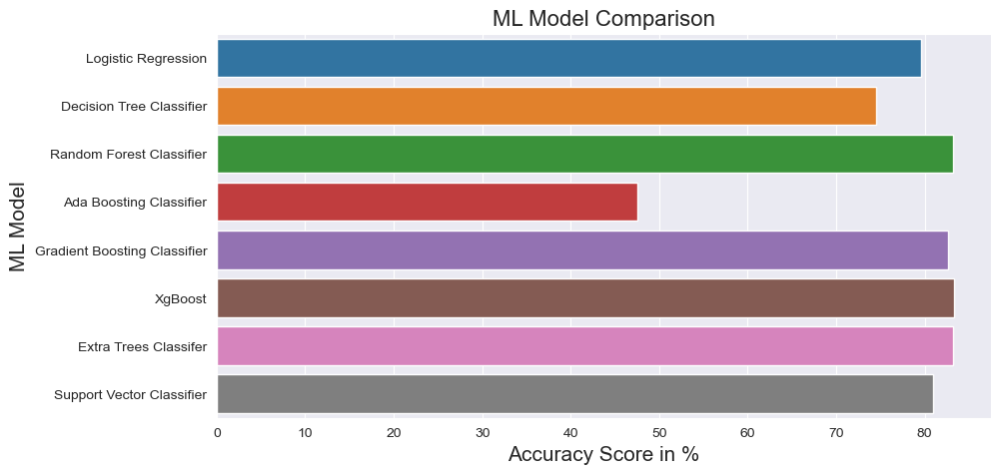

In [344]:
#Now focusing on the Accuracy Score....
plt.figure(figsize = (10, 5))
sns.set_style('darkgrid')

sns.barplot(x = 'Accuracy_Score', y = 'Model', data = models)

plt.xlabel('Accuracy Score in %', fontsize = 15)
plt.ylabel('ML Model', fontsize = 15)

plt.title('ML Model Comparison', fontsize = 16)

plt.show()

Now from the above diagram it seems that xgboost classifier(83.31%) has the highest Accuracy, However, our aim is to find the BEST MODEL, so if we consider the difference Between Accuracy_Score and Cross_Validation_Score....

# Step 6.1 - Comparing Differences between Accuracy and Cross_Validation Scores...

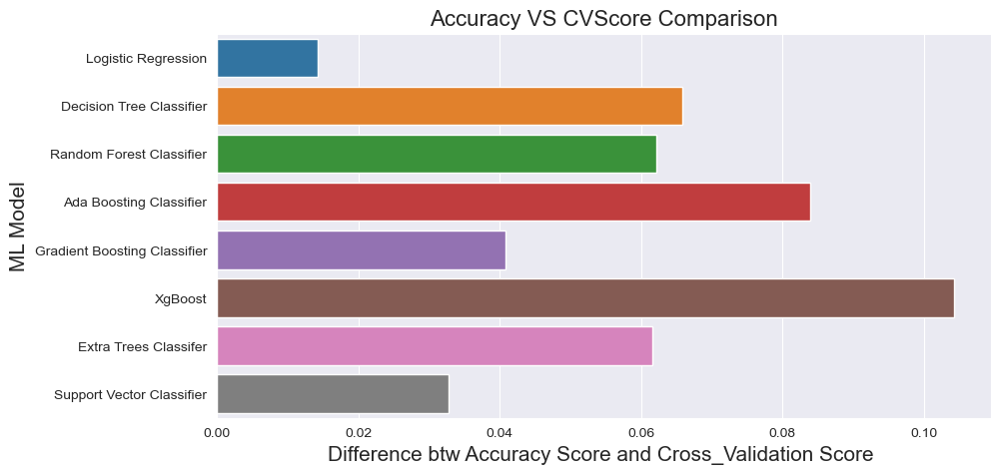

In [345]:
#Now focusing on the differnce btw Accuracy Score and Cross_Validation Scores
plt.figure(figsize = (10, 5))
sns.set_style('darkgrid')

sns.barplot(x = 'Accuracy_VS_CVScore', y = 'Model', data = models)

plt.xlabel('Difference btw Accuracy Score and Cross_Validation Score ', fontsize = 15)
plt.ylabel('ML Model', fontsize = 15)

plt.title('Accuracy VS CVScore Comparison', fontsize = 16)

plt.show()

From the above we can see the Model with least difference is Logistic regression!

# Step 6.2 - Conclusion on Choice of Model

From the above we can see:
 - The Model with least difference is Logistic regression!

# Hence Optimum Machine Model Chosen = Logistic Regression!

# Step 7 - HYPERPARAMETER TUNNING
 - Lets prepare list of parameters with options

In [346]:
param_grid = [    
    {'penalty' : ['l1', 'l2', 'elasticnet', 'none'],
    'C' : np.logspace(-10, 10, 20),
    'solver' : ['lbfgs','newton-cg','liblinear','sag','saga'],
    'max_iter' : [100, 1000,2500, 5000]
    }
]

In [347]:
#Gridsearch
gridsearch = GridSearchCV(lr, param_grid, cv=5,scoring="accuracy")
gridsearch.fit(x_train_ns, y_train_ns);

In [348]:
#Get best hyperparameters
gridsearch.best_params_

{'C': 1e-10, 'max_iter': 2500, 'penalty': 'none', 'solver': 'sag'}

Now lets use the best parameters.....

In [349]:
#Instantiating using the best parameters...
lr = LogisticRegression(C = 0.026366508987303555,
 max_iter = 100,
 penalty = 'l2',
 solver = 'lbfgs')

In [350]:
#fitting the model...
lr.fit(x_train_ns,y_train_ns)

LogisticRegression(C=0.026366508987303555)

In [351]:
pred_test=lr.predict(x_test)

In [352]:
accuracy_score(y_test,pred_test)

0.7948517940717629

# Step 8 - ROC AUC PLOT

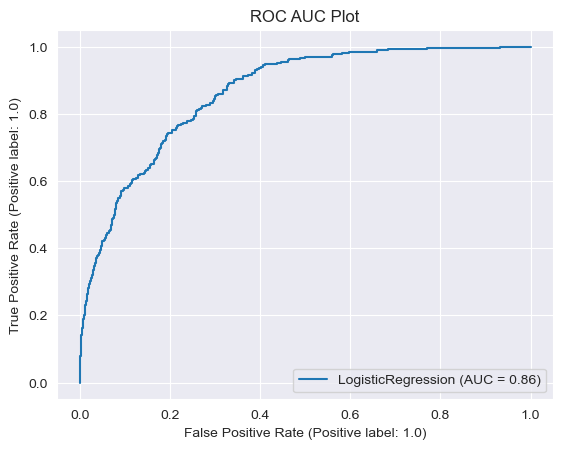

In [353]:
plot_roc_curve(lr,x_test,y_test)
plt.title("ROC AUC Plot")
plt.show()

In [ ]:
plot_roc_curve(rf,x_test,y_test)
plt.title("ROC AUC Plot")
plt.show()

From the above we can see:
- Final Accuracy is 79.40% and AUC Score is 86% 
- That the Logistic Regression Classifier has an AUC close to 1(i.e 0.86)

HENCE WE CAN CONCLUDE OUR MODEL IS PRETTY GOOD!!

# Step 8 - MODEL SAVING

In [246]:
filename='Machine_Model_Project_weather_prediction'
pickle.dump(sv,open(filename,'wb'))